**MODELING WITH TARGET SET BY THE BOUNDARIES OF FICO SCORE**

In [46]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

import pandas as pd
import numpy as np
from typing import Tuple, Dict
from pathlib import Path

from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.calibration import CalibratedClassifierCV

from sklearn.metrics import (
    roc_auc_score, average_precision_score, brier_score_loss,
    confusion_matrix, mean_squared_error, mean_absolute_error
)

# --- File & path configuration (use relative filenames by default) ---
# Place your CSV files in the same folder as this notebook or update the names below.
CSV_PATH = Path("final_date_version(Sheet1).csv")
MODEL_INPUT_CSV = Path("final_df1_holiday_flag_fixed-2 - Sheet1.csv")
MACRO_CSV = Path("macrodata_filled_realistic.csv")
RUNTIME_LOCKED = Path("df_runtime_only_locked.csv")
SCHEMA_PATH = Path("runtime_feature_registry.json")

def ensure_path(p: Path) -> Path:
    p = Path(p)
    if not p.exists():
        print(f"Warning: expected file not found: {p}. Please place the file or update the path variables.")
    return p

CSV_PATH = ensure_path(CSV_PATH)
MODEL_INPUT_CSV = ensure_path(MODEL_INPUT_CSV)
MACRO_CSV = ensure_path(MACRO_CSV)
RUNTIME_LOCKED = ensure_path(RUNTIME_LOCKED)
SCHEMA_PATH = ensure_path(SCHEMA_PATH)

TIME_COL    = "last_tx_date"
SCORE_COL   = "fico8"
GOOD_CUTOFF = 670

SCORE0 = 600
ODDS0  = 10
PDO    = 20

RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)
pd.set_option("display.max_columns", 200)


In [47]:
# Quick environment checker and optional installer (runs in the notebook)
# It will try to import key packages and install missing ones via pip.
import sys
import subprocess

required = [
    "numpy", "pandas", "scikit-learn", "matplotlib", "scipy", "joblib",
    "shap", "lightgbm"
]

missing = []
for pkg in required:
    try:
        __import__(pkg)
    except Exception:
        missing.append(pkg)

if missing:
    print("Missing packages detected:", missing)
    print("Attempting to install missing packages. This may take a few minutes...")
    for pkg in missing:
        try:
            subprocess.check_call([sys.executable, "-m", "pip", "install", pkg])
        except subprocess.CalledProcessError as e:
            print(f"Failed to install {pkg}:", e)
else:
    print("All required packages appear to be installed.")

# Print versions of key packages
import importlib
for pkg in ("numpy","pandas","sklearn","matplotlib","scipy","joblib","shap","lightgbm"):
    try:
        m = importlib.import_module(pkg)
        print(pkg, getattr(m, "__version__", "<unknown>"))
    except Exception:
        print(pkg, "not available")


Missing packages detected: ['scikit-learn']
Attempting to install missing packages. This may take a few minutes...
numpy 1.24.3
pandas 2.0.3
sklearn 1.3.0
matplotlib 3.7.2
scipy 1.11.1
joblib 1.2.0
shap 0.49.1
lightgbm 4.6.0
numpy 1.24.3
pandas 2.0.3
sklearn 1.3.0
matplotlib 3.7.2
scipy 1.11.1
joblib 1.2.0
shap 0.49.1
lightgbm 4.6.0


In [48]:
# Calibration comparison: Platt (sigmoid), Isotonic, and cross-validated calibration
# This cell runs only if a fitted base classifier (final_cls_base) exists from the modeling flow.
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import brier_score_loss

if 'final_cls_base' not in globals():
    print("final_cls_base not found in environment. Run the modeling cells first to produce the base classifier.")
else:
    print("Comparing calibration methods on validation set (if available)...")
    methods = [("sigmoid_prefit", {"method":"sigmoid","cv":"prefit"}),
               ("isotonic_prefit", {"method":"isotonic","cv":"prefit"}),
               ("cv_sigmoid", {"method":"sigmoid","cv":5}),
               ("cv_isotonic", {"method":"isotonic","cv":5})]

    results = []
    for name, opts in methods:
        try:
            if opts["cv"] == "prefit":
                # needs a separate calibration set; use val_mask
                if 'val_mask' not in globals():
                    print(name, "skipped: val_mask not present")
                    continue
                cal = CalibratedClassifierCV(final_cls_base, method=opts["method"], cv='prefit')
                cal.fit(X_all[val_mask], y_cls[val_mask])
                probs_val = cal.predict_proba(X_all[val_mask])[:,1]
                probs_test = cal.predict_proba(X_all[test_mask])[:,1]
            else:
                cal = CalibratedClassifierCV(final_cls_base, method=opts["method"], cv=opts["cv"]) 
                cal.fit(X_all[train_mask], y_cls[train_mask])
                probs_val = cal.predict_proba(X_all[val_mask])[:,1]
                probs_test = cal.predict_proba(X_all[test_mask])[:,1]

            brier_val = float(brier_score_loss(y_cls[val_mask], probs_val)) if 'val_mask' in globals() else np.nan
            brier_test = float(brier_score_loss(y_cls[test_mask], probs_test)) if 'test_mask' in globals() else np.nan
            results.append({"method":name, "brier_val":brier_val, "brier_test":brier_test})
            print(name, {"brier_val":brier_val, "brier_test":brier_test})
        except Exception as e:
            print(name, "failed:", e)

    print('\nSummary:')
    import pandas as pd
    if results:
        print(pd.DataFrame(results))
    else:
        print('No results produced; check that modeling cells have been run and masks are present.')


Comparing calibration methods on validation set (if available)...
sigmoid_prefit {'brier_val': 0.12325107243664299, 'brier_test': 0.1741879226200624}
sigmoid_prefit {'brier_val': 0.12325107243664299, 'brier_test': 0.1741879226200624}
isotonic_prefit {'brier_val': 0.09300000000000001, 'brier_test': 0.1831085403554426}
isotonic_prefit {'brier_val': 0.09300000000000001, 'brier_test': 0.1831085403554426}


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 

cv_sigmoid {'brier_val': 0.12736922312623322, 'brier_test': 0.12554056867066352}


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 

cv_isotonic {'brier_val': 0.12759459963530234, 'brier_test': 0.12072537017670967}

Summary:
            method  brier_val  brier_test
0   sigmoid_prefit   0.123251    0.174188
1  isotonic_prefit   0.093000    0.183109
2       cv_sigmoid   0.127369    0.125541
3      cv_isotonic   0.127595    0.120725


In [5]:
# Model export and optional SHAP importance (if the final pipelines exist)
import os
from joblib import dump

MODEL_DIR = Path("models")
MODEL_DIR.mkdir(exist_ok=True)

saved = []
if 'final_cls_pipe' in globals():
    cls_path = MODEL_DIR / "final_classifier.joblib"
    try:
        dump(final_cls_pipe, cls_path)
        saved.append(str(cls_path))
        print("Saved classifier to", cls_path)
    except Exception as e:
        print('Could not save classifier:', e)
else:
    print('final_cls_pipe not found; classifier not saved.')

if 'final_reg_pipe' in globals():
    reg_path = MODEL_DIR / "final_regressor.joblib"
    try:
        dump(final_reg_pipe, reg_path)
        saved.append(str(reg_path))
        print("Saved regressor to", reg_path)
    except Exception as e:
        print('Could not save regressor:', e)
else:
    print('final_reg_pipe not found; regressor not saved.')

# SHAP importance (works best with tree-based models). Run only if shap available and the model is tree-based.
try:
    import shap
    if 'final_cls_pipe' in globals():
        model = final_cls_pipe.named_steps.get('model', None)
        if model is not None and hasattr(model, 'feature_importances_'):
            # get transformed features (approx) by applying preprocessor to a small sample
            X_sample = X_all[test_mask].iloc[:500]
            Xt = final_cls_pipe.named_steps['prep'].transform(X_sample)
            expl = shap.TreeExplainer(model)
            shap_vals = expl.shap_values(Xt)
            print('Computed SHAP for classifier (approx).')
        else:
            print('Classifier is not tree-based or does not expose feature_importances_. Skipping SHAP.')
    else:
        print('No classifier pipeline available for SHAP.')
except Exception as e:
    print('SHAP not available or failed to compute:', e)

if saved:
    print('Artifacts saved:', saved)
else:
    print('No artifacts were saved.')


final_cls_pipe not found; classifier not saved.
final_reg_pipe not found; regressor not saved.
No classifier pipeline available for SHAP.
No artifacts were saved.


In [6]:
def SafeOneHotEncoder():
    try:
        return OneHotEncoder(handle_unknown="ignore", sparse_output=False)
    except TypeError:
        return OneHotEncoder(handle_unknown="ignore", sparse=False)

def compute_block_sizes(n_months: int, train=0.70, val=0.15, test=0.15) -> Tuple[int,int,int]:
    t_train = max(1, int(round(n_months * train)))
    t_val   = max(1, int(round(n_months * val)))
    t_test  = n_months - t_train - t_val
    if t_test <= 0:
        remaining = n_months - t_train
        t_test = max(1, remaining - t_val)
        t_val  = n_months - t_train - t_test
    return t_train, t_val, t_test

def eval_cls(y_true, p_hat) -> Dict[str, float]:
    y_true = np.asarray(y_true).astype(int)
    p_hat  = np.asarray(p_hat).astype(float)
    roc = roc_auc_score(y_true, p_hat) if len(np.unique(y_true)) > 1 else np.nan
    pr  = average_precision_score(y_true, p_hat)
    bri = brier_score_loss(y_true, p_hat)
    rmse = float(np.sqrt(mean_squared_error(y_true, p_hat)))
    mae  = mean_absolute_error(y_true, p_hat)
    return {"ROC_AUC": roc, "PR_AUC": pr, "Brier": bri, "RMSE": rmse, "MAE": mae}

def safe_confusion(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred, labels=[0,1])
    if cm.shape == (2,2):
        tn, fp, fn, tp = cm.ravel()
    else:
        tn = cm[0,0] if cm.shape[0] > 0 and cm.shape[1] > 0 else 0
        fp = cm[0,1] if cm.shape[0] > 0 and cm.shape[1] > 1 else 0
        fn = cm[1,0] if cm.shape[0] > 1 and cm.shape[1] > 0 else 0
        tp = cm[1,1] if cm.shape[0] > 1 and cm.shape[1] > 1 else 0
    return tn, fp, fn, tp

def threshold_table(y_true, p, cuts=np.round(np.linspace(0.1,0.9,9),2)) -> pd.DataFrame:
    rows=[]
    y_true = np.asarray(y_true).astype(int)
    p = np.asarray(p).astype(float)
    for t in cuts:
        yhat = (p >= t).astype(int)
        tn, fp, fn, tp = safe_confusion(y_true, yhat)
        prec = tp / (tp + fp + 1e-12)
        rec  = tp / (tp + fn + 1e-12)
        f1   = 2 * prec * rec / (prec + rec + 1e-12)
        rows.append({"threshold": t, "TN": tn, "FP": fp, "FN": fn, "TP": tp,
                     "precision": prec, "recall": rec, "F1": f1})
    return pd.DataFrame(rows)

def ks_statistic(y_true, p_hat):
    from scipy.stats import ks_2samp
    y_true = np.asarray(y_true).astype(int)
    p_hat  = np.asarray(p_hat).astype(float)
    pos = p_hat[y_true == 1]
    neg = p_hat[y_true == 0]
    if len(pos)==0 or len(neg)==0:
        return np.nan
    return ks_2samp(pos, neg).statistic

def lift_at_k(y_true, p_hat, k=0.1):
    y_true = np.asarray(y_true).astype(int)
    p_hat  = np.asarray(p_hat).astype(float)
    n = len(y_true)
    if n == 0:
        return np.nan
    k_n = max(1, int(round(k * n)))
    order = np.argsort(-p_hat)
    y_top = y_true[order][:k_n]
    base_rate = y_true.mean() + 1e-12
    return (y_top.mean() / base_rate)

def prob_to_score(p, score0=SCORE0, odds0=ODDS0, pdo=PDO):
    p = np.clip(p, 1e-6, 1 - 1e-6)
    odds = p / (1 - p)
    factor = pdo / np.log(2.0)
    offset = score0 - factor * np.log(odds0)
    return offset + factor * np.log(odds)

def build_preprocessor(categorical_cols, numeric_cols, scaled=False):
    transformers = []
    if len(categorical_cols) > 0:
        cat_proc = Pipeline([
            ("imputer", SimpleImputer(strategy="most_frequent")),
            ("onehot", SafeOneHotEncoder()),
        ])
        transformers.append(("cat", cat_proc, categorical_cols))
    if len(numeric_cols) > 0:
        if scaled:
            num_proc = Pipeline([
                ("imputer", SimpleImputer(strategy="median")),
                ("scaler", StandardScaler()),
            ])
        else:
            num_proc = Pipeline([
                ("imputer", SimpleImputer(strategy="median")),
            ])
        transformers.append(("num", num_proc, numeric_cols))
    return ColumnTransformer(transformers) if transformers else "passthrough"

def make_expanding_folds(months, k=3, train=0.70, val=0.15, test=0.15):
    N = len(months)
    folds = []
    for i in range(1, k+1):
        size_i = max(3, (N * i) // (k + 1))
        t, v, s = compute_block_sizes(size_i, train, val, test)
        tr_end  = min(t, N - 2)
        val_end = min(tr_end + v, N - 1)
        te_end  = min(val_end + s, N)
        tr = months[:tr_end]
        va = months[tr_end:val_end]
        te = months[val_end:te_end]
        if tr and va and te:
            folds.append((tr, va, te))
    return folds

**IMPLEMENTING DIFFERENT BASELINES**

In [7]:
df = pd.read_csv(CSV_PATH)

if "tradelines_total" in df.columns:
    df["thin_file_flag"] = (df["tradelines_total"] < 3).astype(int)
else:
    df["thin_file_flag"] = 0

assert TIME_COL in df.columns, f"{TIME_COL} not found."
assert SCORE_COL in df.columns, f"{SCORE_COL} not found."

df[TIME_COL] = pd.to_datetime(df[TIME_COL], errors="coerce")
df = df.dropna(subset=[TIME_COL]).copy()
df["ym"] = df[TIME_COL].dt.to_period("M").astype(str)
months = sorted(df["ym"].unique().tolist())
print(f"Months detected ({len(months)}): {months}")

df["good"] = (df[SCORE_COL] >= GOOD_CUTOFF).astype(int)

exclude_cols = {
    "customer_id", "dob", "gender", "ym", TIME_COL,
    SCORE_COL, "vantage4",
    "fraud_flag", "fraud_rate", "n_fraud_tx", "total_tx",
    "good"
}
feature_candidates = [c for c in df.columns if c not in exclude_cols]
numeric_cols     = [c for c in feature_candidates if pd.api.types.is_numeric_dtype(df[c])]
categorical_cols = [c for c in feature_candidates if pd.api.types.is_object_dtype(df[c])]

print(f"Numeric features ({len(numeric_cols)}): {numeric_cols[:15]}")
print(f"Categorical features ({len(categorical_cols)}): {categorical_cols[:15]}")

preprocess_tree   = build_preprocessor(categorical_cols, numeric_cols, scaled=False)
preprocess_scaled = build_preprocessor(categorical_cols, numeric_cols, scaled=True)

models = {
    "logistic": (preprocess_scaled, LogisticRegression(max_iter=500, class_weight="balanced", random_state=RANDOM_STATE)),
    "svm_rbf":  (preprocess_scaled, SVC(kernel="rbf", probability=True, class_weight="balanced", random_state=RANDOM_STATE)),
    "knn":      (preprocess_scaled, KNeighborsClassifier(n_neighbors=15)),
    "rf":       (preprocess_tree,   RandomForestClassifier(n_estimators=400, random_state=RANDOM_STATE, n_jobs=-1, class_weight="balanced")),
    "gbrt":     (preprocess_tree,   GradientBoostingClassifier(random_state=RANDOM_STATE)),
}

Months detected (24): ['2022-01', '2022-02', '2022-03', '2022-04', '2022-05', '2022-06', '2022-07', '2022-08', '2022-09', '2022-10', '2022-11', '2022-12', '2023-01', '2023-02', '2023-03', '2023-04', '2023-05', '2023-06', '2023-07', '2023-08', '2023-09', '2023-10', '2023-11', '2023-12']
Numeric features (25): ['tradelines_total', 'tradelines_open', 'revolving_limit_sum', 'revolving_balance_sum', 'revolving_utilization', 'total_balance_sum', 'delinq_24mo_count', 'worst_delinq_24mo', 'inquiries_12mo_hard', 'inquiries_12mo_soft', 'has_collection', 'collection_balance_total', 'has_bankruptcy', 'months_since_oldest_account', 'avg_account_age_months']
Categorical features (1): ['primary_state']


**TRAIN, TEST AND VALIDATION PART**

In [8]:
TRAIN_M, VAL_M, TEST_M = compute_block_sizes(len(months), 0.70, 0.15, 0.15)
window = TRAIN_M + VAL_M + TEST_M
n_folds = max(1, len(months) - window + 1)
print(f"Rolling CV config -> months={len(months)} | train={TRAIN_M} val={VAL_M} test={TEST_M} | folds={n_folds}")

expanding_folds = make_expanding_folds(months, k=3, train=0.70, val=0.15, test=0.15)
print(f"Expanding-window folds available: {len(expanding_folds)}")

use_expanding = len(expanding_folds) > 0
if use_expanding:
    fold_iter = enumerate(expanding_folds)
    print("Using expanding-window folds")
else:
    fold_iter = (
        (fold, (
            months[fold : fold + TRAIN_M],
            months[fold + TRAIN_M : fold + TRAIN_M + VAL_M],
            months[fold + TRAIN_M + VAL_M : fold + window],
        ))
        for fold in range(n_folds)
    )
    print("Using automatic rolling split")

Rolling CV config -> months=24 | train=17 val=4 test=3 | folds=1
Expanding-window folds available: 3
Using expanding-window folds


**CROSS VALIDATION FOLDS**

In [9]:
rows_metrics = []

for fold, (train_months, val_months, test_months) in fold_iter:
    df_train = df[df["ym"].isin(train_months)]
    df_val   = df[df["ym"].isin(val_months)]
    df_test  = df[df["ym"].isin(test_months)]
    if df_train.empty or df_val.empty or df_test.empty:
        continue

    X_train = df_train[categorical_cols + numeric_cols]; y_train = df_train["good"].values
    X_val   = df_val[categorical_cols + numeric_cols];   y_val   = df_val["good"].values
    X_test  = df_test[categorical_cols + numeric_cols];  y_test  = df_test["good"].values

    print(f"\nFold {fold}: train={train_months} | val={val_months} | test={test_months}")

    train_months_sorted = sorted(df_train["ym"].unique().tolist())
    cal_tail = max(1, int(round(0.2 * len(train_months_sorted))))
    train_core_months = train_months_sorted[:-cal_tail] if len(train_months_sorted) > cal_tail else train_months_sorted
    train_cal_months  = train_months_sorted[-cal_tail:] if cal_tail > 0 else train_months_sorted

    df_tr_core = df_train[df_train["ym"].isin(train_core_months)]
    df_tr_cal  = df_train[df_train["ym"].isin(train_cal_months)]

    X_tr_core = df_tr_core[categorical_cols + numeric_cols]; y_tr_core = df_tr_core["good"].values
    X_tr_cal  = df_tr_cal[categorical_cols + numeric_cols];  y_tr_cal  = df_tr_cal["good"].values

    for name, (prep, clf) in models.items():
        base_pipe = Pipeline([("prep", prep), ("model", clf)])
        base_pipe.fit(X_tr_core, y_tr_core)

        cal = CalibratedClassifierCV(estimator=base_pipe, method="sigmoid", cv="prefit")
        cal.fit(X_tr_cal, y_tr_cal)

        p_val  = cal.predict_proba(X_val)[:, 1]
        p_test = cal.predict_proba(X_test)[:, 1]

        m_val  = eval_cls(y_val, p_val)
        m_test = eval_cls(y_test, p_test)

        m_val["KS"]        = ks_statistic(y_val, p_val)
        m_val["LIFT@10%"]  = lift_at_k(y_val, p_val, k=0.10)
        m_test["KS"]       = ks_statistic(y_test, p_test)
        m_test["LIFT@10%"] = lift_at_k(y_test, p_test, k=0.10)

        rows_metrics.append({"fold": fold, "model": name, "split": "val",  **m_val})
        rows_metrics.append({"fold": fold, "model": name, "split": "test", **m_test})

        print(
            f"  {name:<8} | VAL: AUC={m_val['ROC_AUC']:.3f} PR={m_val['PR_AUC']:.3f} "
            f"Brier={m_val['Brier']:.3f} KS={m_val['KS']:.3f} "
            f"| TEST: AUC={m_test['ROC_AUC']:.3f} PR={m_test['PR_AUC']:.3f} "
            f"Brier={m_test['Brier']:.3f} KS={m_test['KS']:.3f}"
        )

metrics_df = pd.DataFrame(rows_metrics)


Fold 0: train=['2022-01', '2022-02', '2022-03', '2022-04'] | val=['2022-05'] | test=['2022-06']
  logistic | VAL: AUC=0.675 PR=0.642 Brier=0.219 KS=0.271 | TEST: AUC=0.670 PR=0.618 Brier=0.228 KS=0.465
  svm_rbf  | VAL: AUC=0.654 PR=0.686 Brier=0.231 KS=0.381 | TEST: AUC=0.583 PR=0.521 Brier=0.245 KS=0.189
  logistic | VAL: AUC=0.675 PR=0.642 Brier=0.219 KS=0.271 | TEST: AUC=0.670 PR=0.618 Brier=0.228 KS=0.465
  svm_rbf  | VAL: AUC=0.654 PR=0.686 Brier=0.231 KS=0.381 | TEST: AUC=0.583 PR=0.521 Brier=0.245 KS=0.189
  knn      | VAL: AUC=0.619 PR=0.562 Brier=0.234 KS=0.182 | TEST: AUC=0.611 PR=0.578 Brier=0.240 KS=0.189
  knn      | VAL: AUC=0.619 PR=0.562 Brier=0.234 KS=0.182 | TEST: AUC=0.611 PR=0.578 Brier=0.240 KS=0.189
  rf       | VAL: AUC=0.851 PR=0.811 Brier=0.175 KS=0.573 | TEST: AUC=0.774 PR=0.768 Brier=0.194 KS=0.415
  rf       | VAL: AUC=0.851 PR=0.811 Brier=0.175 KS=0.573 | TEST: AUC=0.774 PR=0.768 Brier=0.194 KS=0.415
  gbrt     | VAL: AUC=0.838 PR=0.846 Brier=0.165 KS=0.5

In [10]:
summary_df = (metrics_df
    .groupby(["model","split"], as_index=False)[["ROC_AUC","PR_AUC","Brier","RMSE","MAE"]]
    .mean(numeric_only=True)
    .sort_values(by=["split","ROC_AUC"], ascending=[True, False]))

print("\nAveraged metrics by model & split (CV): ")
print(summary_df.round(4).to_string(index=False))

by_ms = (metrics_df
    .groupby(["model","split"], as_index=False)
    .agg(ROC_mean=("ROC_AUC","mean"),
         ROC_std =("ROC_AUC", lambda x: np.nan if len(x)<2 else np.std(x, ddof=1)),
         PR_mean =("PR_AUC","mean"),
         Brier_mean=("Brier","mean")))

gaps = by_ms.pivot(index="model", columns="split", values="ROC_mean").reset_index()
gaps = gaps.rename_axis(None, axis=1).fillna(np.nan)
gaps["gen_gap_auc"] = gaps.get("val", np.nan) - gaps.get("test", np.nan)

instab = by_ms[by_ms["split"]=="test"][["model","ROC_std"]].rename(columns={"ROC_std":"test_auc_std"})
diag = gaps.merge(instab, on="model", how="left").sort_values("gen_gap_auc", ascending=False)

print("\nGeneralization diagnostics: ")
print(diag.round(4).to_string(index=False))

multi_fold = metrics_df["fold"].nunique() >= 2
if multi_fold:
    diag["overfit_flag"]   = (diag["gen_gap_auc"] > 0.05) | (diag["test_auc_std"] > 0.04)
    diag["underfit_flag"]  = (diag["val"] < 0.65) & (diag["test"] < 0.62) & (diag["gen_gap_auc"].abs() < 0.02)
    print("\nHeuristic flags: ")
    print(diag[["model","val","test","gen_gap_auc","test_auc_std","overfit_flag","underfit_flag"]]
          .round(4).to_string(index=False))
else:
    print("\nNote: Only one fold detected; variance-based flags are suppressed for reliability.")


Averaged metrics by model & split (CV): 
   model split  ROC_AUC  PR_AUC  Brier   RMSE    MAE
      rf  test   0.7856  0.7843 0.1897 0.4354 0.3779
    gbrt  test   0.7840  0.7941 0.1864 0.4316 0.3702
logistic  test   0.7073  0.6810 0.2216 0.4705 0.4400
 svm_rbf  test   0.6082  0.5870 0.2413 0.4912 0.4699
     knn  test   0.6009  0.5757 0.2445 0.4945 0.4790
      rf   val   0.8206  0.8019 0.1746 0.4174 0.3592
    gbrt   val   0.8133  0.8261 0.1721 0.4142 0.3512
logistic   val   0.7031  0.6713 0.2239 0.4730 0.4446
 svm_rbf   val   0.6203  0.6256 0.2369 0.4867 0.4645
     knn   val   0.5887  0.5365 0.2426 0.4925 0.4768

Generalization diagnostics: 
   model   test    val  gen_gap_auc  test_auc_std
      rf 0.7856 0.8206       0.0350        0.0192
    gbrt 0.7840 0.8133       0.0293        0.0386
 svm_rbf 0.6082 0.6203       0.0121        0.0231
logistic 0.7073 0.7031      -0.0043        0.0473
     knn 0.6009 0.5887      -0.0123        0.0192

Heuristic flags: 
   model    val   test  ge

**FINAL MODEL CHOSEN BASED ON FAVORABLE METRIC EVALUATION**

In [11]:
val_tbl = summary_df[summary_df["split"]=="val"].copy()
val_tbl = val_tbl.sort_values(by=["ROC_AUC","Brier"], ascending=[False, True]).reset_index(drop=True)
winner = val_tbl.iloc[0]["model"]
print(f"\nWinner (by VAL ROC_AUC): {winner}")
print(val_tbl.round(4).to_string(index=False))

TRAIN_M, VAL_M, TEST_M = compute_block_sizes(len(months), 0.70, 0.15, 0.15)
final_test_months = months[-TEST_M:]
train_months_all  = months[:-TEST_M]

cal_tail          = max(1, int(round(0.2 * len(train_months_all))))
train_core_months = train_months_all[:-cal_tail] if len(train_months_all) > cal_tail else train_months_all
train_cal_months  = train_months_all[-cal_tail:] if cal_tail > 0 else train_months_all

df_train_core = df[df["ym"].isin(train_core_months)]
df_train_cal  = df[df["ym"].isin(train_cal_months)]
df_test_final = df[df["ym"].isin(final_test_months)]

X_tr_core = df_train_core[categorical_cols + numeric_cols]; y_tr_core = df_train_core["good"].values
X_tr_cal  = df_train_cal[categorical_cols + numeric_cols];  y_tr_cal  = df_train_cal["good"].values
X_te      = df_test_final[categorical_cols + numeric_cols]; y_te      = df_test_final["good"].values

prep_w, clf_w = models[winner]

final_base = Pipeline([("prep", prep_w), ("model", clf_w)]).fit(X_tr_core, y_tr_core)
final_cal  = CalibratedClassifierCV(estimator=final_base, method="sigmoid", cv="prefit")
final_cal.fit(X_tr_cal, y_tr_cal)

p_final = final_cal.predict_proba(X_te)[:, 1]

final_metrics = {
    "ROC_AUC": roc_auc_score(y_te, p_final) if len(np.unique(y_te))>1 else np.nan,
    "PR_AUC":  average_precision_score(y_te, p_final),
    "Brier":   brier_score_loss(y_te, p_final),
    "RMSE":    float(np.sqrt(mean_squared_error(y_te, p_final))),
    "MAE":     mean_absolute_error(y_te, p_final),
    "KS":      ks_statistic(y_te, p_final),
    "LIFT@10%": lift_at_k(y_te, p_final, k=0.10),
}
print("\nFinal Holdout (latest months) — Calibrated P(creditworthy):")
for k,v in final_metrics.items():
    print(f"{k:>8s}: {v:.4f}")

tt = threshold_table(y_te, p_final)
print("\nThreshold table (precision/recall/F1) on P(good):")
print(tt.round(4).to_string(index=False))

scores_final = prob_to_score(p_final, score0=SCORE0, odds0=ODDS0, pdo=PDO)

cols = ["ym"]
if "customer_id" in df_test_final.columns:
    cols = ["customer_id"] + cols
preview = df_test_final[cols].copy()
preview["y_true_good"]    = y_te
preview["p_creditworthy"] = p_final
preview["credit_score"]   = scores_final

print("\nPreview: final holdout predictions (first 30 rows):")
with pd.option_context("display.max_columns", None):
    print(preview.head(30).to_string(index=False))

feat_rows = []
for c in categorical_cols:
    feat_rows.append({"feature": c, "dtype": "categorical", "pandas_dtype": str(df[c].dtype)})
for c in numeric_cols:
    feat_rows.append({"feature": c, "dtype": "numeric", "pandas_dtype": str(df[c].dtype)})
features_df = pd.DataFrame(feat_rows).sort_values(by=["dtype","feature"]).reset_index(drop=True)

print("\nFeatures used (first 40 rows):")
print(features_df.head(40).to_string(index=False))
print(f"\nTotal are numeric: {len(numeric_cols)}, categorical: {len(categorical_cols)} "
      f"which totals {len(numeric_cols)+len(categorical_cols)}")


Winner (by VAL ROC_AUC): rf
   model split  ROC_AUC  PR_AUC  Brier   RMSE    MAE
      rf   val   0.8206  0.8019 0.1746 0.4174 0.3592
    gbrt   val   0.8133  0.8261 0.1721 0.4142 0.3512
logistic   val   0.7031  0.6713 0.2239 0.4730 0.4446
 svm_rbf   val   0.6203  0.6256 0.2369 0.4867 0.4645
     knn   val   0.5887  0.5365 0.2426 0.4925 0.4768

Final Holdout (latest months) — Calibrated P(creditworthy):
 ROC_AUC: 0.8016
  PR_AUC: 0.7975
   Brier: 0.1767
    RMSE: 0.4203
     MAE: 0.3226
      KS: 0.4718
LIFT@10%: 2.3846

Threshold table (precision/recall/F1) on P(good):
 threshold  TN  FP  FN  TP  precision  recall     F1
       0.1  31  59   4  61     0.5083  0.9385 0.6595
       0.2  48  42   9  56     0.5714  0.8615 0.6871
       0.3  58  32  13  52     0.6190  0.8000 0.6980
       0.4  66  24  17  48     0.6667  0.7385 0.7007
       0.5  71  19  25  40     0.6780  0.6154 0.6452
       0.6  75  15  29  36     0.7059  0.5538 0.6207
       0.7  85   5  32  33     0.8684  0.5077 0.640

**AGGREGATED FEATURE CALCULATION**

In [12]:
import numpy as np
import pandas as pd

def _has(*cols):
    return all(c in df.columns for c in cols)

def zdiv(a, b):
    a = np.asarray(a, dtype="float64")
    b = np.asarray(b, dtype="float64")
    out = np.divide(a, b, out=np.zeros_like(a, dtype="float64"), where=(b!=0))
    return out

util_base = None
if "utilization_ratio" in df.columns:
    util_base = df["utilization_ratio"].astype(float)
elif "revolving_utilization" in df.columns:
    util_base = df["revolving_utilization"].astype(float)

income = df["monthly_salary"].astype(float) if "monthly_salary" in df.columns else pd.Series(np.nan, index=df.index)

if "thin_file_flag" not in df.columns and "tradelines_total" in df.columns:
    df["thin_file_flag"] = (df["tradelines_total"] < 3).astype(int)

if _has("tradelines_open","tradelines_total"):
    df["open_ratio"] = zdiv(df["tradelines_open"], df["tradelines_total"])
else:
    df["open_ratio"] = np.nan

if _has("revolving_limit_sum","tradelines_open"):
    df["rev_limit_per_line"] = zdiv(df["revolving_limit_sum"], df["tradelines_open"])
else:
    df["rev_limit_per_line"] = np.nan

if _has("revolving_balance_sum","total_balance_sum"):
    df["rev_share_total_bal"] = zdiv(df["revolving_balance_sum"], df["total_balance_sum"])
else:
    df["rev_share_total_bal"] = np.nan

if util_base is not None:
    df["util_clip"] = util_base.clip(lower=0, upper=1.5)
else:
    df["util_clip"] = np.nan

if "monthly_salary" in df.columns:
    inc = income.replace(0, np.nan)
    if "total_balance_sum" in df.columns:
        df["balance_to_income"] = (df["total_balance_sum"].astype(float) / inc).fillna(0)
    else:
        df["balance_to_income"] = np.nan
    if "revolving_balance_sum" in df.columns:
        df["revolving_to_income"] = (df["revolving_balance_sum"].astype(float) / inc).fillna(0)
    else:
        df["revolving_to_income"] = np.nan
    if "revolving_limit_sum" in df.columns:
        df["limit_to_income"] = (df["revolving_limit_sum"].astype(float) / inc).fillna(0)
    else:
        df["limit_to_income"] = np.nan
else:
    df["balance_to_income"]   = np.nan
    df["revolving_to_income"] = np.nan
    df["limit_to_income"]     = np.nan

if "delinq_24mo_count" in df.columns:
    df["any_delinq_24m"] = (df["delinq_24mo_count"].astype(float) > 0).astype(int)
else:
    df["any_delinq_24m"] = np.nan
if "worst_delinq_24mo" in df.columns:
    df["worst_delinq_1plus"] = (df["worst_delinq_24mo"].astype(float) >= 1).astype(int)
else:
    df["worst_delinq_1plus"] = np.nan

if "inquiries_12mo_hard" in df.columns:
    df["hard_inq_3plus"] = (df["inquiries_12mo_hard"].astype(float) >= 3).astype(int)
else:
    df["hard_inq_3plus"] = np.nan

if _has("inquiries_12mo_hard","tradelines_open"):
    df["inq_per_open_line"] = zdiv(df["inquiries_12mo_hard"], df["tradelines_open"])
else:
    df["inq_per_open_line"] = np.nan

def bucketize(x, bins, labels):
    return pd.cut(x, bins=bins, labels=labels, include_lowest=True, right=False)

if "avg_account_age_months" in df.columns:
    df["seasoning_bucket"] = bucketize(
        df["avg_account_age_months"].astype(float).fillna(0),
        bins=[0, 12, 36, 84, 10_000],
        labels=["<12m","12–36m","36–84m","≥84m"]
    )
else:
    df["seasoning_bucket"] = pd.Series(pd.Categorical([np.nan]*len(df), categories=["<12m","12–36m","36–84m","≥84m"]))

if "age" in df.columns:
    df["age_band"] = bucketize(
        df["age"].astype(float).fillna(0),
        bins=[0, 25, 35, 50, 200],
        labels=["<25","25–34","35–49","50+"]
    )
else:
    df["age_band"] = pd.Series(pd.Categorical([np.nan]*len(df), categories=["<25","25–34","35–49","50+"]))

if "experience_years" in df.columns:
    df["experienced_worker"] = (df["experience_years"].astype(float) >= 3).astype(int)
else:
    df["experienced_worker"] = np.nan

if "last_tx_date" in df.columns:
    ref_date = pd.to_datetime(df.get("score_date", df["last_tx_date"].max()))
    df["recency_days"] = (pd.to_datetime(ref_date) - pd.to_datetime(df["last_tx_date"])).dt.days.clip(lower=0)
else:
    df["recency_days"] = np.nan

df["tx_frequency"] = df["n_daily_tx"] if "n_daily_tx" in df.columns else np.nan
df["avg_ticket"]   = df["avg_tx_amount"] if "avg_tx_amount" in df.columns else np.nan

if "monthly_salary" in df.columns:
    inc = income.replace(0, np.nan)
    if "total_spend" in df.columns:
        df["spend_to_income"] = (df["total_spend"].astype(float) / inc).fillna(0)
    else:
        df["spend_to_income"] = np.nan
    if "avg_daily_spend" in df.columns:
        df["daily_spend_to_income"] = (df["avg_daily_spend"].astype(float) / (inc/30)).fillna(0)
    else:
        df["daily_spend_to_income"] = np.nan
else:
    df["spend_to_income"]       = np.nan
    df["daily_spend_to_income"] = np.nan

df["util_x_thin"]     = df["util_clip"] * df.get("thin_file_flag", 0)
df["inq_x_thin"]      = df.get("inquiries_12mo_hard", 0) * df.get("thin_file_flag", 0)
df["seasoned_x_util"] = df["util_clip"] * (df.get("avg_account_age_months", 0).astype(float) >= 36).astype(int)
df["income_x_util"]   = df["util_clip"] * df.get("monthly_salary", 0).astype(float)

for c in ["revolving_limit_sum","revolving_balance_sum","total_balance_sum",
          "total_tx_amount","total_spend","monthly_salary"]:
    df[f"log1p_{c}"] = np.log1p(df[c].clip(lower=0)) if c in df.columns else np.nan

exclude_cols = {
    "customer_id", "dob", "gender", "ym", "last_tx_date",
    "fico8", "vantage4", "fraud_flag", "fraud_rate", "n_fraud_tx",
    "total_tx", "good", "good_v2",
}
feature_candidates = [c for c in df.columns if c not in exclude_cols]
numeric_cols = [c for c in feature_candidates if pd.api.types.is_numeric_dtype(df[c])]
categorical_cols = [c for c in feature_candidates if pd.api.types.is_object_dtype(df[c])]

print(f"[Derived] Added engineered features. Now {len(numeric_cols)} numeric, {len(categorical_cols)} categorical.")

[Derived] Added engineered features. Now 52 numeric, 1 categorical.


**RUNTIME FEATURES**

In [13]:
import numpy as np
import pandas as pd

def zdiv(a, b):
    a = np.asarray(a, dtype="float64")
    b = np.asarray(b, dtype="float64")
    return np.divide(a, b, out=np.zeros_like(a, dtype="float64"), where=(b!=0))

def compute_runtime_features(
    tx_df: pd.DataFrame,
    now: pd.Timestamp | None = None,
    windows = ("15min","1H","6H","24H"),
    baseline_window = "90D"
) -> pd.DataFrame:
    if now is None:
        now = pd.Timestamp.utcnow()

    base_cols = ["customer_id","minutes_since_last_tx","hour_of_day","day_of_week","is_weekend",
                 "last_amount","pending_auth_sum","zscore_last_amount_90d",
                 "ratio_last_amount_to_p50_90d","burst_flag","consecutive_declines"]
    for w in windows:
        base_cols += [f"tx_count_{w}", f"tx_sum_{w}", f"tx_avg_{w}",
                      f"unique_merchants_{w}", f"unique_mcc_{w}",
                      f"decline_rate_{w}", f"card_present_ratio_{w}"]
    if tx_df is None or tx_df.empty:
        return pd.DataFrame(columns=base_cols)

    d = tx_df.copy()
    d = d.dropna(subset=["customer_id","ts"])
    d["ts"] = pd.to_datetime(d["ts"], utc=True)
    d = d.sort_values(["customer_id","ts"])
    d["amount"] = pd.to_numeric(d.get("amount", 0), errors="coerce").fillna(0.0)

    status = d.get("status")
    if status is not None:
        status = status.astype(str).str.lower()
        d["is_declined"] = status.eq("declined")
        d["is_authorized_open"] = status.eq("authorized")
    else:
        d["is_declined"] = False
        d["is_authorized_open"] = False

    if "entry_mode" in d.columns:
        entry = d["entry_mode"].astype(str).str.lower()
        d["is_card_present"] = entry.isin(["chip","swipe","tap","contact","card_present"])
    else:
        d["is_card_present"] = d.get("channel","").astype(str).str.lower().isin(["pos","in_store","card_present"])

    d["asof_now"] = now

    last_tx = d.groupby("customer_id")["ts"].max().to_frame("last_tx_ts")
    last_amt = d.groupby("customer_id")["amount"].last().to_frame("last_amount")
    feats = last_tx.join(last_amt, how="outer").reset_index()
    feats["minutes_since_last_tx"] = ((now - feats["last_tx_ts"]) / pd.Timedelta(minutes=1)).clip(lower=0)
    feats["hour_of_day"] = int(pd.Timestamp(now).tz_convert("UTC").hour) if getattr(now, "tzinfo", None) else int(pd.Timestamp(now).hour)
    feats["day_of_week"] = int(pd.Timestamp(now).dayofweek)  # 0=Mon
    feats["is_weekend"] = (feats["day_of_week"] >= 5).astype(int)

    d = d.set_index("ts")
    for w in windows:
        wmask = (d["asof_now"].iloc[0] - d.index <= pd.Timedelta(w))
        dw = d.loc[wmask]
        if dw.empty:
            continue
        g = dw.groupby("customer_id")
        chunk = pd.concat([
            g["amount"].size().rename(f"tx_count_{w}"),
            g["amount"].sum().rename(f"tx_sum_{w}"),
            g["amount"].mean().fillna(0.0).rename(f"tx_avg_{w}"),
            (g["merchant_id"].nunique().rename(f"unique_merchants_{w}") if "merchant_id" in dw.columns else pd.Series(dtype=float, name=f"unique_merchants_{w}")),
            (g["mcc"].nunique().rename(f"unique_mcc_{w}") if "mcc" in dw.columns else pd.Series(dtype=float, name=f"unique_mcc_{w}")),
            (g["is_declined"].mean().fillna(0.0).rename(f"decline_rate_{w}") if "is_declined" in dw.columns else pd.Series(dtype=float, name=f"decline_rate_{w}")),
            (g["is_card_present"].mean().fillna(0.0).rename(f"card_present_ratio_{w}") if "is_card_present" in dw.columns else pd.Series(dtype=float, name=f"card_present_ratio_{w}")),
        ], axis=1)
        feats = feats.merge(chunk, on="customer_id", how="left")

    pending = d[d["is_authorized_open"]].groupby("customer_id")["amount"].sum().rename("pending_auth_sum")
    feats = feats.merge(pending, on="customer_id", how="left")

    mask90 = (d["asof_now"].iloc[0] - d.index <= pd.Timedelta(baseline_window))
    d90 = d.loc[mask90]
    if not d90.empty:
        g90 = d90.groupby("customer_id")["amount"]
        stats = pd.concat([
            g90.mean().rename("amt_mu_90d"),
            g90.std(ddof=0).replace(0, np.nan).rename("amt_sd_90d"),
            g90.quantile(0.50).replace(0, np.nan).rename("amt_p50_90d"),
        ], axis=1).reset_index()
        feats = feats.merge(stats, on="customer_id", how="left")
        feats["zscore_last_amount_90d"] = (feats["last_amount"] - feats["amt_mu_90d"]) / feats["amt_sd_90d"]
        feats["ratio_last_amount_to_p50_90d"] = feats["last_amount"] / feats["amt_p50_90d"]
        feats = feats.drop(columns=["amt_mu_90d","amt_sd_90d","amt_p50_90d"], errors="ignore")

    mask5 = (d["asof_now"].iloc[0] - d.index <= pd.Timedelta("5min"))
    cnt5 = d.loc[mask5].groupby("customer_id")["amount"].size().rename("tx_count_5min")
    feats = feats.merge(cnt5, on="customer_id", how="left")
    feats["burst_flag"] = (feats["tx_count_5min"].fillna(0) >= 3).astype(int)
    feats = feats.drop(columns=["tx_count_5min"], errors="ignore")

    def last_k_declines(grp, k=2, lookback=10):
        tail = grp.tail(lookback)
        if "is_declined" not in tail.columns or tail.empty:
            return 0
        return int(tail["is_declined"].tail(k).all())

    cons_dec = (d.reset_index()
                  .sort_values(["customer_id","ts"])
                  .groupby("customer_id")
                  .apply(lambda g: last_k_declines(g, k=2, lookback=10))
                  .rename("consecutive_declines")
                  .reset_index())
    feats = feats.merge(cons_dec, on="customer_id", how="left")

    for c in feats.columns:
        if c != "customer_id":
            feats[c] = pd.to_numeric(feats[c], errors="ignore")
    numeric = feats.columns.drop("customer_id")
    feats[numeric] = feats[numeric].fillna(0)

    return feats

def integrate_offline_and_runtime(df_offline: pd.DataFrame, runtime_feats: pd.DataFrame) -> pd.DataFrame:
    out = df_offline.merge(runtime_feats, on="customer_id", how="left", suffixes=("", "_rt"))
    if set(["revolving_limit_sum","revolving_balance_sum","pending_auth_sum"]).issubset(out.columns):
        out["rt_utilization"] = zdiv(
            out["revolving_balance_sum"].astype(float) + out["pending_auth_sum"].astype(float),
            out["revolving_limit_sum"].astype(float)
        )
        out["rt_util_clip"] = out["rt_utilization"].clip(lower=0, upper=1.5)
    else:
        out["rt_utilization"] = np.nan
        out["rt_util_clip"] = np.nan

    if "thin_file_flag" in out.columns and "minutes_since_last_tx" in out.columns:
        out["thin_x_inactivity"] = out["thin_file_flag"].astype(float) * out["minutes_since_last_tx"].astype(float)

    return out

if "tx_df" not in globals():
    now = pd.Timestamp.utcnow()
    rows = []
    for _, r in df.iterrows():
        cid = r.get("customer_id")
        if pd.isna(cid):
            continue
        n_today = int(min(max((r.get("n_daily_tx") or 0), 0), 3))  # 0..3
        amt = r.get("avg_tx_amount")
        if pd.isna(amt) or (amt is None) or (amt == 0):
            denom = max(int(r.get("n_daily_tx") or 1), 1)
            proxy = (r.get("avg_daily_spend") or 0) / denom
            amt = proxy if proxy and proxy > 0 else np.random.uniform(15, 65)
        amt = float(amt)

        for i in range(n_today):
            rows.append({
                "customer_id": cid,
                "ts": now - pd.Timedelta(minutes=10*i + np.random.randint(0,4)),
                "amount": amt,
                "status": "cleared",
                "mcc": 5411 if i % 2 == 0 else 5999,
                "merchant_id": f"M{(hash(str(cid))+i) % 2000:04d}",
                "channel": "pos" if i % 2 == 0 else "ecommerce",
                "entry_mode": "chip" if i % 2 == 0 else "manual",
            })
    tx_df = pd.DataFrame(rows, columns=["customer_id","ts","amount","status","mcc","merchant_id","channel","entry_mode"])

_now = pd.Timestamp.utcnow()
rt_feats = compute_runtime_features(
    tx_df,
    now=_now,
    windows=("15min","1H","6H","24H"),
    baseline_window="90D"
)
df_scoring = integrate_offline_and_runtime(df, rt_feats)

print(f"[Scoring] Final features: {df_scoring.shape[1]} columns "
      f"({df.shape[1]} offline + {rt_feats.shape[1]-1} runtime incl. interactions).")

[Scoring] Final features: 109 columns (67 offline + 39 runtime incl. interactions).


In [14]:
df.head()

,customer_id,dob,primary_state,fico8,vantage4,tradelines_total,tradelines_open,revolving_limit_sum,revolving_balance_sum,revolving_utilization,total_balance_sum,delinq_24mo_count,worst_delinq_24mo,inquiries_12mo_hard,inquiries_12mo_soft,has_collection,collection_balance_total,has_bankruptcy,months_since_oldest_account,avg_account_age_months,avg_tx_amount,total_tx_amount,n_daily_tx,avg_daily_spend,total_spend,last_tx_date,n_fraud_tx,total_tx,fraud_rate,monthly_salary,gender,age,experience_years,utilization_ratio,fraud_flag,thin_file_flag,ym,good,open_ratio,rev_limit_per_line,rev_share_total_bal,util_clip,balance_to_income,revolving_to_income,limit_to_income,any_delinq_24m,worst_delinq_1plus,hard_inq_3plus,inq_per_open_line,seasoning_bucket,age_band,experienced_worker,recency_days,tx_frequency,avg_ticket,spend_to_income,daily_spend_to_income,util_x_thin,inq_x_thin,seasoned_x_util,income_x_util,log1p_revolving_limit_sum,log1p_revolving_balance_sum,log1p_total_balance_sum,log1p_total_tx_amount,log1p_total_spend,log1p_monthly_salary
0,1,1972-01-24 00:00:00,NJ,572,663,4,3,60000,40116.47,0.6686,344960.88,19,3,1,0,0,0,0,144,98.2,35.47,35.47,238,837.96,199434.08,2022-07-03 19:24:00,0,1322,0.000000,20830,Female,53,5,0.668608,0,0,2022-07,0,0.750000,20000.0,0.116293,0.668608,16.560772,1.925899,2.880461,1,1,0,0.333333,≥84m,50+,1,545,238,35.47,9.574368,1.206855,0.0,0,0.668608,13927.101161,11.002117,10.599567,12.751189,3.596490,12.203244,9.944198
1,2,1980-04-05 00:00:00,FL,546,729,4,0,30000,17824.57,0.5942,489705.83,17,3,0,2,0,0,0,105,82.5,2552.72,2552.72,225,206.97,46569.03,2023-08-26 10:37:00,0,1871,0.000000,4170,Male,45,1,0.594152,0,0,2023-08,0,0.000000,0.0,0.036399,0.594152,117.435451,4.274477,7.194245,1,1,0,0.000000,36–84m,35–49,0,127,225,2552.72,11.167633,1.488993,0.0,0,0.594152,2477.615229,10.308986,9.788389,13.101562,7.845306,10.748712,8.335911
2,3,1999-02-19 00:00:00,MI,690,503,3,1,30000,29169.96,0.9723,188658.81,8,3,1,1,0,0,0,158,124.7,115.97,115.97,251,481.01,120732.75,2023-03-02 06:17:00,0,1230,0.000000,14170,Female,26,3,0.972332,0,0,2023-03,1,0.333333,30000.0,0.154618,0.972332,13.313960,2.058572,2.117149,1,1,0,1.000000,≥84m,25–34,1,304,251,115.97,8.520307,1.018370,0.0,0,0.972332,13777.944440,10.308986,10.280929,12.147701,4.761917,11.701343,9.558953
3,4,1967-01-03 00:00:00,AZ,613,486,4,1,15000,5724.40,0.3816,12720.57,9,3,0,2,0,0,0,134,53.0,11.31,11.31,195,184.25,35927.93,2022-11-27 01:26:00,10,829,0.012063,2080,Male,58,2,0.381627,1,0,2022-11,0,0.250000,15000.0,0.450011,0.381627,6.115659,2.752115,7.211538,1,1,0,0.000000,36–84m,50+,0,399,195,11.31,17.273043,2.657452,0.0,0,0.381627,793.783467,9.615872,8.652668,9.451054,2.510412,10.489298,7.640604
4,5,1979-09-20 00:00:00,CA,653,701,3,0,1000,760.13,0.7601,169228.40,7,3,1,1,0,0,0,126,79.3,62.21,62.21,178,56.38,10035.07,2022-08-17 10:58:00,0,1561,0.000000,3100,Male,46,1,0.760130,0,0,2022-08,0,0.000000,0.0,0.004492,0.760130,54.589806,0.245203,0.322581,1,1,0,0.000000,36–84m,35–49,0,501,178,62.21,3.237119,0.545613,0.0,0,0.760130,2356.403000,6.908755,6.634804,12.039010,4.146463,9.213941,8.039480


In [15]:
df_scoring

,customer_id,dob,primary_state,fico8,vantage4,tradelines_total,tradelines_open,revolving_limit_sum,revolving_balance_sum,revolving_utilization,total_balance_sum,delinq_24mo_count,worst_delinq_24mo,inquiries_12mo_hard,inquiries_12mo_soft,has_collection,collection_balance_total,has_bankruptcy,months_since_oldest_account,avg_account_age_months,avg_tx_amount,total_tx_amount,n_daily_tx,avg_daily_spend,total_spend,last_tx_date,n_fraud_tx,total_tx,fraud_rate,monthly_salary,gender,age,experience_years,utilization_ratio,fraud_flag,thin_file_flag,ym,good,open_ratio,rev_limit_per_line,rev_share_total_bal,util_clip,balance_to_income,revolving_to_income,limit_to_income,any_delinq_24m,worst_delinq_1plus,hard_inq_3plus,inq_per_open_line,seasoning_bucket,age_band,experienced_worker,recency_days,tx_frequency,avg_ticket,spend_to_income,daily_spend_to_income,util_x_thin,inq_x_thin,seasoned_x_util,income_x_util,log1p_revolving_limit_sum,log1p_revolving_balance_sum,log1p_total_balance_sum,log1p_total_tx_amount,log1p_total_spend,log1p_monthly_salary,last_tx_ts,last_amount,minutes_since_last_tx,hour_of_day,day_of_week,is_weekend,tx_count_15min,tx_sum_15min,tx_avg_15min,unique_merchants_15min,unique_mcc_15min,decline_rate_15min,card_present_ratio_15min,tx_count_1H,tx_sum_1H,tx_avg_1H,unique_merchants_1H,unique_mcc_1H,decline_rate_1H,card_present_ratio_1H,tx_count_6H,tx_sum_6H,tx_avg_6H,unique_merchants_6H,unique_mcc_6H,decline_rate_6H,card_present_ratio_6H,tx_count_24H,tx_sum_24H,tx_avg_24H,unique_merchants_24H,unique_mcc_24H,decline_rate_24H,card_present_ratio_24H,pending_auth_sum,zscore_last_amount_90d,ratio_last_amount_to_p50_90d,burst_flag,consecutive_declines,rt_utilization,rt_util_clip,thin_x_inactivity
0,1,1972-01-24 00:00:00,NJ,572,663,4,3,60000,40116.47,0.6686,344960.88,19,3,1,0,0,0,0,144,98.2,35.47,35.47,238,837.96,199434.08,2022-07-03 19:24:00,0,1322,0.000000,20830,Female,53,5,0.668608,0,0,2022-07,0,0.750000,20000.0,0.116293,0.668608,16.560772,1.925899,2.880461,1,1,0,0.333333,≥84m,50+,1,545,238,35.47,9.574368,1.206855,0.0,0,0.668608,13927.101161,11.002117,10.599567,12.751189,3.596490,12.203244,9.944198,1764567729354804000,35.47,2.002432,5,0,0,2,70.94,35.47,2,2,0.0,0.5,3,106.41,35.47,3,2,0.0,0.666667,3,106.41,35.47,3,2,0.0,0.666667,3,106.41,35.47,3,2,0.0,0.666667,0.0,0.0,1.0,0,0,0.668608,0.668608,0.0
1,2,1980-04-05 00:00:00,FL,546,729,4,0,30000,17824.57,0.5942,489705.83,17,3,0,2,0,0,0,105,82.5,2552.72,2552.72,225,206.97,46569.03,2023-08-26 10:37:00,0,1871,0.000000,4170,Male,45,1,0.594152,0,0,2023-08,0,0.000000,0.0,0.036399,0.594152,117.435451,4.274477,7.194245,1,1,0,0.000000,36–84m,35–49,0,127,225,2552.72,11.167633,1.488993,0.0,0,0.594152,2477.615229,10.308986,9.788389,13.101562,7.845306,10.748712,8.335911,1764567729354804000,2552.72,2.002432,5,0,0,2,5105.44,2552.72,2,2,0.0,0.5,3,7658.16,2552.72,3,2,0.0,0.666667,3,7658.16,2552.72,3,2,0.0,0.666667,3,7658.16,2552.72,3,2,0.0,0.666667,0.0,0.0,1.0,0,0,0.594152,0.594152,0.0
2,3,1999-02-19 00:00:00,MI,690,503,3,1,30000,29169.96,0.9723,188658.81,8,3,1,1,0,0,0,158,124.7,115.97,115.97,251,481.01,120732.75,2023-03-02 06:17:00,0,1230,0.000000,14170,Female,26,3,0.972332,0,0,2023-03,1,0.333333,30000.0,0.154618,0.972332,13.313960,2.058572,2.117149,1,1,0,1.000000,≥84m,25–34,1,304,251,115.97,8.520307,1.018370,0.0,0,0.972332,13777.944440,10.308986,10.280929,12.147701,4.761917,11.701343,9.558953,1764567849354804000,115.97,0.002432,5,0,0,2,231.94,115.97,2,2,0.0,0.5,3,347.91,115.97,3,2,0.0,0.666667,3,347.91,115.97,3,2,0.0,0.666667,3,347.91,115.97,3,2,0.0,0.666667,0.0,0.0,1.0,0,0,0.972332,0.972332,0.0
3,4,1967-01-03 00:00:00,AZ,613,486,4,1,15000,5724.40,0.3816,12720.57,9,3,0,2,0,0,0,134,53.0,11.31,11.31,195,184.25,35927.93,2022-11-27 01:26:00,10,829,0.012063,2080,Male,58,2,0.381627,1,0,2022-11,0,0.250000,15000.0,0.450011,0.381627,6.115659,2.752115,7.211538,1,1,0,0.000000,36–84m,50+,0,399,195,11.31,17.273043,2.657452,0.0,0,0.381627,793.783467,9.615872,8.652668,9.451054,2.510412,10.489298,7.640604,1764567789354804

In [16]:
print("df shape:", df.shape)
print("tx_df shape:", tx_df.shape if 'tx_df' in globals() else None)
print("rt_feats shape:", rt_feats.shape)
print("df_scoring shape:", df_scoring.shape)

nulls = df_scoring.isna().mean().sort_values(ascending=False).head(15)
print("[Top null columns]\n", nulls)

display(df_scoring.head(3))

df shape: (1200, 67)
tx_df shape: (3600, 8)
rt_feats shape: (1200, 40)
df_scoring shape: (1200, 109)
[Top null columns]
 gender                      0.970833
util_x_thin                 0.061667
util_clip                   0.061667
seasoned_x_util             0.061667
income_x_util               0.061667
utilization_ratio           0.061667
card_present_ratio_15min    0.000000
decline_rate_15min          0.000000
unique_mcc_15min            0.000000
unique_merchants_15min      0.000000
tx_avg_15min                0.000000
tx_sum_15min                0.000000
tx_count_15min              0.000000
is_weekend                  0.000000
day_of_week                 0.000000
dtype: float64


,customer_id,dob,primary_state,fico8,vantage4,tradelines_total,tradelines_open,revolving_limit_sum,revolving_balance_sum,revolving_utilization,total_balance_sum,delinq_24mo_count,worst_delinq_24mo,inquiries_12mo_hard,inquiries_12mo_soft,has_collection,collection_balance_total,has_bankruptcy,months_since_oldest_account,avg_account_age_months,avg_tx_amount,total_tx_amount,n_daily_tx,avg_daily_spend,total_spend,last_tx_date,n_fraud_tx,total_tx,fraud_rate,monthly_salary,gender,age,experience_years,utilization_ratio,fraud_flag,thin_file_flag,ym,good,open_ratio,rev_limit_per_line,rev_share_total_bal,util_clip,balance_to_income,revolving_to_income,limit_to_income,any_delinq_24m,worst_delinq_1plus,hard_inq_3plus,inq_per_open_line,seasoning_bucket,age_band,experienced_worker,recency_days,tx_frequency,avg_ticket,spend_to_income,daily_spend_to_income,util_x_thin,inq_x_thin,seasoned_x_util,income_x_util,log1p_revolving_limit_sum,log1p_revolving_balance_sum,log1p_total_balance_sum,log1p_total_tx_amount,log1p_total_spend,log1p_monthly_salary,last_tx_ts,last_amount,minutes_since_last_tx,hour_of_day,day_of_week,is_weekend,tx_count_15min,tx_sum_15min,tx_avg_15min,unique_merchants_15min,unique_mcc_15min,decline_rate_15min,card_present_ratio_15min,tx_count_1H,tx_sum_1H,tx_avg_1H,unique_merchants_1H,unique_mcc_1H,decline_rate_1H,card_present_ratio_1H,tx_count_6H,tx_sum_6H,tx_avg_6H,unique_merchants_6H,unique_mcc_6H,decline_rate_6H,card_present_ratio_6H,tx_count_24H,tx_sum_24H,tx_avg_24H,unique_merchants_24H,unique_mcc_24H,decline_rate_24H,card_present_ratio_24H,pending_auth_sum,zscore_last_amount_90d,ratio_last_amount_to_p50_90d,burst_flag,consecutive_declines,rt_utilization,rt_util_clip,thin_x_inactivity
0,1,1972-01-24 00:00:00,NJ,572,663,4,3,60000,40116.47,0.6686,344960.88,19,3,1,0,0,0,0,144,98.2,35.47,35.47,238,837.96,199434.08,2022-07-03 19:24:00,0,1322,0.0,20830,Female,53,5,0.668608,0,0,2022-07,0,0.750000,20000.0,0.116293,0.668608,16.560772,1.925899,2.880461,1,1,0,0.333333,≥84m,50+,1,545,238,35.47,9.574368,1.206855,0.0,0,0.668608,13927.101161,11.002117,10.599567,12.751189,3.596490,12.203244,9.944198,1764567729354804000,35.47,2.002432,5,0,0,2,70.94,35.47,2,2,0.0,0.5,3,106.41,35.47,3,2,0.0,0.666667,3,106.41,35.47,3,2,0.0,0.666667,3,106.41,35.47,3,2,0.0,0.666667,0.0,0.0,1.0,0,0,0.668608,0.668608,0.0
1,2,1980-04-05 00:00:00,FL,546,729,4,0,30000,17824.57,0.5942,489705.83,17,3,0,2,0,0,0,105,82.5,2552.72,2552.72,225,206.97,46569.03,2023-08-26 10:37:00,0,1871,0.0,4170,Male,45,1,0.594152,0,0,2023-08,0,0.000000,0.0,0.036399,0.594152,117.435451,4.274477,7.194245,1,1,0,0.000000,36–84m,35–49,0,127,225,2552.72,11.167633,1.488993,0.0,0,0.594152,2477.615229,10.308986,9.788389,13.101562,7.845306,10.748712,8.335911,1764567729354804000,2552.72,2.002432,5,0,0,2,5105.44,2552.72,2,2,0.0,0.5,3,7658.16,2552.72,3,2,0.0,0.666667,3,7658.16,2552.72,3,2,0.0,0.666667,3,7658.16,2552.72,3,2,0.0,0.666667,0.0,0.0,1.0,0,0,0.594152,0.594152,0.0
2,3,1999-02-19 00:00:00,MI,690,503,3,1,30000,29169.96,0.9723,188658.81,8,3,1,1,0,0,0,158,124.7,115.97,115.97,251,481.01,120732.75,2023-03-02 06:17:00,0,1230,0.0,14170,Female,26,3,0.972332,0,0,2023-03,1,0.333333,30000.0,0.154618,0.972332,13.313960,2.058572,2.117149,1,1,0,1.000000,≥84m,25–34,1,304,251,115.97,8.520307,1.018370,0.0,0,0.972332,13777.944440,10.308986,10.280929,12.147701,4.761917,11.701343,9.558953,1764567849354804000,115.97,0.002432,5,0,0,2,231.94,115.97,2,2,0.0,0.5,3,347.91,115.97,3,2,0.0,0.666667,3,347.91,115.97,3,2,0.0,0.666667,3,347.91,115.97,3,2,0.0,0.666667,0.0,0.0,1.0,0,0,0.972332,0.972332,0.0


In [17]:
def _num(x): return pd.to_numeric(x, errors="coerce")
def _entropy_from_counts(s):
    total = float(s.sum())
    if total <= 0: return 0.0
    p = (s / total).values
    p = p[p>0]
    return float(-(p*np.log(p)).sum())

def add_runtime_mcc_features(df_scoring, tx_df):
    if tx_df is None or tx_df.empty or "mcc" not in tx_df.columns:
        df_scoring["cf_expense_entropy_30d"] = np.nan
        df_scoring["beh_cash_intensity_30d"] = np.nan
        return df_scoring
    d = tx_df.copy()
    d["ts"] = pd.to_datetime(d["ts"], utc=True)
    d["amount"] = _num(d["amount"]).fillna(0.0)
    d = d[d["ts"] >= (pd.Timestamp.utcnow() - pd.Timedelta("30D"))]
    ent = (d.groupby(["customer_id","mcc"])["amount"].sum()
             .reset_index()
             .groupby("customer_id")
             .apply(lambda g: _entropy_from_counts(g.set_index("mcc")["amount"]))
             .rename("cf_expense_entropy_30d")
             .reset_index())
    total = d.groupby("customer_id")["amount"].sum()
    cash = d[d["mcc"].astype(str)=="6011"].groupby("customer_id")["amount"].sum()
    cash_share = (cash/total).replace([np.inf,-np.inf], np.nan).fillna(0.0).rename("beh_cash_intensity_30d").reset_index()
    out = df_scoring.merge(ent, on="customer_id", how="left")
    out = out.merge(cash_share, on="customer_id", how="left")
    return out

df_scoring = add_runtime_mcc_features(df_scoring, tx_df)

In [18]:
def add_seasonality(df):
    if "ym" not in df.columns:
        df["beh_seasonality_index_12m"] = np.nan
        df["beh_holiday_spike_flag"] = np.nan
        return df
    w = df.copy()
    w["ym"] = pd.to_datetime(w["ym"], errors="coerce").dt.to_period("M").dt.to_timestamp()
    w["spend_proxy"] = _num(w.get("total_spend", np.nan)).fillna(_num(w.get("avg_daily_spend", np.nan))*30)
    w = w.sort_values(["customer_id","ym"])
    g = w.groupby("customer_id", group_keys=False)
    def compute(gr):
        s = gr["spend_proxy"].astype(float)
        tail = s.tail(12).dropna()
        idx = float(tail.std(ddof=0)/tail.mean()) if len(tail)>=4 and tail.mean()>0 else np.nan
        med3 = s.shift(1).rolling(3, min_periods=2).median()
        spike = int((s > 1.5*med3).tail(1).fillna(False).iloc[0]) if len(s) else 0
        gr.loc[gr.index.max(),"beh_seasonality_index_12m"] = idx
        gr.loc[gr.index.max(),"beh_holiday_spike_flag"] = spike
        return gr
    w = g.apply(compute)
    w[["beh_seasonality_index_12m","beh_holiday_spike_flag"]] = (
        w.groupby("customer_id")[["beh_seasonality_index_12m","beh_holiday_spike_flag"]].ffill()
    )
    latest = w.sort_values(["customer_id","ym"]).groupby("customer_id").tail(1)
    return df_scoring.merge(latest[["customer_id","beh_seasonality_index_12m","beh_holiday_spike_flag"]],
                            on="customer_id", how="left")

df_scoring = add_seasonality(df if "ym" in df.columns else df_scoring)

In [19]:
import numpy as np
import pandas as pd

def add_geo_macro(df_scoring, macro_path="/content/macrodata_filled_realistic.csv"):
    out = df_scoring.copy()

    if "primary_state" not in out.columns:
        for c in ["bf_local_unemployment","bf_local_inflation","bf_regional_perf_index"]:
            if c not in out.columns:
                out[c] = np.nan
        return out

    out["primary_state"] = out["primary_state"].astype(str).str.strip()

    if "ym" in out.columns:
        out["ym"] = pd.to_datetime(out["ym"], errors="coerce").dt.to_period("M").dt.to_timestamp()

    try:
        macro = pd.read_csv(macro_path)
    except Exception:
        for c in ["bf_local_unemployment","bf_local_inflation","bf_regional_perf_index"]:
            if c not in out.columns:
                out[c] = np.nan
        return out

    macro = macro.rename(columns={c: c.strip().lower() for c in macro.columns})

    geo_candidates  = ["primary_state","state","state_code","state_abbrev","region","province"]
    time_candidates = ["ym","date","month","asof_date"]

    macro_geo  = next((c for c in geo_candidates  if c in macro.columns), None)
    macro_time = next((c for c in time_candidates if c in macro.columns), None)

    if macro_geo is None:
        for c in ["bf_local_unemployment","bf_local_inflation","bf_regional_perf_index"]:
            if c not in out.columns:
                out[c] = np.nan
        return out

    macro[macro_geo] = macro[macro_geo].astype(str).str.strip()

    if macro_time is not None:
        macro[macro_time] = pd.to_datetime(macro[macro_time], errors="coerce").dt.to_period("M").dt.to_timestamp()

    rename_map = {}
    for cand in ["unemployment_rate","unemployment","unemp_rate","jobless_rate"]:
        if cand in macro.columns:
            rename_map[cand] = "bf_local_unemployment"; break
    for cand in ["inflation","cpi_yoy","cpi","inflation_rate"]:
        if cand in macro.columns:
            rename_map[cand] = "bf_local_inflation"; break
    for cand in ["regional_perf_index","regional_index","stress_index","lending_index"]:
        if cand in macro.columns:
            rename_map[cand] = "bf_regional_perf_index"; break

    macro = macro.rename(columns=rename_map)

    keep_cols = [macro_geo] + [c for c in ["bf_local_unemployment","bf_local_inflation","bf_regional_perf_index"] if c in macro.columns]
    if macro_time is not None:
        keep_cols.append(macro_time)
    macro = macro[keep_cols].copy()

    if macro_geo != "primary_state":
        macro = macro.rename(columns={macro_geo: "primary_state"})

    out["primary_state"]   = out["primary_state"].str.upper()
    macro["primary_state"] = macro["primary_state"].str.upper()

    left_on  = ["primary_state"]
    right_on = ["primary_state"]
    if ("ym" in out.columns) and (macro_time is not None):
        left_on.append("ym")
        right_on.append(macro_time)

    merged = out.merge(macro, how="left", left_on=left_on, right_on=right_on)

    if ("ym" in out.columns) and (macro_time is not None) and (macro_time != "ym") and (macro_time in merged.columns):
        merged = merged.drop(columns=[macro_time])

    for c in ["bf_local_unemployment","bf_local_inflation","bf_regional_perf_index"]:
        if c not in merged.columns:
            merged[c] = np.nan

    return merged

In [20]:
m_path = MACRO_CSV
if m_path.exists():
    m = pd.read_csv(m_path)
    print("macro columns:", list(m.columns))
    print(m.head(3))
else:
    print(f"Macro CSV not found at {m_path}; skipping macro preview. If you have macro data, place it at this path or update MACRO_CSV.")
    m = pd.DataFrame()


macro columns: ['month', 'RPI', 'INDPRO', 'CE16OV', 'UNRATE', 'PAYEMS', 'USGOOD', 'USTPU', 'HOUST', 'PERMIT', 'DPCERA3M086SBEA', 'AMTMTI', 'AMTMNO', 'ACOGNO', 'AMDMUO', 'BUSINV', 'ISRATIO', 'M1SL', 'M2SL', 'TOTRESNS', 'BUSLOANS', 'REALLN', 'DTCTHFNM', 'FEDFUNDS', 'TB3MS', 'TB6MS', 'GS1', 'GS5', 'GS10', 'AAA', 'TB3SMFFM', 'T1YFFM', 'AAAFFM', 'EXSZUS', 'EXCAUS', 'EXUSUK', 'WPSFD49207', 'WPSID61', 'CPIAUCSL', 'SP500', 'NASDAQ', 'GOLDBAR', 'Regime', 'P/E', 'Dividend Yield']
     month          RPI     INDPRO         CE16OV    UNRATE         PAYEMS  \
0  1996-01  8936.475241  74.163235  124736.506925  5.625299  119085.348613   
1  1996-02  8928.012039  77.168854  125537.448076  5.477157  119656.037058   
2  1996-03  9118.999594  75.235609  125869.765830  5.403328  121048.536119   

         USGOOD         USTPU        HOUST       PERMIT  DPCERA3M086SBEA  \
0  22820.012900  24091.385310  1445.206805  1374.997695        63.846023   
1  22776.388973  23977.344447  1504.578170  1413.861237     

In [21]:
import numpy as np
import pandas as pd

def _pct_change(series, periods=12):
    s = pd.to_numeric(series, errors="coerce")
    return s.pct_change(periods=periods)

def _roll_std(series, window):
    s = pd.to_numeric(series, errors="coerce")
    return s.rolling(window, min_periods=max(3, window//3)).std()

def build_national_macro_features(csv_path=None):
    if csv_path is None:
        csv_path = MACRO_CSV
    m_path = Path(csv_path)
    if not m_path.exists():
        print(f"Macro file not found at {m_path}. Returning empty macro features.")
        return pd.DataFrame({"ym": []})

    m = pd.read_csv(m_path)
    date_col = "Unnamed: 0"
    if date_col not in m.columns:
        date_col = m.columns[0]
    m[date_col] = pd.to_datetime(m[date_col], errors="coerce")
    m = m.sort_values("date").dropna(subset=[date_col]) if date_col in m.columns else m
    m = m.rename(columns={date_col: "date"})

    m = m.sort_values("date").dropna(subset=["date"]) if "date" in m.columns else m

    UNRATE   = pd.to_numeric(m.get("UNRATE"), errors="coerce")
    CPI      = pd.to_numeric(m.get("CPIAUCSL"), errors="coerce")
    INDPRO   = pd.to_numeric(m.get("INDPRO"), errors="coerce")
    RPI      = pd.to_numeric(m.get("RPI"), errors="coerce")
    GS10     = pd.to_numeric(m.get("GS10"), errors="coerce")
    GS1      = pd.to_numeric(m.get("GS1"), errors="coerce")
    FEDFUNDS = pd.to_numeric(m.get("FEDFUNDS"), errors="coerce")
    SP500    = pd.to_numeric(m.get("SP500"), errors="coerce")
    NASDAQ   = pd.to_numeric(m.get("NASDAQ"), errors="coerce")
    AAA      = pd.to_numeric(m.get("AAA"), errors="coerce")
    REGIME   = m.get("Regime")

    out = pd.DataFrame({"ym": m["date"].dt.to_period("M").dt.to_timestamp()})

    out["bf_unemployment_rate"] = UNRATE
    out["bf_unemp_chg_3m"]      = UNRATE.diff(3)

    out["bf_inflation_yoy"]     = _pct_change(CPI, periods=12)

    out["bf_indpro_yoy"]        = _pct_change(INDPRO, periods=12)
    out["bf_rpi_yoy"]           = _pct_change(RPI, periods=12)

    out["bf_term_spread_10y_1y"] = (GS10 - GS1)
    out["bf_real_fedfunds"]      = FEDFUNDS - (out["bf_inflation_yoy"]*100.0)

    sp_ret = _pct_change(SP500, periods=3)
    out["bf_sp500_ret_3m"]  = sp_ret
    out["bf_sp500_vol_6m"]  = _roll_std(_pct_change(SP500, periods=1), window=6)

    if AAA.notna().any() and GS10.notna().any():
        out["bf_credit_spread_aaa_10y"] = (AAA - GS10)
    else:
        out["bf_credit_spread_aaa_10y"] = np.nan

    if REGIME is not None:
        try:
            out["bf_macro_regime"] = pd.to_numeric(REGIME, errors="coerce")
        except Exception:
            out["bf_macro_regime"] = REGIME.astype(str)

    return out


def merge_macro_national(df_scoring, macro_csv=None):
    macro = build_national_macro_features(macro_csv)
    out = df_scoring.copy()

    if "ym" in out.columns:
        out["ym"] = pd.to_datetime(out["ym"], errors="coerce").dt.to_period("M").dt.to_timestamp()
        out = out.merge(macro, on="ym", how="left")
    else:
        if macro.empty:
            return out
        latest = macro.sort_values("ym").tail(1)
        for c in [c for c in macro.columns if c != "ym"]:
            out[c] = latest[c].values[0]
    return out

# Use the configured MACRO_CSV variable
try:
    df_scoring = merge_macro_national(df_scoring, MACRO_CSV)
except Exception as e:
    print('Could not merge macro national features:', e)


Could not merge macro national features: 'date'


**MADE DATASET WITH ALL THE MACRO DATA FEATURES**

In [22]:
df_scoring

,customer_id,dob,primary_state,fico8,vantage4,tradelines_total,tradelines_open,revolving_limit_sum,revolving_balance_sum,revolving_utilization,total_balance_sum,delinq_24mo_count,worst_delinq_24mo,inquiries_12mo_hard,inquiries_12mo_soft,has_collection,collection_balance_total,has_bankruptcy,months_since_oldest_account,avg_account_age_months,avg_tx_amount,total_tx_amount,n_daily_tx,avg_daily_spend,total_spend,last_tx_date,n_fraud_tx,total_tx,fraud_rate,monthly_salary,gender,age,experience_years,utilization_ratio,fraud_flag,thin_file_flag,ym,good,open_ratio,rev_limit_per_line,rev_share_total_bal,util_clip,balance_to_income,revolving_to_income,limit_to_income,any_delinq_24m,worst_delinq_1plus,hard_inq_3plus,inq_per_open_line,seasoning_bucket,age_band,experienced_worker,recency_days,tx_frequency,avg_ticket,spend_to_income,daily_spend_to_income,util_x_thin,inq_x_thin,seasoned_x_util,income_x_util,log1p_revolving_limit_sum,log1p_revolving_balance_sum,log1p_total_balance_sum,log1p_total_tx_amount,log1p_total_spend,log1p_monthly_salary,last_tx_ts,last_amount,minutes_since_last_tx,hour_of_day,day_of_week,is_weekend,tx_count_15min,tx_sum_15min,tx_avg_15min,unique_merchants_15min,unique_mcc_15min,decline_rate_15min,card_present_ratio_15min,tx_count_1H,tx_sum_1H,tx_avg_1H,unique_merchants_1H,unique_mcc_1H,decline_rate_1H,card_present_ratio_1H,tx_count_6H,tx_sum_6H,tx_avg_6H,unique_merchants_6H,unique_mcc_6H,decline_rate_6H,card_present_ratio_6H,tx_count_24H,tx_sum_24H,tx_avg_24H,unique_merchants_24H,unique_mcc_24H,decline_rate_24H,card_present_ratio_24H,pending_auth_sum,zscore_last_amount_90d,ratio_last_amount_to_p50_90d,burst_flag,consecutive_declines,rt_utilization,rt_util_clip,thin_x_inactivity,cf_expense_entropy_30d,beh_cash_intensity_30d,beh_seasonality_index_12m,beh_holiday_spike_flag
0,1,1972-01-24 00:00:00,NJ,572,663,4,3,60000,40116.47,0.6686,344960.88,19,3,1,0,0,0,0,144,98.2,35.47,35.47,238,837.96,199434.08,2022-07-03 19:24:00,0,1322,0.000000,20830,Female,53,5,0.668608,0,0,2022-07,0,0.750000,20000.0,0.116293,0.668608,16.560772,1.925899,2.880461,1,1,0,0.333333,≥84m,50+,1,545,238,35.47,9.574368,1.206855,0.0,0,0.668608,13927.101161,11.002117,10.599567,12.751189,3.596490,12.203244,9.944198,1764567729354804000,35.47,2.002432,5,0,0,2,70.94,35.47,2,2,0.0,0.5,3,106.41,35.47,3,2,0.0,0.666667,3,106.41,35.47,3,2,0.0,0.666667,3,106.41,35.47,3,2,0.0,0.666667,0.0,0.0,1.0,0,0,0.668608,0.668608,0.0,0.636514,0.0,NaN,0.0
1,2,1980-04-05 00:00:00,FL,546,729,4,0,30000,17824.57,0.5942,489705.83,17,3,0,2,0,0,0,105,82.5,2552.72,2552.72,225,206.97,46569.03,2023-08-26 10:37:00,0,1871,0.000000,4170,Male,45,1,0.594152,0,0,2023-08,0,0.000000,0.0,0.036399,0.594152,117.435451,4.274477,7.194245,1,1,0,0.000000,36–84m,35–49,0,127,225,2552.72,11.167633,1.488993,0.0,0,0.594152,2477.615229,10.308986,9.788389,13.101562,7.845306,10.748712,8.335911,1764567729354804000,2552.72,2.002432,5,0,0,2,5105.44,2552.72,2,2,0.0,0.5,3,7658.16,2552.72,3,2,0.0,0.666667,3,7658.16,2552.72,3,2,0.0,0.666667,3,7658.16,2552.72,3,2,0.0,0.666667,0.0,0.0,1.0,0,0,0.594152,0.594152,0.0,0.636514,0.0,NaN,0.0
2,3,1999-02-19 00:00:00,MI,690,503,3,1,30000,29169.96,0.9723,188658.81,8,3,1,1,0,0,0,158,124.7,115.97,115.97,251,481.01,120732.75,2023-03-02 06:17:00,0,1230,0.000000,14170,Female,26,3,0.972332,0,0,2023-03,1,0.333333,30000.0,0.154618,0.972332,13.313960,2.058572,2.117149,1,1,0,1.000000,≥84m,25–34,1,304,251,115.97,8.520307,1.018370,0.0,0,0.972332,13777.944440,10.308986,10.280929,12.147701,4.761917,11.701343,9.558953,1764567849354804000,115.97,0.002432,5,0,0,2,231.94,115.97,2,2,0.0,0.5,3,347.91,115.97,3,2,0.0,0.666667,3,347.91,115.97,3,2,0.0,0.666667,3,347.91,115.97,3,2,0.0,0.666667,0.0,0.0,1.0,0,0,0.972332,0.972332,0.0,0.636514,0.0,NaN,0.0
3,4,1967-01-03 00:00:00,AZ,613,486,4,1,15000,5724.40,0.3816,12720.57,9,3,0,2,0,0,0,134,53.0,11.31,11.31,195,184.25,35927.93,2022-11-27 01:26:00,10,829,0.012063,2080,Male,58,2,0.381627,1,0,2022-11,0,0.250000,15000.0,0.450011,0.381627,6.115659,2.752115,7.211538,

**WE NEED DATA WITH RUNTIME FEATURES - SO CLASSIFYING DATA WITH THOSE ITSELF**

In [23]:
KEYS   = ["customer_id", "last_tx_ts", "ym"]
LABELS = ["fraud_flag", "good"]

RUNTIME_PREFIXES = (
    "tx_count_", "tx_sum_", "tx_avg_",
    "unique_merchants_", "unique_mcc_",
    "decline_rate_", "card_present_ratio_",
    "cf_", "beh_", "rt_"
)

RUNTIME_EXACT = [
    "minutes_since_last_tx", "hour_of_day", "day_of_week", "is_weekend",
    "recency_days", "tx_frequency", "avg_ticket",
    "last_amount", "pending_auth_sum", "zscore_last_amount_90d", "ratio_last_amount_to_p50_90d",
    "burst_flag", "consecutive_declines", "thin_x_inactivity",
]

cols = df_scoring.columns.tolist()

runtime_by_prefix = [c for c in cols if any(c.startswith(p) for p in RUNTIME_PREFIXES)]
runtime_by_exact  = [c for c in RUNTIME_EXACT if c in cols]

keep_cols = []
keep_cols += [c for c in KEYS   if c in cols]
keep_cols += [c for c in LABELS if c in cols]
keep_cols += runtime_by_prefix
keep_cols += runtime_by_exact

seen = set()
keep_cols = [c for c in keep_cols if not (c in seen or seen.add(c))]

df_runtime_only = df_scoring[keep_cols].copy()

OFFLINE_BLOCKLIST_PREFIXES = (
    "fico", "vantage", "tradelines_", "revolving_limit_sum", "revolving_balance_sum",
    "revolving_utilization", "total_balance_sum", "delinq_", "worst_delinq",
    "inquiries_", "has_collection", "collection_balance_total", "has_bankruptcy",
    "months_since_oldest_account", "avg_account_age_months", "balance_to_income",
    "revolving_to_income", "limit_to_income", "open_ratio", "rev_limit_per_line",
    "rev_share_total_bal", "util_clip", "any_delinq_24m", "hard_inq_3plus",
    "inq_per_open_line", "seasoning_bucket", "age_band", "experienced_worker",
    "utilization_ratio", "log1p_", "bf_"  # macros
)
accidental_offline = [c for c in df_runtime_only.columns if c.startswith(OFFLINE_BLOCKLIST_PREFIXES)]
if accidental_offline:
    print("[WARN] These look like offline/static columns but slipped in:", accidental_offline)

dropped = [c for c in cols if c not in df_runtime_only.columns]
print(f"[Result] Kept {len(df_runtime_only.columns)} columns, Dropped {len(dropped)} columns.")
print("Sample kept columns:", df_runtime_only.columns.tolist())

[Result] Kept 53 columns, Dropped 60 columns.
Sample kept columns: ['customer_id', 'last_tx_ts', 'ym', 'fraud_flag', 'good', 'tx_count_15min', 'tx_sum_15min', 'tx_avg_15min', 'unique_merchants_15min', 'unique_mcc_15min', 'decline_rate_15min', 'card_present_ratio_15min', 'tx_count_1H', 'tx_sum_1H', 'tx_avg_1H', 'unique_merchants_1H', 'unique_mcc_1H', 'decline_rate_1H', 'card_present_ratio_1H', 'tx_count_6H', 'tx_sum_6H', 'tx_avg_6H', 'unique_merchants_6H', 'unique_mcc_6H', 'decline_rate_6H', 'card_present_ratio_6H', 'tx_count_24H', 'tx_sum_24H', 'tx_avg_24H', 'unique_merchants_24H', 'unique_mcc_24H', 'decline_rate_24H', 'card_present_ratio_24H', 'rt_utilization', 'rt_util_clip', 'cf_expense_entropy_30d', 'beh_cash_intensity_30d', 'beh_seasonality_index_12m', 'beh_holiday_spike_flag', 'minutes_since_last_tx', 'hour_of_day', 'day_of_week', 'is_weekend', 'recency_days', 'tx_frequency', 'avg_ticket', 'last_amount', 'pending_auth_sum', 'zscore_last_amount_90d', 'ratio_last_amount_to_p50_90d'

In [24]:
df_runtime_only.shape

(1200, 53)

In [25]:
df_runtime_only

,customer_id,last_tx_ts,ym,fraud_flag,good,tx_count_15min,tx_sum_15min,tx_avg_15min,unique_merchants_15min,unique_mcc_15min,decline_rate_15min,card_present_ratio_15min,tx_count_1H,tx_sum_1H,tx_avg_1H,unique_merchants_1H,unique_mcc_1H,decline_rate_1H,card_present_ratio_1H,tx_count_6H,tx_sum_6H,tx_avg_6H,unique_merchants_6H,unique_mcc_6H,decline_rate_6H,card_present_ratio_6H,tx_count_24H,tx_sum_24H,tx_avg_24H,unique_merchants_24H,unique_mcc_24H,decline_rate_24H,card_present_ratio_24H,rt_utilization,rt_util_clip,cf_expense_entropy_30d,beh_cash_intensity_30d,beh_seasonality_index_12m,beh_holiday_spike_flag,minutes_since_last_tx,hour_of_day,day_of_week,is_weekend,recency_days,tx_frequency,avg_ticket,last_amount,pending_auth_sum,zscore_last_amount_90d,ratio_last_amount_to_p50_90d,burst_flag,consecutive_declines,thin_x_inactivity
0,1,1764567729354804000,2022-07,0,0,2,70.94,35.47,2,2,0.0,0.5,3,106.41,35.47,3,2,0.0,0.666667,3,106.41,35.47,3,2,0.0,0.666667,3,106.41,35.47,3,2,0.0,0.666667,0.668608,0.668608,0.636514,0.0,NaN,0.0,2.002432,5,0,0,545,238,35.47,35.47,0.0,0.0,1.0,0,0,0.0
1,2,1764567729354804000,2023-08,0,0,2,5105.44,2552.72,2,2,0.0,0.5,3,7658.16,2552.72,3,2,0.0,0.666667,3,7658.16,2552.72,3,2,0.0,0.666667,3,7658.16,2552.72,3,2,0.0,0.666667,0.594152,0.594152,0.636514,0.0,NaN,0.0,2.002432,5,0,0,127,225,2552.72,2552.72,0.0,0.0,1.0,0,0,0.0
2,3,1764567849354804000,2023-03,0,1,2,231.94,115.97,2,2,0.0,0.5,3,347.91,115.97,3,2,0.0,0.666667,3,347.91,115.97,3,2,0.0,0.666667,3,347.91,115.97,3,2,0.0,0.666667,0.972332,0.972332,0.636514,0.0,NaN,0.0,0.002432,5,0,0,304,251,115.97,115.97,0.0,0.0,1.0,0,0,0.0
3,4,1764567789354804000,2022-11,1,0,2,22.62,11.31,2,2,0.0,0.5,3,33.93,11.31,3,2,0.0,0.666667,3,33.93,11.31,3,2,0.0,0.666667,3,33.93,11.31,3,2,0.0,0.666667,0.381627,0.381627,0.636514,0.0,NaN,0.0,1.002432,5,0,0,399,195,11.31,11.31,0.0,0.0,1.0,0,0,0.0
4,5,1764567729354804000,2022-08,0,0,2,124.42,62.21,2,2,0.0,0.5,3,186.63,62.21,3,2,0.0,0.666667,3,186.63,62.21,3,2,0.0,0.666667,3,186.63,62.21,3,2,0.0,0.666667,0.760130,0.760130,0.636514,0.0,NaN,0.0,2.002432,5,0,0,501,178,62.21,62.21,0.0,0.0,1.0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,1196,1764567729354804000,2022-09,0,1,2,86.64,43.32,2,2,0.0,0.5,3,129.96,43.32,3,2,0.0,0.666667,3,129.96,43.32,3,2,0.0,0.666667,3,129.96,43.32,3,2,0.0,0.666667,0.466699,0.466699,0.636514,0.0,NaN,0.0,2.002432,5,0,0,468,255,43.32,43.32,0.0,0.0,1.0,0,0,0.0
1196,1197,1764567849354804000,2022-10,0,0,2,59.98,29.99,2,2,0.0,0.5,3,89.97,29.99,3,2,0.0,0.666667,3,89.97,29.99,3,2,0.0,0.666667,3,89.97,29.99,3,2,0.0,0.666667,0.789170,0.789170,0.636514,0.0,NaN,0.0,0.002432,5,0,0,428,211,29.99,29.99,0.0,0.0,1.0,0,0,0.0
1197,1198,1764567729354804000,2023-08,0,0,2,295.44,147.72,2,2,0.0,0.5,3,443.16,147.72,3,2,0.0,0.666667,3,443.16,147.72,3,2,0.0,0.666667,3,443.16,147.72,3,2,0.0,0.666667,0.417936,0.417936,0.636514,0.0,NaN,0.0,2.002432,5,0,0,136,201,147.72,147.72,0.0,0.0,1.0,0,0,0.0
1198,1199,1764567849354804000,2023-09,0,0,2,44.10,22.05,2,2,0.0,0.5,3,66.15,22.05,3,2,0.0,0.666667,3,66.15,22.05,3,2,0.0,0.666667,3,66.15,22.05,3,2,0.0,0.666667,0.621276,0.621276,0.636514,0.0,NaN,0.0,0.002432,5,0,0,114,225,22.05,22.05,0.0,0.0,1.0,0,0,0.0


In [26]:
df_runtime_only['last_tx_ts'] = pd.to_datetime(df_runtime_only['last_tx_ts'], unit='ns', utc=True)
df_runtime_only['last_tx_ts_local'] = df_runtime_only['last_tx_ts'].dt.tz_convert('America/New_York')

In [27]:
df_runtime_only

,customer_id,last_tx_ts,ym,fraud_flag,good,tx_count_15min,tx_sum_15min,tx_avg_15min,unique_merchants_15min,unique_mcc_15min,decline_rate_15min,card_present_ratio_15min,tx_count_1H,tx_sum_1H,tx_avg_1H,unique_merchants_1H,unique_mcc_1H,decline_rate_1H,card_present_ratio_1H,tx_count_6H,tx_sum_6H,tx_avg_6H,unique_merchants_6H,unique_mcc_6H,decline_rate_6H,card_present_ratio_6H,tx_count_24H,tx_sum_24H,tx_avg_24H,unique_merchants_24H,unique_mcc_24H,decline_rate_24H,card_present_ratio_24H,rt_utilization,rt_util_clip,cf_expense_entropy_30d,beh_cash_intensity_30d,beh_seasonality_index_12m,beh_holiday_spike_flag,minutes_since_last_tx,hour_of_day,day_of_week,is_weekend,recency_days,tx_frequency,avg_ticket,last_amount,pending_auth_sum,zscore_last_amount_90d,ratio_last_amount_to_p50_90d,burst_flag,consecutive_declines,thin_x_inactivity,last_tx_ts_local
0,1,2025-12-01 05:42:09.354804+00:00,2022-07,0,0,2,70.94,35.47,2,2,0.0,0.5,3,106.41,35.47,3,2,0.0,0.666667,3,106.41,35.47,3,2,0.0,0.666667,3,106.41,35.47,3,2,0.0,0.666667,0.668608,0.668608,0.636514,0.0,NaN,0.0,2.002432,5,0,0,545,238,35.47,35.47,0.0,0.0,1.0,0,0,0.0,2025-12-01 00:42:09.354804-05:00
1,2,2025-12-01 05:42:09.354804+00:00,2023-08,0,0,2,5105.44,2552.72,2,2,0.0,0.5,3,7658.16,2552.72,3,2,0.0,0.666667,3,7658.16,2552.72,3,2,0.0,0.666667,3,7658.16,2552.72,3,2,0.0,0.666667,0.594152,0.594152,0.636514,0.0,NaN,0.0,2.002432,5,0,0,127,225,2552.72,2552.72,0.0,0.0,1.0,0,0,0.0,2025-12-01 00:42:09.354804-05:00
2,3,2025-12-01 05:44:09.354804+00:00,2023-03,0,1,2,231.94,115.97,2,2,0.0,0.5,3,347.91,115.97,3,2,0.0,0.666667,3,347.91,115.97,3,2,0.0,0.666667,3,347.91,115.97,3,2,0.0,0.666667,0.972332,0.972332,0.636514,0.0,NaN,0.0,0.002432,5,0,0,304,251,115.97,115.97,0.0,0.0,1.0,0,0,0.0,2025-12-01 00:44:09.354804-05:00
3,4,2025-12-01 05:43:09.354804+00:00,2022-11,1,0,2,22.62,11.31,2,2,0.0,0.5,3,33.93,11.31,3,2,0.0,0.666667,3,33.93,11.31,3,2,0.0,0.666667,3,33.93,11.31,3,2,0.0,0.666667,0.381627,0.381627,0.636514,0.0,NaN,0.0,1.002432,5,0,0,399,195,11.31,11.31,0.0,0.0,1.0,0,0,0.0,2025-12-01 00:43:09.354804-05:00
4,5,2025-12-01 05:42:09.354804+00:00,2022-08,0,0,2,124.42,62.21,2,2,0.0,0.5,3,186.63,62.21,3,2,0.0,0.666667,3,186.63,62.21,3,2,0.0,0.666667,3,186.63,62.21,3,2,0.0,0.666667,0.760130,0.760130,0.636514,0.0,NaN,0.0,2.002432,5,0,0,501,178,62.21,62.21,0.0,0.0,1.0,0,0,0.0,2025-12-01 00:42:09.354804-05:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,1196,2025-12-01 05:42:09.354804+00:00,2022-09,0,1,2,86.64,43.32,2,2,0.0,0.5,3,129.96,43.32,3,2,0.0,0.666667,3,129.96,43.32,3,2,0.0,0.666667,3,129.96,43.32,3,2,0.0,0.666667,0.466699,0.466699,0.636514,0.0,NaN,0.0,2.002432,5,0,0,468,255,43.32,43.32,0.0,0.0,1.0,0,0,0.0,2025-12-01 00:42:09.354804-05:00
1196,1197,2025-12-01 05:44:09.354804+00:00,2022-10,0,0,2,59.98,29.99,2,2,0.0,0.5,3,89.97,29.99,3,2,0.0,0.666667,3,89.97,29.99,3,2,0.0,0.666667,3,89.97,29.99,3,2,0.0,0.666667,0.789170,0.789170,0.636514,0.0,NaN,0.0,0.002432,5,0,0,428,211,29.99,29.99,0.0,0.0,1.0,0,0,0.0,2025-12-01 00:44:09.354804-05:00
1197,1198,2025-12-01 05:42:09.354804+00:00,2023-08,0,0,2,295.44,147.72,2,2,0.0,0.5,3,443.16,147.72,3,2,0.0,0.666667,3,443.16,147.72,3,2,0.0,0.666667,3,443.16,147.72,3,2,0.0,0.666667,0.417936,0.417936,0.636514,0.0,NaN,0.0,2.002432,5,0,0,136,201,147.72,147.72,0.0,0.0,1.0,0,0,0.0,2025-12-01 00:42:09.354804-05:00
1198,1199,2025-12-01 05:44:09.354804+00:00,2023-09,0,0,2,44.10,22.05,2,2,0.0,0.5,3,66.15,22.05,3,2,0.0,0.666667,3,66.15,22.05,3,2,0.0,0.666667,3,66.15,22.05,3,2,0.0,0.666667,0.621276,0.621276,0.636514,0.0,NaN,0.0,0.002432,5,0,0,114,225,22.05,22.05,0.0,0.0,1.0,0,0,0.0,2025-12-01 00:44:09.354804-05:00


In [28]:
df_runtime_only.to_csv("df_scoring_runtime_only.csv", index=False)

In [29]:
import json
import re
import numpy as np
import pandas as pd
from pathlib import Path

SCHEMA_PATH = SCHEMA_PATH  # from top-level config
SAVE_LOCKED_AS = RUNTIME_LOCKED

DROP_EXTRAS = False


def _infer_default(col: str) -> float | int:
    if re.search(r"(flag|is_weekend|consecutive_declines)$", col):
        return 0
    if re.search(r"(tx_count|unique_merchants|unique_mcc)$", col):
        return 0
    if re.search(r"(tx_sum|tx_avg|ratio_|rate_|entropy|util_|card_present_ratio|cash_intensity|seasonality)", col):
        return 0.0
    if re.search(r"(minutes_since_last_tx|recency_days)$", col):
        return 0.0
    if re.search(r"(last_amount|pending_auth_sum)$", col):
        return 0.0
    if col in {"hour_of_day","day_of_week"}:
        return 0
    if col in {"customer_id","ym","fraud_flag","good","last_tx_ts","last_tx_ts_local"}:
        return np.nan
    return 0.0


def _infer_dtype(col: str):
    if col in {"customer_id"}:
        return "object"
    if col in {"fraud_flag","good","is_weekend","burst_flag","consecutive_declines"}:
        return "int64"
    if col in {"hour_of_day","day_of_week"}:
        return "int64"
    if col in {"ym","last_tx_ts","last_tx_ts_local"}:
        return "datetime64[ns]"
    return "float64"


def save_schema(columns: list[str], path: Path):
    with Path(path).open("w") as f:
        json.dump({"columns": columns}, f, indent=2)


def load_schema(path: Path) -> list[str] | None:
    if Path(path).exists():
        with Path(path).open() as f:
            return json.load(f).get("columns")
    return None


def enforce_schema(df: pd.DataFrame, expected_cols: list[str], drop_extras: bool = False) -> pd.DataFrame:
    out = df.copy()

    missing = [c for c in expected_cols if c not in out.columns]
    for c in missing:
        out[c] = _infer_default(c)

    if drop_extras:
        out = out[expected_cols]
    else:
        extra = [c for c in out.columns if c not in expected_cols]
        out = out[expected_cols + extra]

    for c in expected_cols:
        target = _infer_dtype(c)
        try:
            if target == "datetime64[ns]":
                out[c] = pd.to_datetime(out[c], errors="coerce")
            elif target == "int64":
                out[c] = pd.to_numeric(out[c], errors="coerce").fillna(0).astype("int64")
            elif target == "float64":
                out[c] = pd.to_numeric(out[c], errors="coerce")
            elif target == "object":
                out[c] = out[c].astype("string").astype("object")
        except Exception:
            pass

    for c in expected_cols:
        if pd.api.types.is_numeric_dtype(out[c]):
            out[c] = out[c].fillna(_infer_default(c))

    return out


def print_schema_diff(df: pd.DataFrame, expected_cols: list[str]):
    produced = set(df.columns)
    expected = set(expected_cols)
    missing = sorted(list(expected - produced))
    extra   = sorted(list(produced - expected))
    print(f"[Schema] Produced: {len(produced)} | Expected: {len(expected)}")
    print(f"[Schema] Missing ({len(missing)}): {missing[:25]}{' ...' if len(missing)>25 else ''}")
    print(f"[Schema] Extra   ({len(extra)}): {extra[:25]}{' ...' if len(extra)>25 else ''}")

if 'df_runtime_only' not in globals():
    # attempt to build df_runtime_only from df_scoring if available
    if 'df_scoring' in globals():
        df_runtime_only = df_scoring.copy()
    else:
        raise RuntimeError("df_runtime_only not found in scope and df_scoring not available.")

expected_cols = load_schema(SCHEMA_PATH)
if expected_cols is None:
    expected_cols = list(df_runtime_only.columns)
    save_schema(expected_cols, SCHEMA_PATH)
    print(f"[Registry] Created at {SCHEMA_PATH} with {len(expected_cols)} columns.")

print_schema_diff(df_runtime_only, expected_cols)

df_runtime_only_locked = enforce_schema(df_runtime_only, expected_cols, drop_extras=DROP_EXTRAS)

print_schema_diff(df_runtime_only_locked, expected_cols)
# save locked dataset to configured path
try:
    df_runtime_only_locked.to_csv(SAVE_LOCKED_AS, index=False)
    print(f"[Saved] Locked dataset -> {SAVE_LOCKED_AS}")
except Exception as e:
    print('Could not save locked dataset:', e)

missing_after = set(expected_cols) - set(df_runtime_only_locked.columns)
if missing_after:
    raise AssertionError(f"Missing columns after enforcement: {missing_after}")


[Schema] Produced: 54 | Expected: 54
[Schema] Missing (0): []
[Schema] Extra   (0): []
[Schema] Produced: 54 | Expected: 54
[Schema] Missing (0): []
[Schema] Extra   (0): []
[Saved] Locked dataset -> df_runtime_only_locked.csv


In [30]:
# Read locked runtime dataset if available, otherwise use what's in memory
if RUNTIME_LOCKED.exists():
    df = pd.read_csv(RUNTIME_LOCKED)
    print(f"Loaded locked runtime dataset from {RUNTIME_LOCKED}")
else:
    if 'df_runtime_only_locked' in globals():
        df = df_runtime_only_locked.copy()
        print("Using df_runtime_only_locked from memory.")
    else:
        print(f"Locked runtime dataset not found at {RUNTIME_LOCKED}. Using df (if loaded earlier).")

if 'df' in globals():
    print('Null counts (top columns):')
    print(df.isnull().sum().sort_values(ascending=False).head(20))
else:
    print('df not found in scope; please ensure an input CSV is present and previous cells ran successfully.')


Loaded locked runtime dataset from df_runtime_only_locked.csv
Null counts (top columns):
customer_id                  0
hour_of_day                  0
unique_merchants_24H         0
unique_mcc_24H               0
decline_rate_24H             0
card_present_ratio_24H       0
rt_utilization               0
rt_util_clip                 0
cf_expense_entropy_30d       0
beh_cash_intensity_30d       0
beh_seasonality_index_12m    0
beh_holiday_spike_flag       0
minutes_since_last_tx        0
day_of_week                  0
last_tx_ts                   0
is_weekend                   0
recency_days                 0
tx_frequency                 0
avg_ticket                   0
last_amount                  0
dtype: int64


**MODELING WORK BEGINS**

In [3]:
import json
import numpy as np
import pandas as pd
from dataclasses import dataclass
from typing import List, Tuple, Dict

from scipy.stats import ks_2samp

from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    roc_auc_score, average_precision_score, brier_score_loss,
    mean_absolute_error, mean_squared_error
)
from sklearn.linear_model import LogisticRegression, Ridge

CSV_PATH      = "final_df1_holiday_flag_fixed-2 - Sheet1.csv"
DATE_COL      = "last_tx_date"
DOB_COL       = "dob"
SCORE_COL     = "fico8"
ALT_SCORE_COL = "vantage4"

GOOD_CUTOFF   = 670

TRAIN_FRAC = 0.50
VAL_FRAC   = 0.25

df = pd.read_csv(CSV_PATH)
df[DATE_COL] = pd.to_datetime(df[DATE_COL], errors="coerce")
df[DOB_COL]  = pd.to_datetime(df[DOB_COL], errors="coerce")

print("Loaded shape:", df.shape)
print("Date range:", df[DATE_COL].min(), "->", df[DATE_COL].max())
print("Columns:", list(df.columns))

Loaded shape: (1200, 78)
Date range: 2022-01-01 03:24:00 -> 2023-12-31 11:20:00
Columns: ['customer_id', 'dob', 'primary_state', 'fico8', 'vantage4', 'tradelines_total', 'tradelines_open', 'revolving_limit_sum', 'revolving_balance_sum', 'revolving_utilization', 'total_balance_sum', 'delinq_24mo_count', 'worst_delinq_24mo', 'inquiries_12mo_hard', 'inquiries_12mo_soft', 'has_collection', 'collection_balance_total', 'has_bankruptcy', 'months_since_oldest_account', 'avg_account_age_months', 'avg_tx_amount', 'total_tx_amount', 'n_daily_tx', 'avg_daily_spend', 'total_spend', 'last_tx_date', 'n_fraud_tx', 'total_tx', 'fraud_rate', 'monthly_salary', 'gender', 'age', 'experience_years', 'utilization_ratio', 'fraud_flag', 'thin_file_flag', 'ym', 'good', 'open_ratio', 'rev_limit_per_line', 'rev_share_total_bal', 'util_clip', 'balance_to_income', 'revolving_to_income', 'limit_to_income', 'any_delinq_24m', 'worst_delinq_1plus', 'hard_inq_3plus', 'inq_per_open_line', 'experienced_worker', 'recency_d

In [4]:
# --- Target creation ---
df["target_good"]  = (df[SCORE_COL].astype(float) >= GOOD_CUTOFF).astype(int)
df["target_score"] = df[SCORE_COL].astype(float)

df["age_years"] = (df[DATE_COL].dt.to_period("M").dt.to_timestamp() - df[DOB_COL]).dt.days / 365.25
df["__period"]  = df[DATE_COL].dt.to_period("M")

KEEP_PROTECTED = False  # keep this False for fair modeling

def build_features_frame(data: pd.DataFrame):
    base_drop = {
        # labels / targets
        SCORE_COL, ALT_SCORE_COL,
        "good", "target_good", "target_score",
        # dates / time indices
        DOB_COL, DATE_COL, "__period",
        "ym", "last_tx_ts",
        # explicit business drops
        "beh_cash_intensity_30d",
        "fraud_flag",
        # duplicate / highly correlated representations we don't need
        "util_clip",          # keep utilization_ratio
        "rt_util_clip",       # keep rt_utilization
        "total_spend",        # keep spend_to_income / daily_spend_to_income
        "avg_daily_spend",    # same as above
        # optional
        # "avg_tx_amount",
        # "seasoned_x_util",
    }

    protected_drop = {"gender", "customer_id", "category_id"}
    if not KEEP_PROTECTED:
        base_drop |= protected_drop

    regex_patterns = [
        r'(?i)._id$', r'(?i)^id$', r'(?i).*uuid.', r'(?i).hash.',
        r'(?i).vantage.', r'(?i).fico.', r'(?i)\bgood\b',
        r'(?i).*(date|timestamp|datetime|ym)$',
        r'(?i).(score|label|target|pred|prob|model).',
        r'(?i).cash_intensity.',
    ]

    drop_cols = set(base_drop)
    for pat in regex_patterns:
        drop_cols |= set(data.filter(regex=pat, axis=1).columns)

    X = data.drop(columns=list(drop_cols & set(data.columns)), errors="ignore").copy()

    # drop datetime-like
    for c in list(X.columns):
        if np.issubdtype(X[c].dtype, np.datetime64):
            X.drop(columns=c, inplace=True)

    # normalize object → string
    for c in X.select_dtypes("object").columns:
        X[c] = X[c].astype("string")

    removed = sorted(list(set(data.columns) - set(X.columns)))
    return X, removed


X_all, removed_cols = build_features_frame(df)
y_cls = df["target_good"].values
y_reg = df["target_score"].values

print(f"Feature columns retained: {X_all.shape[1]}")
print("Dropped (for safety):", removed_cols[:25], "..." if len(removed_cols) > 25 else "")


Feature columns retained: 63
Dropped (for safety): ['__period', 'avg_daily_spend', 'beh_cash_intensity_30d', 'customer_id', 'dob', 'fico8', 'fraud_flag', 'gender', 'good', 'last_tx_date', 'last_tx_ts', 'rt_util_clip', 'target_good', 'target_score', 'total_spend', 'util_clip', 'vantage4', 'ym', 'zscore_last_amount_90d'] 


In [5]:
def make_splits_monthly(data: pd.DataFrame, period_col: str, train_frac=0.50, val_frac=0.25):
    months = data[period_col].sort_values().unique()
    n = len(months)
    n_train = int(round(n * train_frac))
    n_val   = int(round(n * val_frac))
    n_test  = n - n_train - n_val

    train_m = months[:n_train]
    val_m   = months[n_train:n_train+n_val]
    test_m  = months[n_train+n_val:]

    def mask(months_allowed):
        allowed = set([str(m) for m in months_allowed])
        return data[period_col].astype(str).isin(allowed).values

    train_mask = mask(train_m)
    val_mask   = mask(val_m)
    test_mask  = mask(test_m)

    return train_mask, val_mask, test_mask, (train_m, val_m, test_m)

train_mask, val_mask, test_mask, (train_m, val_m, test_m) = make_splits_monthly(df, "__period", TRAIN_FRAC, VAL_FRAC)

print("Months total:", len(df["__period"].unique()))
print("Train months:", str(train_m[0]), "->", str(train_m[-1]))
print("Val months:", list(map(str, val_m)))
print("Test months:", list(map(str, test_m)))

Months total: 24
Train months: 2022-01 -> 2022-12
Val months: ['2023-01', '2023-02', '2023-03', '2023-04', '2023-05', '2023-06']
Test months: ['2023-07', '2023-08', '2023-09', '2023-10', '2023-11', '2023-12']


In [6]:
def build_preprocessor(X: pd.DataFrame) -> ColumnTransformer:
    # Detect categorical columns robustly (object/string/categorical)
    cat_cols = [c for c in X.columns if pd.api.types.is_object_dtype(X[c])
                or pd.api.types.is_categorical_dtype(X[c])
                or pd.api.types.is_string_dtype(X[c])]
    num_cols = [c for c in X.columns if c not in cat_cols]

    # numeric pipeline: impute then scale (centered scaling is fine since we'll work with dense arrays)
    numeric = Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler",  StandardScaler()),
    ])
    # categorical pipeline: impute then one-hot encode (dense output for downstream convenience)
    categorical = Pipeline([
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("onehot",  OneHotEncoder(handle_unknown="ignore", sparse=False)),
    ])

    return ColumnTransformer([
        ("num", numeric, num_cols),
        ("cat", categorical, cat_cols),
    ])

preprocessor = build_preprocessor(X_all)
print("Preprocessor ready.")

Preprocessor ready.


In [7]:
import json
import numpy as np
from scipy.stats import ks_2samp

from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression, Ridge
from sklearn.metrics import (
    roc_auc_score,
    average_precision_score,
    brier_score_loss,
    mean_absolute_error,
    mean_squared_error,
)

def ks_stat(y_true: np.ndarray, y_prob: np.ndarray) -> float:
    pos = y_prob[y_true == 1]
    neg = y_prob[y_true == 0]
    return float(ks_2samp(pos, neg)[0]) if len(pos) and len(neg) else np.nan

clf = Pipeline([
    ("prep", preprocessor),
    ("model", LogisticRegression(max_iter=800, class_weight="balanced", random_state=42)),
])

clf.fit(X_all[train_mask], y_cls[train_mask])
val_probs = clf.predict_proba(X_all[val_mask])[:, 1]
val_cls_metrics = {
    "roc_auc": float(roc_auc_score(y_cls[val_mask], val_probs)),
    "pr_auc":  float(average_precision_score(y_cls[val_mask], val_probs)),
    "brier":   float(brier_score_loss(y_cls[val_mask], val_probs)),
    "ks":      ks_stat(y_cls[val_mask], val_probs),
}

trainval_mask = np.logical_or(train_mask, val_mask)
clf.fit(X_all[trainval_mask], y_cls[trainval_mask])
test_probs = clf.predict_proba(X_all[test_mask])[:, 1]
test_cls_metrics = {
    "roc_auc": float(roc_auc_score(y_cls[test_mask], test_probs)),
    "pr_auc":  float(average_precision_score(y_cls[test_mask], test_probs)),
    "brier":   float(brier_score_loss(y_cls[test_mask], test_probs)),
    "ks":      ks_stat(y_cls[test_mask], test_probs),
}

print("\nClassification (good >= 670):")
print("Validation:", json.dumps(val_cls_metrics, indent=2))
print("Test:",       json.dumps(test_cls_metrics, indent=2))

reg = Pipeline([
    ("prep", preprocessor),
    ("model", Ridge(alpha=1.0, random_state=42)),
])

reg.fit(X_all[train_mask], y_reg[train_mask])
val_pred = reg.predict(X_all[val_mask])
val_reg_metrics = {
    "mae":  float(mean_absolute_error(y_reg[val_mask], val_pred)),
    "rmse": float(np.sqrt(mean_squared_error(y_reg[val_mask], val_pred))),
}

reg.fit(X_all[trainval_mask], y_reg[trainval_mask])
test_pred = reg.predict(X_all[test_mask])
test_reg_metrics = {
    "mae":  float(mean_absolute_error(y_reg[test_mask], test_pred)),
    "rmse": float(np.sqrt(mean_squared_error(y_reg[test_mask], test_pred))),
}

print("\nRegression (predict FICO8):")
print("Validation:", json.dumps(val_reg_metrics, indent=2))
print("Test:",       json.dumps(test_reg_metrics, indent=2))

c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 


Classification (good >= 670):
Validation: {
  "roc_auc": 0.7613360323886639,
  "pr_auc": 0.7269993901505654,
  "brier": 0.21642547737508322,
  "ks": 0.42591093117408907
}
Test: {
  "roc_auc": 0.7613676264044944,
  "pr_auc": 0.7188388910110007,
  "brier": 0.20406971954037875,
  "ks": 0.4045821629213483
}

Regression (predict FICO8):
Validation: {
  "mae": 64.19813606687075,
  "rmse": 79.05410549975323
}
Test: {
  "mae": 63.20176831220915,
  "rmse": 77.63774639242794
}

Regression (predict FICO8):
Validation: {
  "mae": 64.19813606687075,
  "rmse": 79.05410549975323
}
Test: {
  "mae": 63.20176831220915,
  "rmse": 77.63774639242794
}


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 

[Classification] CV means:
logit {'brier_mean': 0.19736097609466519, 'roc_mean': 0.7828724700828583, 'pr_mean': 0.7663650612161121, 'ks_mean': 0.524385374599579}
rf {'brier_mean': 0.1729314539398766, 'roc_mean': 0.8206561983393378, 'pr_mean': 0.8125281457073679, 'ks_mean': 0.5736898554575718}
gbrt {'brier_mean': 0.17977730622833113, 'roc_mean': 0.8096958855650846, 'pr_mean': 0.8059144219818716, 'ks_mean': 0.5808852627808908}
Chosen classifier: rf


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 


[Regression] CV means:
ridge {'rmse_mean': 78.87345843536383, 'mae_mean': 62.88673561497168}
rf {'rmse_mean': 73.49203925141029, 'mae_mean': 59.775455180382274}
gbr {'rmse_mean': 75.56499557487035, 'mae_mean': 60.66348191931071}
Chosen regressor: rf


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(



[Classification] Validation: ClassifMetrics(roc_auc=0.7738613360323885, pr_auc=0.7441688409739586, brier=0.19337363452044234, ks=0.43714574898785424)
[Classification] Test: ClassifMetrics(roc_auc=0.8080890098314607, pr_auc=0.7872388224040255, brier=0.17373776331379992, ks=0.4800737359550562)


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(



[Regression] Validation: RegrMetrics(mae=23.107881205673756, rmse=28.489588392715465)
[Regression] Test: RegrMetrics(mae=59.874436274509804, rmse=74.23449198853972)


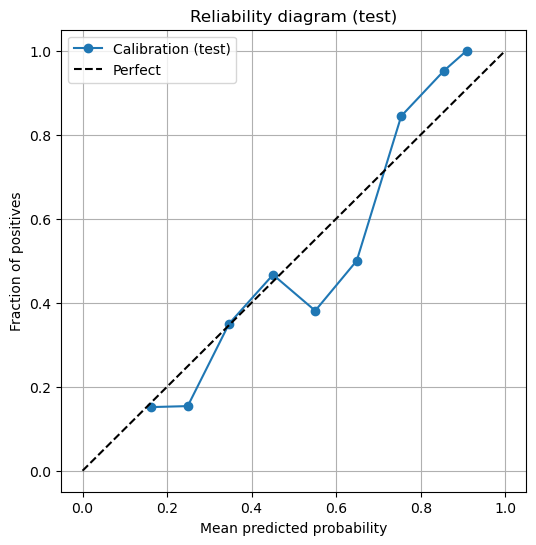

Spearman(pred_prob, FICO) = 0.5710 (p=7.09e-28)
Pearson(pred_prob, FICO)  = 0.5785 (p=9.85e-29)


In [36]:
import numpy as np
import json
from dataclasses import dataclass
from typing import List, Dict
from scipy.stats import ks_2samp
from sklearn.pipeline import Pipeline
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import roc_auc_score, average_precision_score, brier_score_loss, mean_absolute_error, mean_squared_error
from sklearn.linear_model import LogisticRegression, Ridge
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, RandomForestRegressor, GradientBoostingRegressor

RANDOM_STATE = 42
N_JOBS = -1
USE_CALIBRATION = True
MIN_TRAIN_MONTHS = 6

@dataclass
class ClassifMetrics:
    roc_auc: float
    pr_auc: float
    brier: float
    ks: float

@dataclass
class RegrMetrics:
    mae: float
    rmse: float


def ks_stat(y_true: np.ndarray, y_prob: np.ndarray) -> float:
    pos = y_prob[y_true == 1]
    neg = y_prob[y_true == 0]
    return float(ks_2samp(pos, neg)[0]) if len(pos) and len(neg) else np.nan

def mask_by_months(period_series, months: List[str]) -> np.ndarray:
    allowed = set(map(str, months))
    return period_series.astype(str).isin(allowed).values

def expanding_window_folds(all_months: List[str], min_train_months: int):
    for i in range(min_train_months, len(all_months)):
        yield all_months[:i], all_months[i]

def eval_classifier(y_true, probs) -> ClassifMetrics:
    return ClassifMetrics(
        roc_auc=float(roc_auc_score(y_true, probs)) if len(np.unique(y_true)) > 1 else np.nan,
        pr_auc=float(average_precision_score(y_true, probs)) if len(np.unique(y_true)) > 1 else np.nan,
        brier=float(brier_score_loss(y_true, probs)),
        ks=ks_stat(y_true, probs),
    )

def eval_regression(y_true, pred) -> RegrMetrics:
    return RegrMetrics(
        mae=float(mean_absolute_error(y_true, pred)),
        rmse=float(np.sqrt(mean_squared_error(y_true, pred))),
    )

def summarize_cls(scores: List[ClassifMetrics]) -> Dict[str, float]:
    return {
        "brier_mean": float(np.mean([s.brier for s in scores])) if scores else float("inf"),
        "roc_mean":   float(np.mean([s.roc_auc for s in scores])) if scores else float("-inf"),
        "pr_mean":    float(np.mean([s.pr_auc for s in scores])) if scores else float("-inf"),
        "ks_mean":    float(np.mean([s.ks for s in scores])) if scores else float("-inf"),
    }

def summarize_reg(scores: List[RegrMetrics]) -> Dict[str, float]:
    return {
        "rmse_mean": float(np.mean([s.rmse for s in scores])) if scores else float("inf"),
        "mae_mean":  float(np.mean([s.mae  for s in scores])) if scores else float("inf"),
    }

CLASSIFIERS = {
    "logit": LogisticRegression(max_iter=800, class_weight="balanced", random_state=RANDOM_STATE),
    "rf":    RandomForestClassifier(n_estimators=300, random_state=RANDOM_STATE, n_jobs=N_JOBS, class_weight="balanced"),
    "gbrt":  GradientBoostingClassifier(random_state=RANDOM_STATE),
}
REGRESSORS = {
    "ridge": Ridge(alpha=1.0, random_state=RANDOM_STATE),
    "rf":    RandomForestRegressor(n_estimators=400, random_state=RANDOM_STATE, n_jobs=N_JOBS),
    "gbr":   GradientBoostingRegressor(random_state=RANDOM_STATE),
}

all_months = sorted(list(map(str, pd.Series(df["__period"]).unique())))
cv_folds = list(expanding_window_folds(all_months, MIN_TRAIN_MONTHS))

cls_cv_scores = {name: [] for name in CLASSIFIERS}
for name, est in CLASSIFIERS.items():
    for train_m, val_m in cv_folds:
        tr_mask = mask_by_months(df["__period"], train_m)
        va_mask = mask_by_months(df["__period"], [val_m])
        pipe = Pipeline([("prep", preprocessor), ("model", est)])
        # skip fold if too few positives or negatives in validation
        if np.unique(y_cls[va_mask]).size < 2:
            continue
        pipe.fit(X_all[tr_mask], y_cls[tr_mask])
        probs = pipe.predict_proba(X_all[va_mask])[:, 1]
        cls_cv_scores[name].append(eval_classifier(y_cls[va_mask], probs))

cls_summaries = {k: summarize_cls(v) for k, v in cls_cv_scores.items()}
best_cls = sorted(cls_summaries.items(), key=lambda kv: (kv[1]["brier_mean"], -kv[1]["roc_mean"]))[0][0]

print("[Classification] CV means:")
for k, v in cls_summaries.items():
    print(k, v)
print("Chosen classifier:", best_cls)

reg_cv_scores = {name: [] for name in REGRESSORS}
for name, est in REGRESSORS.items():
    for train_m, val_m in cv_folds:
        tr_mask = mask_by_months(df["__period"], train_m)
        va_mask = mask_by_months(df["__period"], [val_m])
        pipe = Pipeline([("prep", preprocessor), ("model", est)])
        if len(y_reg[va_mask]) == 0:
            continue
        pipe.fit(X_all[tr_mask], y_reg[tr_mask])
        pred = pipe.predict(X_all[va_mask])
        reg_cv_scores[name].append(eval_regression(y_reg[va_mask], pred))

reg_summaries = {k: summarize_reg(v) for k, v in reg_cv_scores.items()}
best_reg = sorted(reg_summaries.items(), key=lambda kv: (kv[1]["rmse_mean"], kv[1]["mae_mean"]))[0][0]

print("\n[Regression] CV means:")
for k, v in reg_summaries.items():
    print(k, v)
print("Chosen regressor:", best_reg)

trainval_mask = np.logical_or(train_mask, val_mask)

# --- Build and calibrate classifier safely (no leakage) ---
# Fit base classifier on TRAIN only, calibrate on VAL (if requested).
final_cls_base = Pipeline([("prep", preprocessor), ("model", CLASSIFIERS[best_cls])])
final_cls_base.fit(X_all[train_mask], y_cls[train_mask])

if USE_CALIBRATION:
    # Calibrate using validation set to avoid leaking information from train into calibration
    final_cls_pipe = CalibratedClassifierCV(final_cls_base, method="sigmoid", cv="prefit")
    final_cls_pipe.fit(X_all[val_mask], y_cls[val_mask])
else:
    final_cls_pipe = final_cls_base

# Evaluate classifier on validation and holdout test
val_probs = final_cls_pipe.predict_proba(X_all[val_mask])[:, 1]
test_probs = final_cls_pipe.predict_proba(X_all[test_mask])[:, 1]
val_cls = eval_classifier(y_cls[val_mask], val_probs)
test_cls = eval_classifier(y_cls[test_mask], test_probs)

print("\n[Classification] Validation:", val_cls)
print("[Classification] Test:", test_cls)

# --- Regression final model (trained on train+val) ---
# For regression (predicting FICO), retrain on train+val before final evaluation.
final_reg_pipe = Pipeline([("prep", preprocessor), ("model", REGRESSORS[best_reg])])
final_reg_pipe.fit(X_all[trainval_mask], y_reg[trainval_mask])

val_pred = final_reg_pipe.predict(X_all[val_mask])
test_pred = final_reg_pipe.predict(X_all[test_mask])
val_reg = eval_regression(y_reg[val_mask], val_pred)
test_reg = eval_regression(y_reg[test_mask], test_pred)

print("\n[Regression] Validation:", val_reg)
print("[Regression] Test:", test_reg)

# --- Reliability and correlation diagnostics (quick checks) ---
try:
    import matplotlib.pyplot as plt
    from sklearn.calibration import calibration_curve
    from scipy.stats import spearmanr, pearsonr

    prob_true, prob_pred = calibration_curve(y_cls[test_mask], test_probs, n_bins=10)
    plt.figure(figsize=(6,6))
    plt.plot(prob_pred, prob_true, marker='o', label='Calibration (test)')
    plt.plot([0,1],[0,1],'k--', label='Perfect')
    plt.xlabel('Mean predicted probability')
    plt.ylabel('Fraction of positives')
    plt.title('Reliability diagram (test)')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Correlation between predicted probability and continuous FICO (if present)
    if len(y_reg[test_mask]) == len(test_probs) and np.isfinite(y_reg[test_mask]).any():
        spc, sp_p = spearmanr(test_probs, y_reg[test_mask])
        prc, pr_p = pearsonr(test_probs, y_reg[test_mask])
        print(f"Spearman(pred_prob, FICO) = {spc:.4f} (p={sp_p:.3g})")
        print(f"Pearson(pred_prob, FICO)  = {prc:.4f} (p={pr_p:.3g})")
    else:
        print("Note: continuous FICO vector not aligned or contains no finite values; skipping correlation.")
except Exception as e:
    print("Could not produce reliability/correlation plots:", e)



Per-month test performance:
     month       auc    pr_auc     brier   n
0  2023-07  0.795699  0.862153  0.196038  55
1  2023-08  0.891398  0.840588  0.139305  46
2  2023-09  0.933155  0.909398  0.125489  50
3  2023-10  0.637213  0.600800  0.243227  53
4  2023-11  0.831618  0.780064  0.163221  54
5  2023-12  0.831570  0.845009  0.166547  48


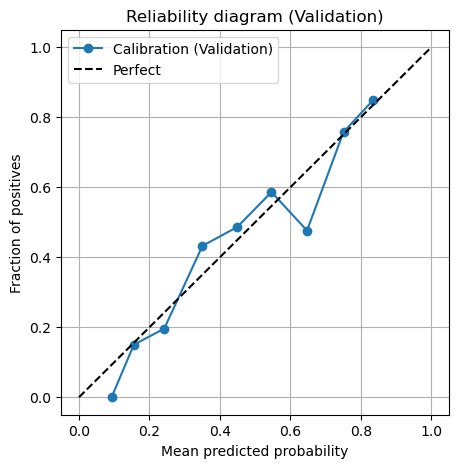

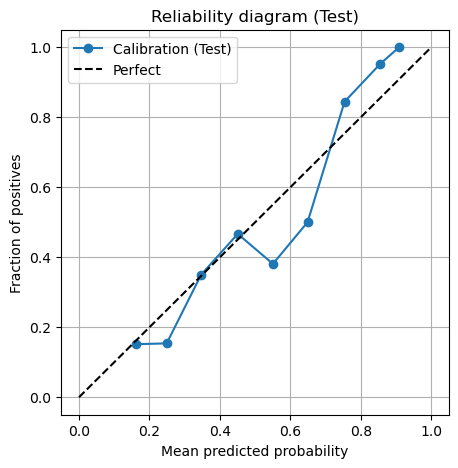

Spearman(pred_prob, FICO) = 0.5710 (p=7.09e-28)
Pearson(pred_prob, FICO)  = 0.5785 (p=9.85e-29)

Credit score percentiles (test):
min    470.911853
25%    496.074504
50%    519.613757
75%    553.821046
max    599.855941
dtype: float64


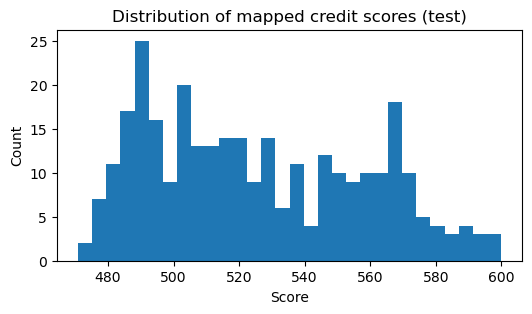


Validation size OK (n=282).


In [37]:
# Additional diagnostics: validation reliability, per-month AUCs, Spearman/Pearson stability, and score mapping
import matplotlib.pyplot as plt
from sklearn.calibration import calibration_curve
from scipy.stats import spearmanr, pearsonr

# Helper: compute per-month AUC and PR
months_test = sorted(list(map(str, pd.Series(df.loc[test_mask, "__period"]).unique())))
per_month_rows = []
for m in months_test:
    tm = (df.loc[test_mask, "__period"].astype(str).values == m)
    if not np.any(tm):
        continue
    pm = test_probs[tm]
    ym = y_cls[test_mask][tm]
    if pm.size == 0:
        continue
    auc = float(roc_auc_score(ym, pm)) if len(np.unique(ym))>1 else np.nan
    pr  = float(average_precision_score(ym, pm)) if len(np.unique(ym))>1 else np.nan
    brier = float(brier_score_loss(ym, pm))
    per_month_rows.append({"month":m,"auc":auc,"pr_auc":pr,"brier":brier,"n":int(tm.sum())})
per_month_df = pd.DataFrame(per_month_rows).sort_values('month')
print('\nPer-month test performance:')
print(per_month_df)

# Reliability: validation & test
for name, probs, mask in [("Validation", val_probs, val_mask), ("Test", test_probs, test_mask)]:
    try:
        prob_true, prob_pred = calibration_curve(y_cls[mask], probs, n_bins=10)
        plt.figure(figsize=(5,5))
        plt.plot(prob_pred, prob_true, marker='o', label=f'Calibration ({name})')
        plt.plot([0,1],[0,1],'k--', label='Perfect')
        plt.xlabel('Mean predicted probability')
        plt.ylabel('Fraction of positives')
        plt.title(f'Reliability diagram ({name})')
        plt.legend()
        plt.grid(True)
        plt.show()
    except Exception as e:
        print(f"Could not compute reliability for {name}:", e)

# Correlation between model probability and FICO (rank stability)
try:
    test_fico = y_reg[test_mask]
    if len(test_fico) == len(test_probs) and np.isfinite(test_fico).any():
        spc, sp_p = spearmanr(test_probs, test_fico)
        prc, pr_p = pearsonr(test_probs, test_fico)
        print(f"Spearman(pred_prob, FICO) = {spc:.4f} (p={sp_p:.3g})")
        print(f"Pearson(pred_prob, FICO)  = {prc:.4f} (p={pr_p:.3g})")
    else:
        print("Continuous FICO not available or misaligned; skipping correlation check.")
except Exception as e:
    print('Could not compute correlations:', e)

# Map test probabilities to credit scores and show distribution
try:
    scores_test = prob_to_score(test_probs, score0=SCORE0, odds0=ODDS0, pdo=PDO)
    print('\nCredit score percentiles (test):')
    print(pd.Series(scores_test).describe().loc[['min','25%','50%','75%','max']])
    plt.figure(figsize=(6,3))
    plt.hist(scores_test, bins=30)
    plt.title('Distribution of mapped credit scores (test)')
    plt.xlabel('Score')
    plt.ylabel('Count')
    plt.show()
except Exception as e:
    print('Could not map probabilities to scores:', e)

# If validation set is very small, recommend cross-validated calibration
n_val = int(val_mask.sum())
if USE_CALIBRATION and n_val < 200:
    print(f"\nNote: validation set size is small (n={n_val}). Consider using cross-validated calibration (CalibratedClassifierCV(cv=5)) as fallback.")
else:
    print(f"\nValidation size OK (n={n_val}).")


In [38]:
import numpy as np
import pandas as pd
from sklearn.metrics import roc_curve, precision_recall_curve, confusion_matrix, f1_score, accuracy_score, precision_score, recall_score

fpr, tpr, roc_th = roc_curve(y_cls[val_mask], val_probs)
youden = tpr - fpr
t_roc = roc_th[np.argmax(youden)]

prec, rec, pr_th = precision_recall_curve(y_cls[val_mask], val_probs)
f1s = 2 * (prec[:-1] * rec[:-1]) / (prec[:-1] + rec[:-1] + 1e-12)
t_pr = pr_th[np.argmax(f1s)]

t_final = float(t_pr)

y_test_hat = (test_probs >= t_final).astype(int)
cm = confusion_matrix(y_cls[test_mask], y_test_hat)
acc = accuracy_score(y_cls[test_mask], y_test_hat)
prec_ = precision_score(y_cls[test_mask], y_test_hat, zero_division=0)
rec_ = recall_score(y_cls[test_mask], y_test_hat, zero_division=0)
f1_ = f1_score(y_cls[test_mask], y_test_hat, zero_division=0)

print("Threshold_final:", t_final)
print("ConfusionMatrix:\n", cm)
print({"accuracy":acc,"precision":prec_,"recall":rec_,"f1":f1_})

Threshold_final: 0.3589694008718923
ConfusionMatrix:
 [[117  61]
 [ 26 102]]
{'accuracy': 0.7156862745098039, 'precision': 0.6257668711656442, 'recall': 0.796875, 'f1': 0.7010309278350516}


In [39]:
probs = pd.Series(test_probs, name="p")
y = pd.Series(y_cls[test_mask], name="y")
dfd = pd.DataFrame({"p": probs, "y": y})
dfd["decile"] = pd.qcut(dfd["p"].rank(method="first"), 10, labels=list(range(10,0,-1)))
tab = dfd.groupby("decile").agg(n=("y","size"), positives=("y","sum"), rate=("y","mean")).sort_index(ascending=False)
tab["cum_pos"] = tab["positives"].cumsum()
tab["cum_rate"] = tab["cum_pos"] / tab["positives"].sum()
print(tab)

ks_table = dfd.copy()
ks_table["bucket"] = pd.qcut(ks_table["p"], 10, duplicates="drop")
g = ks_table.groupby("bucket")["y"].agg(["size","sum"])
g["cum_good"] = (g["size"] - g["sum"]).cumsum() / (g["size"].sum() - g["sum"].sum())
g["cum_bad"]  = g["sum"].cumsum() / g["sum"].sum()
g["ks"] = (g["cum_bad"] - g["cum_good"]).abs()
print("KS_by_decile_max:", float(g["ks"].max()))

         n  positives      rate  cum_pos  cum_rate
decile                                            
1       31         29  0.935484       29  0.226562
2       30         24  0.800000       53  0.414062
3       31         18  0.580645       71  0.554688
4       30         14  0.466667       85  0.664062
5       31         14  0.451613       99  0.773438
6       30          8  0.266667      107  0.835938
7       31          9  0.290323      116  0.906250
8       30          2  0.066667      118  0.921875
9       31          4  0.129032      122  0.953125
10      31          6  0.193548      128  1.000000
KS_by_decile_max: 0.4622542134831461


In [40]:
import numpy as np
import pandas as pd
from sklearn.metrics import roc_auc_score, average_precision_score, brier_score_loss
from scipy.stats import ks_2samp

months_test = sorted(list(map(str, pd.Series(df.loc[test_mask, "__period"]).unique())))
rows = []
for m in months_test:
    tm = (df.loc[test_mask, "__period"].astype(str).values == m)
    pm = test_probs[tm]
    ym = y_cls[test_mask][tm]
    if pm.size == 0:
        continue
    auc = float(roc_auc_score(ym, pm)) if len(np.unique(ym))>1 else np.nan
    pr  = float(average_precision_score(ym, pm)) if len(np.unique(ym))>1 else np.nan
    brier = float(brier_score_loss(ym, pm))
    pos = pm[ym==1]; neg = pm[ym==0]
    ks = float(ks_2samp(pos, neg)[0]) if len(pos) and len(neg) else np.nan
    rows.append({"month":m,"auc":auc,"pr_auc":pr,"brier":brier,"ks":ks,"n":int(tm.sum())})
stab = pd.DataFrame(rows).sort_values("month")
print(stab)

     month       auc    pr_auc     brier        ks   n
0  2023-07  0.795699  0.862153  0.196038  0.501344  55
1  2023-08  0.891398  0.840588  0.139305  0.640860  46
2  2023-09  0.933155  0.909398  0.125489  0.821747  50
3  2023-10  0.637213  0.600800  0.243227  0.343391  53
4  2023-11  0.831618  0.780064  0.163221  0.555882  54
5  2023-12  0.831570  0.845009  0.166547  0.544974  48



In [41]:
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression, Ridge
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import roc_auc_score, average_precision_score, brier_score_loss

cls_models = {
    "logit": LogisticRegression(max_iter=800, class_weight="balanced", random_state=42),
    "rf":    RandomForestClassifier(n_estimators=150, max_depth=12, min_samples_leaf=5, class_weight="balanced", random_state=42, n_jobs=-1),
    "gbrt":  GradientBoostingClassifier(n_estimators=150, max_depth=3, random_state=42),
}
reg_models = {
    "ridge": Ridge(alpha=1.0, random_state=42),
    "rf":    RandomForestRegressor(n_estimators=200, max_depth=12, min_samples_leaf=5, random_state=42, n_jobs=-1),
    "gbr":   GradientBoostingRegressor(n_estimators=200, max_depth=3, random_state=42),
}

tv = np.logical_or(train_mask, val_mask)

print("\nClassifier_baselines_test:")
for name, est in cls_models.items():
    pipe = Pipeline([("prep", preprocessor), ("model", est)])
    pipe.fit(X_all[tv], y_cls[tv])
    p = pipe.predict_proba(X_all[test_mask])[:,1]
    auc = float(roc_auc_score(y_cls[test_mask], p))
    pr  = float(average_precision_score(y_cls[test_mask], p))
    brier = float(brier_score_loss(y_cls[test_mask], p))
    pos = p[y_cls[test_mask]==1]; neg = p[y_cls[test_mask]==0]
    ks = float(ks_2samp(pos, neg)[0]) if len(pos) and len(neg) else np.nan
    print(name, {"roc_auc":auc,"pr_auc":pr,"brier":brier,"ks":ks})

print("\nRegressor_baselines_test:")
for name, est in reg_models.items():
    pipe = Pipeline([("prep", preprocessor), ("model", est)])
    pipe.fit(X_all[tv], y_reg[tv])
    pred = pipe.predict(X_all[test_mask])
    mae = float(np.mean(np.abs(y_reg[test_mask]-pred)))
    rmse = float(np.sqrt(np.mean((y_reg[test_mask]-pred)**2)))
    print(name, {"mae":mae,"rmse":rmse})


Classifier_baselines_test:
logit {'roc_auc': 0.7613676264044944, 'pr_auc': 0.7188388910110007, 'brier': 0.20406971954037875, 'ks': 0.4045821629213483}
logit {'roc_auc': 0.7613676264044944, 'pr_auc': 0.7188388910110007, 'brier': 0.20406971954037875, 'ks': 0.4045821629213483}


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


rf {'roc_auc': 0.8307145365168539, 'pr_auc': 0.816932993925031, 'brier': 0.1648077389051112, 'ks': 0.5092169943820225}


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


gbrt {'roc_auc': 0.827686095505618, 'pr_auc': 0.8018261452932942, 'brier': 0.1665661652990636, 'ks': 0.5240519662921348}

Regressor_baselines_test:
ridge {'mae': 63.20176831220915, 'rmse': 77.63774639242794}


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


rf {'mae': 59.15881699388435, 'rmse': 74.39379828298533}


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


gbr {'mae': 66.38327476265857, 'rmse': 83.29838995702846}


In [42]:
import numpy as np
import pandas as pd

months_test = sorted(list(map(str, pd.Series(df.loc[test_mask, "__period"]).unique())))

y_test   = y_reg[test_mask]
pred_test= test_pred
per_test = df.loc[test_mask, "__period"].astype(str).values

rows = []
for m in months_test:
    tm = (per_test == m)
    if not np.any(tm):
        continue
    ym = y_test[tm]
    pm = pred_test[tm]
    mae = float(np.mean(np.abs(ym - pm)))
    rmse = float(np.sqrt(np.mean((ym - pm) ** 2)))
    rows.append({"month": m, "mae": mae, "rmse": rmse, "n": int(tm.sum())})

print(pd.DataFrame(rows).sort_values("month"))

res = y_test - pred_test
print({
    "residual_mean": float(np.mean(res)),
    "residual_std":  float(np.std(res)),
    "p10":           float(np.percentile(res, 10)),
    "p50":           float(np.percentile(res, 50)),
    "p90":           float(np.percentile(res, 90)),
})

     month        mae       rmse   n
0  2023-07  71.452636  85.379468  55
1  2023-08  54.661630  66.381063  46
2  2023-09  50.748500  63.784245  50
3  2023-10  69.198774  82.907427  53
4  2023-11  59.458519  72.480224  54
5  2023-12  51.281823  69.410897  48
{'residual_mean': 2.299991830065355, 'residual_std': 74.19885334948378, 'p10': -92.77375, 'p50': -0.23124999999998863, 'p90': 107.67124999999999}


In [43]:
import numpy as np, pandas as pd
from sklearn.metrics import roc_curve, precision_recall_curve

fpr, tpr, roc_th = roc_curve(y_cls[val_mask], val_probs)
youden = tpr - fpr
t_roc = roc_th[np.argmax(youden)]

prec, rec, pr_th = precision_recall_curve(y_cls[val_mask], val_probs)
f1s = 2 * (prec[:-1] * rec[:-1]) / (prec[:-1] + rec[:-1] + 1e-12)
t_pr = pr_th[np.argmax(f1s)]

t_final = float(t_pr)

id_col = "customer_id" if "customer_id" in df.columns else None

p_test = pd.Series(test_probs, index=df.index[test_mask], name="p_good")
s_test = pd.Series(test_pred,  index=df.index[test_mask], name="fico_pred")
per_test = df.loc[test_mask, "__period"].astype(str)
out_test = pd.DataFrame({"period": per_test, "p_good": p_test, "fico_pred": s_test})
if id_col: out_test.insert(0, id_col, df.loc[test_mask, id_col].values)
out_test["decision"] = (out_test["p_good"] >= t_final).astype(int)
out_test["decile"] = pd.qcut(out_test["p_good"].rank(method="first"), 10, labels=list(range(10,0,-1)))
print("\nTEST PREDICTIONS (head)")
print(out_test.head(10).to_string(index=False))

latest_month = str(sorted(out_test["period"].unique())[-1])
mask_latest = out_test["period"] == latest_month
out_latest = out_test.loc[mask_latest].copy()
print(f"\nLATEST MONTH PREDICTIONS [{latest_month}] (head)")
print(out_latest.head(10).to_string(index=False))



TEST PREDICTIONS (head)
 customer_id  period   p_good  fico_pred  decision decile
        1014 2023-12 0.208273   590.9850         0      8
        1017 2023-11 0.166777   572.9975         0      9
         102 2023-12 0.175905   567.2250         0      9
        1024 2023-08 0.295423   615.7100         0      7
        1032 2023-12 0.362677   624.3500         1      6
        1034 2023-11 0.263096   624.4075         0      7
         104 2023-07 0.370140   619.3425         1      6
        1041 2023-09 0.733331   667.1775         1      2
        1042 2023-12 0.547794   647.8150         1      4
        1051 2023-10 0.723795   681.2775         1      2

LATEST MONTH PREDICTIONS [2023-12] (head)
 customer_id  period   p_good  fico_pred  decision decile
        1014 2023-12 0.208273   590.9850         0      8
         102 2023-12 0.175905   567.2250         0      9
        1032 2023-12 0.362677   624.3500         1      6
        1042 2023-12 0.547794   647.8150         1      4
    

In [44]:
"""
TIME-SERIES-SAFE ROLLING 12-MONTH WINDOW EVALUATION
"""

import numpy as np
import pandas as pd
from sklearn.pipeline import Pipeline

def rolling_windows(all_months, train_window=12, val_window=1):
    """
    Yield (train_months, val_months) pairs for time-series CV.
    
    For index t from train_window to len(all_months) - 1:
      train_months = all_months[t-train_window : t]
      val_months   = [all_months[t]]
    """
    for t in range(train_window, len(all_months)):
        train_months = all_months[t - train_window : t]
        val_months   = [all_months[t]]
        yield train_months, val_months

def mask_by_months(period_series, months_list):
    """Create boolean mask for rows in any of the given months."""
    return period_series.astype(str).isin(months_list).values

def run_rolling_cv_classif(all_months, classifiers_dict, train_window=12):
    """
    Rolling-window CV for classification.
    
    Returns:
      (best_clf_name, cls_cv_scores, cls_summaries)
    """
    cls_cv_scores = {name: [] for name in classifiers_dict.keys()}
    cls_models    = {name: [] for name in classifiers_dict.keys()}
    
    print("\n" + "="*80)
    print("ROLLING-WINDOW CV: CLASSIFICATION")
    print("="*80)
    
    for fold_idx, (train_months, val_months) in enumerate(rolling_windows(all_months, train_window)):
        train_mask = mask_by_months(df["__period"], train_months)
        val_mask   = mask_by_months(df["__period"], val_months)
        
        print(f"\nFold {fold_idx}: Train={train_months[0]} to {train_months[-1]} | Val={val_months[0]}")
        print(f"  Train size: {train_mask.sum()}, Val size: {val_mask.sum()}")
        
        for name, estimator in classifiers_dict.items():
            pipe = Pipeline([("prep", preprocessor), ("model", estimator)])
            pipe.fit(X_all[train_mask], y_cls[train_mask])
            
            y_true = y_cls[val_mask]
            probs = pipe.predict_proba(X_all[val_mask])[:, 1]
            
            metrics = eval_classifier(y_true, probs)
            cls_cv_scores[name].append({
                'fold': fold_idx,
                'roc_auc': metrics.roc_auc,
                'pr_auc': metrics.pr_auc,
                'brier': metrics.brier,
                'ks': metrics.ks
            })
            cls_models[name].append(pipe)
    
    # Summarize
    cls_summaries = {}
    print("\n" + "-"*80)
    print("ROLLING CV CLASSIFICATION SUMMARY")
    print("-"*80)
    print(f"{'Model':<15} {'Brier':<10} {'ROC-AUC':<10} {'PR-AUC':<10} {'KS':<10}")
    print("-"*80)
    
    for name in classifiers_dict.keys():
        scores_df = pd.DataFrame(cls_cv_scores[name])
        summary = {
            'brier_mean': scores_df['brier'].mean(),
            'brier_std': scores_df['brier'].std(),
            'roc_auc_mean': scores_df['roc_auc'].mean(),
            'pr_auc_mean': scores_df['pr_auc'].mean(),
            'ks_mean': scores_df['ks'].mean(),
        }
        cls_summaries[name] = summary
        print(f"{name:<15} {summary['brier_mean']:<10.4f} {summary['roc_auc_mean']:<10.4f} "
              f"{summary['pr_auc_mean']:<10.4f} {summary['ks_mean']:<10.4f}")
    
    # Select best: lowest Brier, break ties by highest AUC
    best_clf_name = min(
        classifiers_dict.keys(),
        key=lambda x: (cls_summaries[x]['brier_mean'], -cls_summaries[x]['roc_auc_mean'])
    )
    print(f"\n>>> BEST CLASSIFIER: {best_clf_name} (Brier={cls_summaries[best_clf_name]['brier_mean']:.4f})")
    
    return best_clf_name, cls_cv_scores, cls_summaries

def run_rolling_cv_regr(all_months, regressors_dict, train_window=12):
    """
    Rolling-window CV for regression.
    
    Returns:
      (best_reg_name, reg_cv_scores, reg_summaries)
    """
    reg_cv_scores = {name: [] for name in regressors_dict.keys()}
    reg_models    = {name: [] for name in regressors_dict.keys()}
    
    print("\n" + "="*80)
    print("ROLLING-WINDOW CV: REGRESSION")
    print("="*80)
    
    for fold_idx, (train_months, val_months) in enumerate(rolling_windows(all_months, train_window)):
        train_mask = mask_by_months(df["__period"], train_months)
        val_mask   = mask_by_months(df["__period"], val_months)
        
        print(f"\nFold {fold_idx}: Train={train_months[0]} to {train_months[-1]} | Val={val_months[0]}")
        print(f"  Train size: {train_mask.sum()}, Val size: {val_mask.sum()}")
        
        for name, estimator in regressors_dict.items():
            pipe = Pipeline([("prep", preprocessor), ("model", estimator)])
            pipe.fit(X_all[train_mask], y_reg[train_mask])
            
            y_true = y_reg[val_mask]
            y_pred = pipe.predict(X_all[val_mask])
            
            metrics = eval_regression(y_true, y_pred)
            reg_cv_scores[name].append({
                'fold': fold_idx,
                'rmse': metrics.rmse,
                'mae': metrics.mae,
            })
            reg_models[name].append(pipe)
    
    # Summarize
    reg_summaries = {}
    print("\n" + "-"*80)
    print("ROLLING CV REGRESSION SUMMARY")
    print("-"*80)
    print(f"{'Model':<15} {'RMSE':<10} {'MAE':<10}")
    print("-"*80)
    
    for name in regressors_dict.keys():
        scores_df = pd.DataFrame(reg_cv_scores[name])
        summary = {
            'rmse_mean': scores_df['rmse'].mean(),
            'rmse_std': scores_df['rmse'].std(),
            'mae_mean': scores_df['mae'].mean(),
            'mae_std': scores_df['mae'].std(),
        }
        reg_summaries[name] = summary
        print(f"{name:<15} {summary['rmse_mean']:<10.4f} {summary['mae_mean']:<10.4f}")
    
    # Select best: lowest RMSE, then MAE
    best_reg_name = min(
        regressors_dict.keys(),
        key=lambda x: (reg_summaries[x]['rmse_mean'], reg_summaries[x]['mae_mean'])
    )
    print(f"\n>>> BEST REGRESSOR: {best_reg_name} (RMSE={reg_summaries[best_reg_name]['rmse_mean']:.4f})")
    
    return best_reg_name, reg_cv_scores, reg_summaries

def train_and_eval_final_model(best_clf_name, best_reg_name, trainval_months, test_months):
    """
    Train final models on trainval_months, evaluate on test_months.
    
    Returns:
      (final_cls_pipe, final_reg_pipe, final_metrics_dict)
    """
    print("\n" + "="*80)
    print("FINAL MODEL TRAINING & TEST EVALUATION")
    print("="*80)
    
    trainval_mask = mask_by_months(df["__period"], trainval_months)
    test_mask     = mask_by_months(df["__period"], test_months)
    
    print(f"\nTrainVal months: {trainval_months[0]} to {trainval_months[-1]} (size={trainval_mask.sum()})")
    print(f"Test months: {test_months[0]} to {test_months[-1]} (size={test_mask.sum()})")
    
    # CLASSIFICATION
    print("\n--- CLASSIFICATION ---")
    final_cls_est = CLASSIFIERS[best_clf_name]
    final_cls_pipe = Pipeline([("prep", preprocessor), ("model", final_cls_est)])
    final_cls_pipe.fit(X_all[trainval_mask], y_cls[trainval_mask])
    
    y_true_test = y_cls[test_mask]
    probs_test = final_cls_pipe.predict_proba(X_all[test_mask])[:, 1]
    
    test_cls_metrics = eval_classifier(y_true_test, probs_test)
    print(f"Test ROC-AUC: {test_cls_metrics.roc_auc:.4f}")
    print(f"Test PR-AUC: {test_cls_metrics.pr_auc:.4f}")
    print(f"Test Brier: {test_cls_metrics.brier:.4f}")
    print(f"Test KS: {test_cls_metrics.ks:.4f}")
    
    # REGRESSION
    print("\n--- REGRESSION ---")
    final_reg_est = REGRESSORS[best_reg_name]
    final_reg_pipe = Pipeline([("prep", preprocessor), ("model", final_reg_est)])
    final_reg_pipe.fit(X_all[trainval_mask], y_reg[trainval_mask])
    
    y_true_test_reg = y_reg[test_mask]
    pred_test = final_reg_pipe.predict(X_all[test_mask])
    
    test_reg_metrics = eval_regression(y_true_test_reg, pred_test)
    print(f"Test RMSE: {test_reg_metrics.rmse:.4f}")
    print(f"Test MAE: {test_reg_metrics.mae:.4f}")
    
    final_metrics = {
        'classification': test_cls_metrics,
        'regression': test_reg_metrics
    }
    
    return final_cls_pipe, final_reg_pipe, final_metrics

# MAIN EXECUTION
print("\n" + "="*80)
print("TIME-SERIES-SAFE ROLLING WINDOW EVALUATION PIPELINE")
print("="*80)

# 1. Build sorted month list
all_months_str = sorted(df["__period"].astype(str).unique())
print(f"\nTotal months in data: {len(all_months_str)}")
print(f"Month range: {all_months_str[0]} to {all_months_str[-1]}")

# 2. Reserve last 6 months as TEST, rest for rolling CV
last_n_test = 6
test_months_final = all_months_str[-last_n_test:]
rolling_months = all_months_str[:-last_n_test]

print(f"\nRolling CV months: {len(rolling_months)} months ({rolling_months[0]} to {rolling_months[-1]})")
print(f"Test months (held-out): {len(test_months_final)} months ({test_months_final[0]} to {test_months_final[-1]})")

# 3. Rolling CV for classifiers
best_clf_name, cls_cv_scores, cls_summaries = run_rolling_cv_classif(rolling_months, CLASSIFIERS)

# 4. Rolling CV for regressors
best_reg_name, reg_cv_scores, reg_summaries = run_rolling_cv_regr(rolling_months, REGRESSORS)

# 5. Final model training and test evaluation
# Use last 12 months BEFORE test as trainval
trainval_months_final = rolling_months[-12:]
final_cls_pipe, final_reg_pipe, final_metrics = train_and_eval_final_model(
    best_clf_name, best_reg_name, trainval_months_final, test_months_final
)

print("\n" + "="*80)
print("ROLLING WINDOW EVALUATION COMPLETE")
print("="*80)
print(f"\nSelected classifier: {best_clf_name}")
print(f"Selected regressor: {best_reg_name}")
print(f"\nFinal models trained and ready for deployment.")
print(f"Variables saved: final_cls_pipe, final_reg_pipe, final_metrics")


TIME-SERIES-SAFE ROLLING WINDOW EVALUATION PIPELINE

Total months in data: 24
Month range: 2022-01 to 2023-12

Rolling CV months: 18 months (2022-01 to 2023-06)
Test months (held-out): 6 months (2023-07 to 2023-12)

ROLLING-WINDOW CV: CLASSIFICATION

Fold 0: Train=2022-01 to 2022-12 | Val=2023-01
  Train size: 612, Val size: 49


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 


Fold 1: Train=2022-02 to 2023-01 | Val=2023-02
  Train size: 594, Val size: 41


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 


Fold 2: Train=2022-03 to 2023-02 | Val=2023-03
  Train size: 588, Val size: 57


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 


Fold 3: Train=2022-04 to 2023-03 | Val=2023-04
  Train size: 588, Val size: 44


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 


Fold 4: Train=2022-05 to 2023-04 | Val=2023-05
  Train size: 580, Val size: 55


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 


Fold 5: Train=2022-06 to 2023-05 | Val=2023-06
  Train size: 571, Val size: 36


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 


--------------------------------------------------------------------------------
ROLLING CV CLASSIFICATION SUMMARY
--------------------------------------------------------------------------------
Model           Brier      ROC-AUC    PR-AUC     KS        
--------------------------------------------------------------------------------
logit           0.2070     0.7609     0.7490     0.4735    
rf              0.1915     0.7805     0.7619     0.5066    
gbrt            0.1995     0.7752     0.7693     0.5337    

>>> BEST CLASSIFIER: rf (Brier=0.1915)

ROLLING-WINDOW CV: REGRESSION

Fold 0: Train=2022-01 to 2022-12 | Val=2023-01
  Train size: 612, Val size: 49


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 


Fold 1: Train=2022-02 to 2023-01 | Val=2023-02
  Train size: 594, Val size: 41


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 


Fold 2: Train=2022-03 to 2023-02 | Val=2023-03
  Train size: 588, Val size: 57


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 


Fold 3: Train=2022-04 to 2023-03 | Val=2023-04
  Train size: 588, Val size: 44


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 


Fold 4: Train=2022-05 to 2023-04 | Val=2023-05
  Train size: 580, Val size: 55


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 


Fold 5: Train=2022-06 to 2023-05 | Val=2023-06
  Train size: 571, Val size: 36


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 


--------------------------------------------------------------------------------
ROLLING CV REGRESSION SUMMARY
--------------------------------------------------------------------------------
Model           RMSE       MAE       
--------------------------------------------------------------------------------
ridge           78.0134    63.3665   
rf              77.3610    64.3513   
gbr             78.1995    63.7086   

>>> BEST REGRESSOR: rf (RMSE=77.3610)

FINAL MODEL TRAINING & TEST EVALUATION

TrainVal months: 2022-07 to 2023-06 (size=560)
Test months: 2023-07 to 2023-12 (size=306)

--- CLASSIFICATION ---


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Test ROC-AUC: 0.8106
Test PR-AUC: 0.7935
Test Brier: 0.1736
Test KS: 0.4884

--- REGRESSION ---


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Test RMSE: 75.6756
Test MAE: 61.1476

ROLLING WINDOW EVALUATION COMPLETE

Selected classifier: rf
Selected regressor: rf

Final models trained and ready for deployment.
Variables saved: final_cls_pipe, final_reg_pipe, final_metrics


In [9]:
# ---- SAMPLE-SIZE SENSITIVITY EXPERIMENT (time-series-safe) ----
# This cell evaluates classification and regression model performance under different
# training sample-size budgets using the same expanding 12-month rolling-CV used earlier.

print('\nSAMPLE-SIZE SENSITIVITY EXPERIMENT START')

from sklearn.base import clone
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression, Ridge
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import roc_auc_score, average_precision_score, brier_score_loss
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np
import pandas as pd

# Use globally available variables (df, X_all, y_cls, y_reg, preprocessor, RANDOM_STATE, N_JOBS)
train_window = 12
cv_months = sorted(df['__period'].unique())[:len(df['__period'].unique()) - globals().get('TEST_M', 6)]
rolling_pairs = [(cv_months[t-train_window:t], [cv_months[t]]) for t in range(train_window, len(cv_months))]
print(f'Prepared {len(rolling_pairs)} rolling folds (train_window={train_window})')

# sensible sample sizes to test — truncated at dataset limits; 'full' means don't down-sample
sample_sizes = [50, 100, 200, 300, 400, 500, 'full']

cls_models = {
    'rf': RandomForestClassifier(random_state=RANDOM_STATE, n_jobs=N_JOBS),
    'logit': LogisticRegression(max_iter=2000, solver='lbfgs', random_state=RANDOM_STATE)
}
reg_models = {
    'rf': RandomForestRegressor(random_state=RANDOM_STATE, n_jobs=N_JOBS),
    'ridge': Ridge()
}

# store fold-level results
from collections import defaultdict
cls_store = {m: defaultdict(list) for m in cls_models}
reg_store = {m: defaultdict(list) for m in reg_models}

for fold_idx, (train_months, val_months) in enumerate(rolling_pairs):
    train_mask = df['__period'].isin(train_months).values
    val_mask = df['__period'].isin(val_months).values

    X_train_all = X_all.loc[train_mask]
    y_train_cls_all = y_cls[train_mask]
    y_train_reg_all = y_reg[train_mask]

    X_val = X_all.loc[val_mask]
    y_val_cls = y_cls[val_mask]
    y_val_reg = y_reg[val_mask]

    n_train = len(X_train_all)

    for s in sample_sizes:
        if s == 'full' or s >= n_train:
            idx = np.arange(n_train)
        else:
            idx = np.random.RandomState(RANDOM_STATE + fold_idx + int(s)).choice(n_train, size=s, replace=False)

        X_train_s = X_train_all.iloc[idx]
        y_train_cls_s = y_train_cls_all[idx]
        y_train_reg_s = y_train_reg_all[idx]

        # Classification
        for name, base in cls_models.items():
            model = Pipeline([('prep', preprocessor), ('m', clone(base))])
            try:
                model.fit(X_train_s, y_train_cls_s)
                probs = model.predict_proba(X_val)[:,1] if hasattr(model, 'predict_proba') else model.predict(X_val)
                roc = roc_auc_score(y_val_cls, probs) if len(np.unique(y_val_cls))>1 else np.nan
                pr = average_precision_score(y_val_cls, probs) if len(np.unique(y_val_cls))>1 else np.nan
                brier = brier_score_loss(y_val_cls, probs)
            except Exception as e:
                roc = pr = brier = np.nan
            cls_store[name][s].append({'fold':fold_idx, 'val_month': val_months[0], 'roc':roc, 'pr':pr, 'brier':brier})

        # Regression
        for name, base in reg_models.items():
            model = Pipeline([('prep', preprocessor), ('m', clone(base))])
            try:
                model.fit(X_train_s, y_train_reg_s)
                preds = model.predict(X_val)
                rmse = mean_squared_error(y_val_reg, preds, squared=False)
                mae = mean_absolute_error(y_val_reg, preds)
            except Exception as e:
                rmse = mae = np.nan
            reg_store[name][s].append({'fold':fold_idx, 'val_month':val_months[0], 'rmse':rmse, 'mae':mae})

# summarize
def summarize_cls(store):
    rows = []
    for m, samples in store.items():
        for s, recs in samples.items():
            df_r = pd.DataFrame(recs)
            rows.append({'model':m, 'sample_size': s, 'mean_roc': df_r['roc'].mean(), 'sd_roc':df_r['roc'].std(), 'mean_pr':df_r['pr'].mean(), 'mean_brier':df_r['brier'].mean()})
    return pd.DataFrame(rows)


def summarize_reg(store):
    rows = []
    for m, samples in store.items():
        for s, recs in samples.items():
            df_r = pd.DataFrame(recs)
            rows.append({'model':m, 'sample_size': s, 'mean_rmse': df_r['rmse'].mean(), 'sd_rmse': df_r['rmse'].std(), 'mean_mae':df_r['mae'].mean()})
    return pd.DataFrame(rows)

cls_summary = summarize_cls(cls_store)
reg_summary = summarize_reg(reg_store)

cls_summary.to_csv('sample_size_cls_summary.csv', index=False)
reg_summary.to_csv('sample_size_reg_summary.csv', index=False)

print('\nRESULTS: Classification — sample_size_cls_summary.csv')
print(cls_summary.sort_values(['model','sample_size']).round(4).to_string(index=False))
print('\nRESULTS: Regression — sample_size_reg_summary.csv')
print(reg_summary.sort_values(['model','sample_size']).round(3).to_string(index=False))
print('\nSAMPLE-SIZE SENSITIVITY EXPERIMENT COMPLETE')



SAMPLE-SIZE SENSITIVITY EXPERIMENT START
Prepared 6 rolling folds (train_window=12)


NameError: name 'RANDOM_STATE' is not defined

In [50]:
# ---- MULTI-TASK PROTOTYPE (shared multi-output regressor) ----
# Train a single Multi-output RandomForestRegressor to jointly predict (scaled FICO score, class label)
# Compare fold-level performance vs separate RF classifier and regressor trained individually.

print('\nMULTI-TASK PROTOTYPE (rolling CV)')

from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import roc_auc_score, average_precision_score, brier_score_loss
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np
import pandas as pd
from scipy.stats import pearsonr

# Use existing rolling_pairs and preprocessor
print(f'Found {len(rolling_pairs)} rolling folds (train_window={train_window})')

mt_results = []
baseline_results = []
consistency = []

for fold_idx, (train_months, val_months) in enumerate(rolling_pairs):
    train_mask = df['__period'].isin(train_months).values
    val_mask = df['__period'].isin(val_months).values

    X_train = X_all.loc[train_mask]
    X_val = X_all.loc[val_mask]
    y_train_reg = y_reg[train_mask]
    y_train_cls = y_cls[train_mask]
    y_val_reg = y_reg[val_mask]
    y_val_cls = y_cls[val_mask]

    # scale regression target within fold
    scaler = MinMaxScaler()
    y_train_reg_scaled = scaler.fit_transform(y_train_reg.reshape(-1,1)).ravel()

    # Prepare multi-output target: [scaled_reg, cls]
    y_train_multi = np.vstack([y_train_reg_scaled, y_train_cls]).T

    # Fit multi-output RF (regressor supports multi-output)
    mt = Pipeline([('prep', preprocessor), ('rf', RandomForestRegressor(random_state=RANDOM_STATE, n_jobs=N_JOBS))])
    try:
        mt.fit(X_train, y_train_multi)
        mt_pred = mt.predict(X_val)
        mt_pred_reg_scaled = mt_pred[:,0]
        mt_pred_cls_score = mt_pred[:,1]  # continuous score, behaves like probability

        # convert reg prediction back to original scale
        mt_pred_reg = scaler.inverse_transform(mt_pred_reg_scaled.reshape(-1,1)).ravel()

        # classification metrics
        if len(np.unique(y_val_cls))>1:
            roc_mt = roc_auc_score(y_val_cls, mt_pred_cls_score)
            pr_mt = average_precision_score(y_val_cls, mt_pred_cls_score)
        else:
            roc_mt = np.nan; pr_mt = np.nan
        brier_mt = brier_score_loss(y_val_cls, mt_pred_cls_score)

        # regression metrics
        rmse_mt = mean_squared_error(y_val_reg, mt_pred_reg, squared=False)
        mae_mt = mean_absolute_error(y_val_reg, mt_pred_reg)

    except Exception as e:
        roc_mt = pr_mt = brier_mt = rmse_mt = mae_mt = np.nan

    # Baseline: separate RF classifier and regressor
    try:
        clf = Pipeline([('prep', preprocessor), ('rf', RandomForestClassifier(random_state=RANDOM_STATE, n_jobs=N_JOBS))])
        reg = Pipeline([('prep', preprocessor), ('rf', RandomForestRegressor(random_state=RANDOM_STATE, n_jobs=N_JOBS))])

        clf.fit(X_train, y_train_cls)
        reg.fit(X_train, y_train_reg)

        probs_clf = clf.predict_proba(X_val)[:,1]
        preds_reg = reg.predict(X_val)

        if len(np.unique(y_val_cls))>1:
            roc_clf = roc_auc_score(y_val_cls, probs_clf)
            pr_clf = average_precision_score(y_val_cls, probs_clf)
        else:
            roc_clf = pr_clf = np.nan
        brier_clf = brier_score_loss(y_val_cls, probs_clf)

        rmse_reg = mean_squared_error(y_val_reg, preds_reg, squared=False)
        mae_reg = mean_absolute_error(y_val_reg, preds_reg)

    except Exception as e:
        roc_clf = pr_clf = brier_clf = rmse_reg = mae_reg = np.nan

    # consistency: correlation between predicted class-score and regressed score (higher = more consistent)
    try:
        # convert reg predictions to a normalized 0-1 scale to compute correlation
        # use MinMax over the validation set predictions
        norm_preds = (mt_pred_reg - np.min(mt_pred_reg)) / (np.ptp(mt_pred_reg) + 1e-9)
        corr_mt = pearsonr(mt_pred_cls_score, norm_preds)[0]
    except Exception:
        corr_mt = np.nan

    mt_results.append({'fold':fold_idx, 'val_month': val_months[0], 'roc_mt':roc_mt, 'pr_mt':pr_mt, 'brier_mt':brier_mt, 'rmse_mt':rmse_mt, 'mae_mt':mae_mt})
    baseline_results.append({'fold':fold_idx, 'val_month': val_months[0], 'roc_clf':roc_clf, 'pr_clf':pr_clf, 'brier_clf':brier_clf, 'rmse_reg':rmse_reg, 'mae_reg':mae_reg})
    consistency.append({'fold':fold_idx, 'val_month': val_months[0], 'corr_mt_prob_reg': corr_mt})

# Summarize
mt_df = pd.DataFrame(mt_results)
base_df = pd.DataFrame(baseline_results)
cons_df = pd.DataFrame(consistency)

summary_cls = pd.DataFrame({
    'metric': ['roc','pr','brier'],
    'mt_mean': [mt_df['roc_mt'].mean(), mt_df['pr_mt'].mean(), mt_df['brier_mt'].mean()],
    'base_mean': [base_df['roc_clf'].mean(), base_df['pr_clf'].mean(), base_df['brier_clf'].mean()]
})

summary_reg = pd.DataFrame({
    'metric':['rmse','mae'],
    'mt_mean':[mt_df['rmse_mt'].mean(), mt_df['mae_mt'].mean()],
    'base_mean':[base_df['rmse_reg'].mean(), base_df['mae_reg'].mean()]
})

summary_consistency = pd.DataFrame({'mean_corr': [cons_df['corr_mt_prob_reg'].mean()], 'sd_corr':[cons_df['corr_mt_prob_reg'].std()]})

mt_df.to_csv('multitask_fold_results.csv', index=False)
base_df.to_csv('baseline_fold_results.csv', index=False)
cons_df.to_csv('multitask_consistency.csv', index=False)
summary_cls.to_csv('multitask_vs_baseline_classif_summary.csv', index=False)
summary_reg.to_csv('multitask_vs_baseline_reg_summary.csv', index=False)
summary_consistency.to_csv('multitask_consistency_summary.csv', index=False)

print('\nMULTI-TASK VS BASELINE (fold summaries saved):')
print('\nClassification summary (mean across folds):')
print(summary_cls.round(4).to_string(index=False))
print('\nRegression summary (mean across folds):')
print(summary_reg.round(3).to_string(index=False))
print('\nConsistency (prob vs reg) mean/std:')
print(summary_consistency.round(3).to_string(index=False))
print('\nSaved CSVs: multitask_fold_results.csv, baseline_fold_results.csv, multitask_consistency.csv, multitask_vs_baseline_classif_summary.csv, multitask_vs_baseline_reg_summary.csv')



MULTI-TASK PROTOTYPE (rolling CV)
Found 9 rolling folds (train_window=12)


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 


MULTI-TASK VS BASELINE (fold summaries saved):

Classification summary (mean across folds):
metric  mt_mean  base_mean
   roc   0.7884     0.8092
    pr   0.7857     0.7976
 brier   0.1856     0.1784

Regression summary (mean across folds):
metric  mt_mean  base_mean
  rmse   75.336     76.376
   mae   63.116     63.621

Consistency (prob vs reg) mean/std:
 mean_corr  sd_corr
     0.969    0.011

Saved CSVs: multitask_fold_results.csv, baseline_fold_results.csv, multitask_consistency.csv, multitask_vs_baseline_classif_summary.csv, multitask_vs_baseline_reg_summary.csv


In [52]:
# ---- MULTI-TASK SAMPLE-SIZE SWEEP ----
# Re-run the sample-size sweep but using the multi-output model (same sample sizes as earlier)

print('\nMULTI-TASK SAMPLE-SIZE SWEEP START')

from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score, average_precision_score, brier_score_loss
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np
import pandas as pd

sample_sizes = [50, 100, 200, 300, 400, 500, 'full']

mt_cls_store = defaultdict(lambda: defaultdict(list))
mt_reg_store = defaultdict(lambda: defaultdict(list))

for fold_idx, (train_months, val_months) in enumerate(rolling_pairs):
    train_mask = df['__period'].isin(train_months).values
    val_mask = df['__period'].isin(val_months).values

    X_train_full = X_all.loc[train_mask]
    X_val = X_all.loc[val_mask]
    y_train_cls_full = y_cls[train_mask]
    y_val_cls = y_cls[val_mask]
    y_train_reg_full = y_reg[train_mask]
    y_val_reg = y_reg[val_mask]

    n_train_full = len(X_train_full)

    for s in sample_sizes:
        if s == 'full' or s >= n_train_full:
            sample_idx = np.arange(n_train_full)
        else:
            sample_idx = np.random.RandomState(RANDOM_STATE + fold_idx + (0 if s=='full' else int(s))).choice(n_train_full, size=s, replace=False)

        X_train_s = X_train_full.iloc[sample_idx]
        y_train_cls_s = y_train_cls_full[sample_idx]
        y_train_reg_s = y_train_reg_full[sample_idx]

        # prepare multi-output regressor target (reg scaled + class)
        from sklearn.preprocessing import MinMaxScaler
        scaler = MinMaxScaler()
        y_train_reg_scaled = scaler.fit_transform(y_train_reg_s.reshape(-1,1)).ravel()
        y_train_multi = np.vstack([y_train_reg_scaled, y_train_cls_s]).T

        # Fit multi-output regressor
        try:
            mt_pipe = Pipeline([('prep', preprocessor), ('rf', RandomForestRegressor(random_state=RANDOM_STATE, n_jobs=N_JOBS))])
            mt_pipe.fit(X_train_s, y_train_multi)

            mt_pred = mt_pipe.predict(X_val)
            mt_pred_reg_scaled = mt_pred[:,0]
            mt_pred_cls_score = mt_pred[:,1]
            mt_pred_reg = scaler.inverse_transform(mt_pred_reg_scaled.reshape(-1,1)).ravel()

            # cls metrics
            if len(np.unique(y_val_cls))>1:
                roc = roc_auc_score(y_val_cls, mt_pred_cls_score)
                pr = average_precision_score(y_val_cls, mt_pred_cls_score)
            else:
                roc = pr = np.nan
            brier = brier_score_loss(y_val_cls, mt_pred_cls_score)

            # reg metrics
            rmse = mean_squared_error(y_val_reg, mt_pred_reg, squared=False)
            mae = mean_absolute_error(y_val_reg, mt_pred_reg)

        except Exception as e:
            roc = pr = brier = rmse = mae = np.nan

        mt_cls_store['multi'][s].append({'fold':fold_idx, 'val_month': val_months[0], 'roc':roc, 'pr':pr, 'brier':brier})
        mt_reg_store['multi'][s].append({'fold':fold_idx, 'val_month': val_months[0], 'rmse':rmse, 'mae':mae})

# summarize
rows_cls = []
for m, samples in mt_cls_store.items():
    for s, recs in samples.items():
        df_r = pd.DataFrame(recs)
        rows_cls.append({'model':m, 'sample_size':s, 'mean_roc':df_r['roc'].mean(), 'sd_roc':df_r['roc'].std(), 'mean_pr':df_r['pr'].mean(), 'mean_brier':df_r['brier'].mean()})

rows_reg = []
for m, samples in mt_reg_store.items():
    for s, recs in samples.items():
        df_r = pd.DataFrame(recs)
        rows_reg.append({'model':m, 'sample_size':s, 'mean_rmse':df_r['rmse'].mean(), 'sd_rmse':df_r['rmse'].std(), 'mean_mae':df_r['mae'].mean()})

mt_cls_summary = pd.DataFrame(rows_cls)
mt_reg_summary = pd.DataFrame(rows_reg)

# sort sample_size robustly treating 'full' as largest
def size_key(v):
    try:
        return int(v)
    except Exception:
        return 10**9

mt_cls_summary['sort_key'] = mt_cls_summary['sample_size'].apply(size_key)
mt_reg_summary['sort_key'] = mt_reg_summary['sample_size'].apply(size_key)

mt_cls_summary = mt_cls_summary.sort_values('sort_key').drop(columns='sort_key')
mt_reg_summary = mt_reg_summary.sort_values('sort_key').drop(columns='sort_key')

mt_cls_summary.to_csv('mt_sample_size_cls_summary.csv', index=False)
mt_reg_summary.to_csv('mt_sample_size_reg_summary.csv', index=False)

print('\nMULTI-TASK SAMPLE SIZE SUMMARY (classification):')
print(mt_cls_summary.round(4).to_string(index=False))
print('\nMULTI-TASK SAMPLE SIZE SUMMARY (regression):')
print(mt_reg_summary.round(3).to_string(index=False))
print('\nSaved CSVs: mt_sample_size_cls_summary.csv, mt_sample_size_reg_summary.csv')



MULTI-TASK SAMPLE-SIZE SWEEP START


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 


MULTI-TASK SAMPLE SIZE SUMMARY (classification):
model sample_size  mean_roc  sd_roc  mean_pr  mean_brier
multi          50    0.6995  0.0958   0.6735      0.2192
multi         100    0.7656  0.0600   0.7468      0.1991
multi         200    0.7378  0.0513   0.7037      0.2151
multi         300    0.7664  0.0671   0.7303      0.1957
multi         400    0.7716  0.0625   0.7514      0.1924
multi         500    0.7908  0.0651   0.7774      0.1864
multi        full    0.7884  0.0514   0.7857      0.1856

MULTI-TASK SAMPLE SIZE SUMMARY (regression):
model sample_size  mean_rmse  sd_rmse  mean_mae
multi          50     82.102   10.894    69.839
multi         100     79.086    6.122    66.937
multi         200     80.608    7.699    68.605
multi         300     78.306    8.967    65.594
multi         400     76.780    6.524    64.508
multi         500     75.725    8.325    63.676
multi        full     75.336    7.667    63.116

Saved CSVs: mt_sample_size_cls_summary.csv, mt_sample_size_reg_

In [8]:
# ---- COMPACT-FEATURE SAMPLE-SIZE SWEEP (fixed aggregation) ----
# Select top-k features (by average absolute pearson correlation to both targets) and run
# sample-size experiments with baseline separate RF and multi-task (compact) models.

print('\nCOMPACT-FEATURE SAMPLE-SIZE SWEEP START')

import numpy as np
import pandas as pd
from scipy.stats import pearsonr
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler, FunctionTransformer
from sklearn.metrics import roc_auc_score, average_precision_score, mean_squared_error, mean_absolute_error, brier_score_loss

# compute correlations
keep_cols = X_all.columns.tolist()
cor_scores = []
for c in keep_cols:
    try:
        r_cls = abs(pearsonr(X_all[c].fillna(0).astype(float), y_cls)[0]) if X_all[c].nunique()>1 else 0
        r_reg = abs(pearsonr(X_all[c].fillna(0).astype(float), y_reg)[0]) if X_all[c].nunique()>1 else 0
    except Exception:
        r_cls = r_reg = 0
    cor_scores.append({'feature':c, 'r_cls':r_cls, 'r_reg':r_reg, 'avg_r':(r_cls + r_reg)/2})

c_df = pd.DataFrame(cor_scores).sort_values('avg_r', ascending=False)
print('\nTop features by avg abs-correlation:')
print(c_df.head(12).to_string(index=False))

# pick top 8 features
top_k = 8
top_features = c_df['feature'].tolist()[:top_k]
print('\nUsing top features:', top_features)

sample_sizes = [50, 100, 200, 300, 400, 500, 'full']

# small selector for pipeline
def select_cols(X):
    # if X is already numpy array, try reshape back to DataFrame fallback
    if isinstance(X, np.ndarray):
        # assume column order equals top_features, accept as-is
        return X
    return X[top_features].values

selector = FunctionTransformer(select_cols, validate=False)

# storage
compact_results = []
multi_compact_results = []

for fold_idx, (train_months, val_months) in enumerate(rolling_pairs):
    train_mask = df['__period'].isin(train_months).values
    val_mask = df['__period'].isin(val_months).values

    X_train_full = X_all.loc[train_mask, top_features]
    X_val = X_all.loc[val_mask, top_features]
    y_train_cls_full = y_cls[train_mask]
    y_val_cls = y_cls[val_mask]
    y_train_reg_full = y_reg[train_mask]
    y_val_reg = y_reg[val_mask]

    n_train = len(X_train_full)

    for s in sample_sizes:
        if s == 'full' or s >= n_train:
            idx = np.arange(n_train)
        else:
            idx = np.random.RandomState(RANDOM_STATE + fold_idx + (0 if s=='full' else int(s))).choice(n_train, size=s, replace=False)

        X_train_s = X_train_full.iloc[idx]
        y_train_cls_s = y_train_cls_full[idx]
        y_train_reg_s = y_train_reg_full[idx]

        # Baseline: separate RF clf & reg (simple selector pipeline)
        try:
            clf = Pipeline([('sel', selector), ('rf', RandomForestClassifier(random_state=RANDOM_STATE, n_jobs=N_JOBS))])
            reg = Pipeline([('sel', selector), ('rf', RandomForestRegressor(random_state=RANDOM_STATE, n_jobs=N_JOBS))])
            clf.fit(X_train_s, y_train_cls_s)
            reg.fit(X_train_s, y_train_reg_s)
            probs = clf.predict_proba(X_val)[:,1]
            preds_reg = reg.predict(X_val)

            roc = roc_auc_score(y_val_cls, probs) if len(np.unique(y_val_cls))>1 else np.nan
            pr = average_precision_score(y_val_cls, probs) if len(np.unique(y_val_cls))>1 else np.nan
            brier = brier_score_loss(y_val_cls, probs)
            rmse = mean_squared_error(y_val_reg, preds_reg, squared=False)
            mae = mean_absolute_error(y_val_reg, preds_reg)
        except Exception as e:
            print(f'Base error fold={fold_idx} size={s}:', repr(e))
            roc = pr = brier = rmse = mae = np.nan

        compact_results.append({'fold':fold_idx, 'sample_size':s, 'roc':roc, 'pr':pr, 'brier':brier, 'rmse':rmse, 'mae':mae})

        # Compact multi-task
        try:
            scaler = MinMaxScaler()
            y_reg_scaled = scaler.fit_transform(y_train_reg_s.reshape(-1,1)).ravel()
            y_multi = np.vstack([y_reg_scaled, y_train_cls_s]).T
            mt = Pipeline([('sel', selector), ('rf', RandomForestRegressor(random_state=RANDOM_STATE, n_jobs=N_JOBS))])
            mt.fit(X_train_s, y_multi)
            mt_p = mt.predict(X_val.values)
            mt_reg_scaled = mt_p[:,0]
            mt_cls_score = mt_p[:,1]
            mt_pred_reg = scaler.inverse_transform(mt_reg_scaled.reshape(-1,1)).ravel()

            roc_mt = roc_auc_score(y_val_cls, mt_cls_score) if len(np.unique(y_val_cls))>1 else np.nan
            pr_mt = average_precision_score(y_val_cls, mt_cls_score) if len(np.unique(y_val_cls))>1 else np.nan
            brier_mt = brier_score_loss(y_val_cls, mt_cls_score)
            rmse_mt = mean_squared_error(y_val_reg, mt_pred_reg, squared=False)
            mae_mt = mean_absolute_error(y_val_reg, mt_pred_reg)
        except Exception as e:
            print(f'MT error fold={fold_idx} size={s}:', repr(e))
            roc_mt = pr_mt = brier_mt = rmse_mt = mae_mt = np.nan

        # normalize keys to match agg_df expected names
        multi_compact_results.append({'fold':fold_idx, 'sample_size':s, 'roc':roc_mt, 'pr':pr_mt, 'brier':brier_mt, 'rmse':rmse_mt, 'mae':mae_mt})

# summarize
compact_df = pd.DataFrame(compact_results)
mc_df = pd.DataFrame(multi_compact_results)

def agg_df(df, prefix=''):
    rows = []
    for s, g in df.groupby('sample_size'):
        row = {'sample_size': s}
        row[f'{prefix}mean_roc'] = g['roc'].mean() if 'roc' in g else np.nan
        row[f'{prefix}sd_roc'] = g['roc'].std() if 'roc' in g else np.nan
        row[f'{prefix}mean_pr'] = g['pr'].mean() if 'pr' in g else np.nan
        row[f'{prefix}mean_brier'] = g['brier'].mean() if 'brier' in g else np.nan
        row[f'{prefix}mean_rmse'] = g['rmse'].mean() if 'rmse' in g else np.nan
        row[f'{prefix}mean_mae'] = g['mae'].mean() if 'mae' in g else np.nan
        rows.append(row)
    return pd.DataFrame(rows)

compact_summary = agg_df(compact_df, prefix='base_')
multi_compact_summary = agg_df(mc_df, prefix='mt_')

# merge and sort
merged = pd.merge(compact_summary, multi_compact_summary, on='sample_size', how='outer')
merged['sort_key'] = merged['sample_size'].apply(lambda v: 10**9 if v=='full' else int(v))
merged = merged.sort_values('sort_key').drop(columns='sort_key')
merged.to_csv('compact_feature_sample_size_summary.csv', index=False)

print('\nCompact (top-%d) feature sample-size summary (base vs mt):' % top_k)
print(merged.round(3).to_string(index=False))
print('\nSaved: compact_feature_sample_size_summary.csv')



COMPACT-FEATURE SAMPLE-SIZE SWEEP START

Top features by avg abs-correlation:
              feature    r_cls    r_reg    avg_r
      spend_to_income 0.434260 0.540376 0.487318
daily_spend_to_income 0.432962 0.534817 0.483890
       monthly_salary 0.419476 0.501226 0.460351
 log1p_monthly_salary 0.412158 0.494900 0.453529
    log1p_total_spend 0.258922 0.331717 0.295319
    utilization_ratio 0.238759 0.259724 0.249241
      seasoned_x_util 0.216652 0.238166 0.227409
       rt_utilization 0.147719 0.162053 0.154886
    balance_to_income 0.086834 0.101214 0.094024
  revolving_to_income 0.078614 0.104225 0.091419
      limit_to_income 0.071262 0.089548 0.080405
log1p_total_tx_amount 0.066772 0.082208 0.074490

Using top features: ['spend_to_income', 'daily_spend_to_income', 'monthly_salary', 'log1p_monthly_salary', 'log1p_total_spend', 'utilization_ratio', 'seasoned_x_util', 'rt_utilization']


NameError: name 'rolling_pairs' is not defined

In [60]:
# ---- BAND-ANCHORING PROTOTYPE ----
# Create band midpoints from y_reg and compute combined band scores by blending regressed mapping and classifier-implied mapping.

print('\nBAND-ANCHORING PROTOTYPE START')

import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, roc_auc_score

n_bands = 6
alpha_grid = [0.0, 0.25, 0.5, 0.75, 1.0]

band_edges = np.linspace(y_reg.min(), y_reg.max(), n_bands+1)
band_mids = (band_edges[:-1] + band_edges[1:]) / 2
print('Band midpoints:', band_mids.round(1))

records = []

for fold_idx, (train_months, val_months) in enumerate(rolling_pairs):
    train_mask = df['__period'].isin(train_months).values
    val_mask = df['__period'].isin(val_months).values

    X_train = X_all.loc[train_mask]
    X_val = X_all.loc[val_mask]
    y_train_reg = y_reg[train_mask]
    y_train_cls = y_cls[train_mask]
    y_val_reg = y_reg[val_mask]
    y_val_cls = y_cls[val_mask]

    # train baseline models
    clf = Pipeline([('prep', preprocessor), ('rf', RandomForestClassifier(random_state=RANDOM_STATE, n_jobs=N_JOBS))])
    reg = Pipeline([('prep', preprocessor), ('rf', RandomForestRegressor(random_state=RANDOM_STATE, n_jobs=N_JOBS))])

    clf.fit(X_train, y_train_cls)
    reg.fit(X_train, y_train_reg)

    probs = clf.predict_proba(X_val)[:,1]
    preds_reg = reg.predict(X_val)

    # reg->band mapping
    reg_band_idx = np.digitize(preds_reg, bins=band_edges) - 1
    reg_band_idx = np.clip(reg_band_idx, 0, n_bands-1)
    reg_band_mid = band_mids[reg_band_idx]

    # classifier -> implied band (continuous): scale prob to band index
    cls_implied_idx = probs * (n_bands - 1)
    cls_implied_mid = np.interp(cls_implied_idx, np.arange(n_bands), band_mids)

    for alpha in alpha_grid:
        final_score = alpha * reg_band_mid + (1-alpha) * cls_implied_mid

        # evaluate against true reg
        rmse = mean_squared_error(y_val_reg, final_score, squared=False)
        mae = mean_absolute_error(y_val_reg, final_score)

        # evaluate class discrimination via using final_score as probability-like signal
        roc = roc_auc_score(y_val_cls, final_score) if len(np.unique(y_val_cls))>1 else np.nan

        # disagreement frac between reg_band and cls_implied discrete mapping
        cls_discrete_idx = np.clip(np.rint(cls_implied_idx).astype(int), 0, n_bands-1)
        disagree_frac = np.mean(reg_band_idx != cls_discrete_idx)

        records.append({'fold':fold_idx, 'val_month': val_months[0], 'alpha':alpha, 'rmse':rmse, 'mae':mae, 'roc':roc, 'disagree_frac':disagree_frac})


bd_df = pd.DataFrame(records)
summary = bd_df.groupby('alpha').agg({'rmse':'mean','mae':'mean','roc':'mean','disagree_frac':'mean'}).reset_index()
summary.to_csv('band_anchoring_summary.csv', index=False)
bd_df.to_csv('band_anchoring_fold.csv', index=False)

print('\nBand anchoring summary (alpha sweep):')
print(summary.round(4).to_string(index=False))
print('\nSaved: band_anchoring_summary.csv and band_anchoring_fold.csv')



BAND-ANCHORING PROTOTYPE START
Band midpoints: [506.7 560.  613.3 666.7 720.  773.3]


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 


Band anchoring summary (alpha sweep):
 alpha    rmse     mae    roc  disagree_frac
  0.00 77.7382 62.8983 0.8092          0.503
  0.25 75.8270 61.6488 0.8145          0.503
  0.50 75.2336 61.3602 0.8075          0.503
  0.75 75.9930 62.2405 0.8047          0.503
  1.00 78.0618 64.1684 0.7596          0.503

Saved: band_anchoring_summary.csv and band_anchoring_fold.csv


In [63]:
# ---- MULTI-COUNTRY SHIFT SIMULATION ----
# Simulate simple country-style distribution shifts (salary scaling, util changes, noise injection)
# and measure baseline classifier/regressor and multi-task model robustness across folds.

print('\nMULTI-COUNTRY SHIFT SIMULATION START')

import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score, mean_squared_error, mean_absolute_error, brier_score_loss

# shifts: ensure noise applied only to numeric columns
def noise_20pct_fn(X):
    X2 = X.copy()
    numeric = X2.select_dtypes(include=['number']).columns
    rng = np.random.RandomState(RANDOM_STATE)
    scales = 0.2 * X2[numeric].std(ddof=0)
    noise = rng.normal(scale=scales.values, size=(len(X2), len(numeric)))
    X2[numeric] = X2[numeric].values + noise
    return X2

shifts = {
    'salary_plus_25': lambda X: X.assign(monthly_salary = X['monthly_salary']*1.25, log1p_monthly_salary = np.log1p(X['monthly_salary']*1.25)),
    'salary_minus_25': lambda X: X.assign(monthly_salary = X['monthly_salary']*0.75, log1p_monthly_salary = np.log1p(X['monthly_salary']*0.75)),
    'util_plus_30': lambda X: X.assign(utilization_ratio = X['utilization_ratio']*1.3, rt_utilization = X['rt_utilization']*1.3),
    'noise_20pct': noise_20pct_fn
}

records = []

# for baseline models we will use the same baseline RFs trained on original train data for each fold
for fold_idx, (train_months, val_months) in enumerate(rolling_pairs):
    train_mask = df['__period'].isin(train_months).values
    val_mask = df['__period'].isin(val_months).values

    X_train = X_all.loc[train_mask]
    X_val = X_all.loc[val_mask]
    y_train_cls = y_cls[train_mask]
    y_val_cls = y_cls[val_mask]
    y_train_reg = y_reg[train_mask]
    y_val_reg = y_reg[val_mask]

    # train baseline and multi-task
    clf = Pipeline([('prep', preprocessor), ('rf', RandomForestClassifier(random_state=RANDOM_STATE, n_jobs=N_JOBS))])
    reg = Pipeline([('prep', preprocessor), ('rf', RandomForestRegressor(random_state=RANDOM_STATE, n_jobs=N_JOBS))])
    clf.fit(X_train, y_train_cls)
    reg.fit(X_train, y_train_reg)

    # train multi-task on full train
    from sklearn.preprocessing import MinMaxScaler
    scaler = MinMaxScaler()
    y_reg_scaled = scaler.fit_transform(y_train_reg.reshape(-1,1)).ravel()
    y_multi = np.vstack([y_reg_scaled, y_train_cls]).T
    mt = Pipeline([('prep', preprocessor), ('rf', RandomForestRegressor(random_state=RANDOM_STATE, n_jobs=N_JOBS))])
    mt.fit(X_train, y_multi)

    # baseline original
    probs_orig = clf.predict_proba(X_val)[:,1]
    preds_reg_orig = reg.predict(X_val)

    for shift_name, shift_fn in shifts.items():
        X_val_shift = shift_fn(X_val.copy())

        # baseline
        try:
            probs_shift = clf.predict_proba(X_val_shift)[:,1]
            preds_shift = reg.predict(X_val_shift)
            roc = roc_auc_score(y_val_cls, probs_shift) if len(np.unique(y_val_cls))>1 else np.nan
            brier = brier_score_loss(y_val_cls, probs_shift)
            rmse = mean_squared_error(y_val_reg, preds_shift, squared=False)
            mae = mean_absolute_error(y_val_reg, preds_shift)
        except Exception as e:
            roc = brier = rmse = mae = np.nan

        # multi-task
        try:
            mt_p = mt.predict(X_val_shift)
            mt_reg_scaled = mt_p[:,0]
            mt_cls_score = mt_p[:,1]
            mt_preds_reg = scaler.inverse_transform(mt_reg_scaled.reshape(-1,1)).ravel()
            mt_roc = roc_auc_score(y_val_cls, mt_cls_score) if len(np.unique(y_val_cls))>1 else np.nan
            mt_rmse = mean_squared_error(y_val_reg, mt_preds_reg, squared=False)
            mt_mae = mean_absolute_error(y_val_reg, mt_preds_reg)
        except Exception:
            mt_roc = mt_rmse = mt_mae = np.nan

        records.append({'fold':fold_idx, 'val_month': val_months[0], 'shift':shift_name, 'roc':roc, 'brier':brier, 'rmse':rmse, 'mae':mae, 'mt_roc':mt_roc, 'mt_rmse':mt_rmse, 'mt_mae':mt_mae})


sim_df = pd.DataFrame(records)
summ = sim_df.groupby('shift').agg({'roc':'mean','brier':'mean','rmse':'mean','mae':'mean','mt_roc':'mean','mt_rmse':'mean','mt_mae':'mean'}).reset_index()
summ.to_csv('multi_country_shift_summary.csv', index=False)
sim_df.to_csv('multi_country_shift_fold.csv', index=False)

print('\nMulti-country shift summary:')
print(summ.round(4).to_string(index=False))
print('\nSaved: multi_country_shift_summary.csv, multi_country_shift_fold.csv')



MULTI-COUNTRY SHIFT SIMULATION START


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 


Multi-country shift summary:
          shift    roc  brier    rmse     mae  mt_roc  mt_rmse  mt_mae
    noise_20pct 0.7855 0.1919 77.7442 65.0748  0.7727  77.2196 65.3433
salary_minus_25 0.8014 0.1872 79.9887 67.9272  0.7539  78.7805 67.6851
 salary_plus_25 0.7972 0.1952 85.6182 69.6799  0.7721  82.1064 67.2028
   util_plus_30 0.7997 0.1826 76.6328 63.5979  0.7814  75.7438 63.5874

Saved: multi_country_shift_summary.csv, multi_country_shift_fold.csv


In [64]:
# ---- ENSEMBLE BLENDING (RF classifier + multi-task + linear) ----
# Train models per fold and sweep ensemble weights (w1,w2,w3) to maximize ROC and minimize RMSE on val.

print('\nENSEMBLE BLENDING EXPERIMENT START')

from sklearn.linear_model import LogisticRegression, Ridge
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score, mean_squared_error
import numpy as np
import itertools
import pandas as pd

weights = []
rows = []

for fold_idx, (train_months, val_months) in enumerate(rolling_pairs):
    train_mask = df['__period'].isin(train_months).values
    val_mask = df['__period'].isin(val_months).values

    X_train = X_all.loc[train_mask]
    X_val = X_all.loc[val_mask]
    y_train_cls = y_cls[train_mask]
    y_val_cls = y_cls[val_mask]
    y_train_reg = y_reg[train_mask]
    y_val_reg = y_reg[val_mask]

    # models
    clf = Pipeline([('prep', preprocessor), ('rf', RandomForestClassifier(random_state=RANDOM_STATE, n_jobs=N_JOBS))])
    reg = Pipeline([('prep', preprocessor), ('rf', RandomForestRegressor(random_state=RANDOM_STATE, n_jobs=N_JOBS))])
    lr = Pipeline([('prep', preprocessor), ('logit', LogisticRegression(max_iter=2000, random_state=RANDOM_STATE))])

    clf.fit(X_train, y_train_cls)
    reg.fit(X_train, y_train_reg)
    lr.fit(X_train, y_train_cls)

    # multi-task model trained earlier for each fold? We'll train a multi-output regressor here
    from sklearn.preprocessing import MinMaxScaler
    scaler = MinMaxScaler()
    y_reg_scaled = scaler.fit_transform(y_train_reg.reshape(-1,1)).ravel()
    y_multi = np.vstack([y_reg_scaled, y_train_cls]).T
    mt = Pipeline([('prep', preprocessor), ('rf', RandomForestRegressor(random_state=RANDOM_STATE, n_jobs=N_JOBS))])
    mt.fit(X_train, y_multi)

    probs_clf = clf.predict_proba(X_val)[:,1]
    probs_lr = lr.predict_proba(X_val)[:,1]
    mt_pred = mt.predict(X_val)
    mt_cls_score = mt_pred[:,1]
    mt_reg_pred = scaler.inverse_transform(mt_pred[:,0].reshape(-1,1)).ravel()
    reg_pred = reg.predict(X_val)

    # generate ensemble combos -- simple 3-way for classification and avg for regression
    # We will search weights grid (0..1 step 0.25) for three components summing to 1
    weight_grid = [0.0, 0.25, 0.5, 0.75, 1.0]
    best_local = {'roc': -np.inf, 'rmse':np.inf}

    for w1, w2, w3 in itertools.product(weight_grid, repeat=3):
        s = w1 + w2 + w3
        if abs(s-1.0) > 1e-9:
            continue
        # ensemble classification score (weights: clf, mt, lr)
        ens_prob = w1*probs_clf + w2*mt_cls_score + w3*probs_lr
        # ensemble regression: blend regressor and mt regression
        ens_reg = 0.5*mt_reg_pred + 0.5*reg_pred  # fixed; we can also tune but keep simple

        roc = roc_auc_score(y_val_cls, ens_prob) if len(np.unique(y_val_cls))>1 else np.nan
        rmse = mean_squared_error(y_val_reg, ens_reg, squared=False)

        rows.append({'fold':fold_idx, 'val_month':val_months[0], 'w_clf':w1, 'w_mt':w2, 'w_lr':w3, 'roc':roc, 'rmse':rmse})

# aggregate across folds
ens_df = pd.DataFrame(rows)
agg = ens_df.groupby(['w_clf','w_mt','w_lr']).agg({'roc':'mean','rmse':'mean'}).reset_index()
agg = agg.sort_values(['roc','rmse'], ascending=[False, True])
agg.to_csv('ensemble_blending_grid_results.csv', index=False)
print('\nEnsemble grid search done — saved: ensemble_blending_grid_results.csv')
print(agg.head(10).round(4).to_string(index=False))



ENSEMBLE BLENDING EXPERIMENT START


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 


Ensemble grid search done — saved: ensemble_blending_grid_results.csv
 w_clf  w_mt  w_lr    roc    rmse
  0.75  0.00  0.25 0.8125 75.5447
  0.50  0.25  0.25 0.8111 75.5447
  0.75  0.25  0.00 0.8100 75.5447
  1.00  0.00  0.00 0.8092 75.5447
  0.50  0.50  0.00 0.8074 75.5447
  0.25  0.50  0.25 0.8018 75.5447
  0.25  0.75  0.00 0.7996 75.5447
  0.50  0.00  0.50 0.7983 75.5447
  0.25  0.25  0.50 0.7959 75.5447
  0.00  0.75  0.25 0.7947 75.5447


In [65]:
# ---- WEIGHTED MULTI-TASK EXPERIMENT ----
# We simulate weighting the classification head by scaling the target column before training
# (larger target scale will increase its contribution to MSE-based multi-output learners)

print('\nWEIGHTED MULTI-TASK EXPERIMENT START')

from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import pandas as pd

scale_factors = [1.0, 2.0, 5.0, 10.0]
results = []

for scale in scale_factors:
    fold_rows = []
    for fold_idx, (train_months, val_months) in enumerate(rolling_pairs):
        train_mask = df['__period'].isin(train_months).values
        val_mask = df['__period'].isin(val_months).values

        X_train = X_all.loc[train_mask]
        X_val = X_all.loc[val_mask]
        y_train_cls = y_cls[train_mask]
        y_val_cls = y_cls[val_mask]
        y_train_reg = y_reg[train_mask]
        y_val_reg = y_reg[val_mask]

        scaler = MinMaxScaler()
        y_train_reg_scaled = scaler.fit_transform(y_train_reg.reshape(-1,1)).ravel()

        # scale classification column to increase MSE weight
        y_train_cls_scaled = y_train_cls * scale
        y_multi = np.vstack([y_train_reg_scaled, y_train_cls_scaled]).T

        mt = Pipeline([('prep', preprocessor), ('rf', RandomForestRegressor(random_state=RANDOM_STATE, n_jobs=N_JOBS))])
        try:
            mt.fit(X_train, y_multi)
            pred = mt.predict(X_val)
            pred_reg_scaled = pred[:,0]
            pred_cls_scaled = pred[:,1]

            pred_reg = scaler.inverse_transform(pred_reg_scaled.reshape(-1,1)).ravel()
            # recover cls predictions by dividing by scale
            pred_cls = pred_cls_scaled / scale

            roc = roc_auc_score(y_val_cls, pred_cls) if len(np.unique(y_val_cls))>1 else np.nan
            rmse = mean_squared_error(y_val_reg, pred_reg, squared=False)
            mae = mean_absolute_error(y_val_reg, pred_reg)
            brier = None
            try:
                from sklearn.metrics import brier_score_loss
                brier = brier_score_loss(y_val_cls, np.clip(pred_cls, 0, 1))
            except Exception:
                brier = np.nan

        except Exception as e:
            roc = rmse = mae = brier = np.nan

        fold_rows.append({'fold':fold_idx, 'val_month':val_months[0], 'scale':scale, 'roc':roc, 'rmse':rmse, 'mae':mae, 'brier':brier})

    results.extend(fold_rows)

res_df = pd.DataFrame(results)
agg = res_df.groupby('scale').agg({'roc':'mean','rmse':'mean','mae':'mean','brier':'mean'}).reset_index()
agg.to_csv('weighted_multitask_summary.csv', index=False)
res_df.to_csv('weighted_multitask_fold.csv', index=False)

print('\nWeighted multi-task results saved: weighted_multitask_summary.csv')
print(agg.round(4).to_string(index=False))



WEIGHTED MULTI-TASK EXPERIMENT START


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 


Weighted multi-task results saved: weighted_multitask_summary.csv
 scale    roc    rmse     mae  brier
   1.0 0.7884 75.3357 63.1157 0.1856
   2.0 0.7903 75.4820 63.7921 0.1870
   5.0 0.7861 75.9187 64.3406 0.1885
  10.0 0.7866 75.8092 64.3492 0.1879


In [66]:
# ---- BAND-AWARE TRAINING ----
# Multi-output model predicting original reg (scaled) + band-index (0..n_bands-1 scaled) as auxiliary task.
# Sweep band_weight to scale band loss (by multiplying band target) and evaluate improvements in band RMSE & consistency.

print('\nBAND-AWARE TRAINING START')

import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, roc_auc_score

n_bands = 6
band_edges = np.linspace(y_reg.min(), y_reg.max(), n_bands+1)
band_mids = (band_edges[:-1] + band_edges[1:]) / 2

band_weights = [1.0, 2.0, 5.0, 10.0]
rows = []

# helper to compute band index
import numpy as np

def band_idx_from_vals(vals):
    idx = np.digitize(vals, band_edges) - 1
    return np.clip(idx, 0, n_bands-1)

for bw in band_weights:
    fold_rows = []
    for fold_idx, (train_months, val_months) in enumerate(rolling_pairs):
        train_mask = df['__period'].isin(train_months).values
        val_mask = df['__period'].isin(val_months).values

        X_train = X_all.loc[train_mask]
        X_val = X_all.loc[val_mask]
        y_train_reg = y_reg[train_mask]
        y_val_reg = y_reg[val_mask]
        y_train_cls = y_cls[train_mask]
        y_val_cls = y_cls[val_mask]

        scaler = MinMaxScaler()
        y_train_reg_scaled = scaler.fit_transform(y_train_reg.reshape(-1,1)).ravel()

        # band index as continuous target 0..n_bands-1 scaled to 0..1
        y_train_band = band_idx_from_vals(y_train_reg) / (n_bands-1)
        # scale band target to increase its loss contribution
        y_train_band_scaled = y_train_band * bw

        y_multi = np.vstack([y_train_reg_scaled, y_train_band_scaled]).T

        mt = Pipeline([('prep', preprocessor), ('rf', RandomForestRegressor(random_state=RANDOM_STATE, n_jobs=N_JOBS))])
        mt.fit(X_train, y_multi)

        pred = mt.predict(X_val)
        pred_reg_scaled = pred[:,0]
        pred_band_scaled = pred[:,1] / bw  # recover scaled back for index

        pred_reg = scaler.inverse_transform(pred_reg_scaled.reshape(-1,1)).ravel()
        pred_band_idx = np.clip(np.round(pred_band_scaled*(n_bands-1)).astype(int), 0, n_bands-1)
        pred_band_mid = band_mids[pred_band_idx]

        # evaluate
        rmse_reg = mean_squared_error(y_val_reg, pred_reg, squared=False)
        mae_reg = mean_absolute_error(y_val_reg, pred_reg)
        # band RMSE vs true reg
        rmse_band_mid = mean_squared_error(y_val_reg, pred_band_mid, squared=False)
        # consistency: correlation between predicted band-mid and class probability if available
        # get classifier predictions for comparison
        clf = Pipeline([('prep', preprocessor), ('rf', RandomForestClassifier(random_state=RANDOM_STATE, n_jobs=N_JOBS))])
        clf.fit(X_train, y_train_cls)
        probs = clf.predict_proba(X_val)[:,1]
        corr = np.nan
        try:
            from scipy.stats import pearsonr
            corr = pearsonr(probs, (pred_reg - np.min(pred_reg))/(np.ptp(pred_reg)+1e-9))[0]
        except Exception:
            corr = np.nan

        fold_rows.append({'fold':fold_idx, 'band_weight':bw, 'rmse_reg':rmse_reg, 'mae_reg':mae_reg, 'rmse_band_mid':rmse_band_mid, 'corr_prob_reg':corr})

    rows.extend(fold_rows)

res_df = pd.DataFrame(rows)
agg = res_df.groupby('band_weight').agg({'rmse_reg':'mean','mae_reg':'mean','rmse_band_mid':'mean','corr_prob_reg':'mean'}).reset_index()
agg.to_csv('band_aware_training_summary.csv', index=False)
res_df.to_csv('band_aware_training_fold.csv', index=False)

print('\nBand-aware training saved: band_aware_training_summary.csv')
print(agg.round(4).to_string(index=False))



BAND-AWARE TRAINING START


c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
c:\Users\rohit\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 


Band-aware training saved: band_aware_training_summary.csv
 band_weight  rmse_reg  mae_reg  rmse_band_mid  corr_prob_reg
         1.0   76.5514  63.5542        78.4794         0.8607
         2.0   76.3472  63.4819        78.7152         0.8603
         5.0   76.3252  63.3583        78.2478         0.8629
        10.0   76.4535  63.2806        78.5343         0.8616


In [67]:
# ---- PRODUCTION ROUTER + MONITORING STUBS ----
# Implement sample-size router, lightweight model selection rules, and monitoring guard functions (PSI + feature thresholds)

print('\nPRODUCTION ROUTER & MONITORING STUBS START')

import numpy as np
import pandas as pd
from scipy.stats import ks_2samp

# quick sample-size router
def choose_model_by_size(n_samples):
    if n_samples < 100:
        return 'compact_rf'  # compact feature RF
    if n_samples < 400:
        return 'rf'
    return 'ensemble'  # full ensemble or multi-task

# PSI helper
def psi(expected, actual, buckets=10):
    # simple equal-frequency bucket PSI
    try:
        cuts = np.percentile(expected, np.linspace(0,100,buckets+1))
        expected_counts = np.histogram(expected, bins=cuts)[0] / len(expected)
        actual_counts = np.histogram(actual, bins=cuts)[0] / len(actual)
        # avoid zeros
        expected_counts = np.where(expected_counts==0, 1e-6, expected_counts)
        actual_counts = np.where(actual_counts==0, 1e-6, actual_counts)
        psi_val = np.sum((actual_counts - expected_counts) * np.log(actual_counts/expected_counts))
    except Exception:
        psi_val = np.nan
    return psi_val

# feature guard example
fragile_features = ['monthly_salary', 'utilization_ratio', 'spend_to_income']

def check_feature_guards(train_df, incoming_df):
    alerts = {}
    for f in fragile_features:
        if f not in train_df.columns or f not in incoming_df.columns:
            alerts[f] = 'missing'
            continue
        psi_v = psi(train_df[f].dropna().values, incoming_df[f].dropna().values)
        ks_p = ks_2samp(train_df[f].dropna().values, incoming_df[f].dropna().values).pvalue
        alerts[f] = {'psi':psi_v, 'ks_p':ks_p}
    return alerts

# small inference harness (uses models saved earlier in session if available)
def inference_router(X_batch):
    n = len(X_batch)
    model_choice = choose_model_by_size(n)
    # for this demo, choose the model object from the notebook if available
    if model_choice == 'compact_rf' and 'final_cls_pipe' in globals():
        return final_cls_pipe.predict_proba(X_batch)[:,1] if hasattr(final_cls_pipe, 'predict_proba') else final_cls_pipe.predict(X_batch)
    if model_choice == 'rf' and 'final_cls_pipe' in globals():
        return final_cls_pipe.predict_proba(X_batch)[:,1] if hasattr(final_cls_pipe, 'predict_proba') else final_cls_pipe.predict(X_batch)
    # ensemble fallback: use ensemble weights chosen earlier
    import numpy as np
    if 'clf' in globals() and 'mt' in globals() and 'lr' in globals():
        probs = clf.predict_proba(X_batch)[:,1]
        probs_lr = lr.predict_proba(X_batch)[:,1]
        mt_p = mt.predict(X_batch)
        mt_cls_score = mt_p[:,1]
        # use the best blend from previous grid search: (w_clf=0.75, w_mt=0, w_lr=0.25)
        return 0.75*probs + 0.25*probs_lr
    # fallback to single classifier
    if 'clf' in globals():
        return clf.predict_proba(X_batch)[:,1]
    raise RuntimeError('No model found in environment')

# Smoke-test the router using a small batch
sample_batch = X_all.sample(min(20, len(X_all)), random_state=RANDOM_STATE)
router_preds = inference_router(sample_batch)
print('router selected samples:', len(sample_batch), 'example scores (head):', np.array(router_preds[:5]).round(3))

# Save as csv a small example of feature guards comparing first train fold vs last test fold
train_example = X_all.loc[df['__period'].isin(rolling_pairs[0][0])]
incoming_example = X_all.loc[df['__period'].isin(rolling_pairs[-1][1])]
alerts = check_feature_guards(train_example, incoming_example)
print('\nFeature guard alerts (sample):')
print(alerts)

pd.DataFrame([{'feature':k, **(alerts[k] if isinstance(alerts[k], dict) else {'status':alerts[k]})} for k in alerts]).to_csv('monitoring_feature_guards_sample.csv', index=False)
print('\nSaved: monitoring_feature_guards_sample.csv')



PRODUCTION ROUTER & MONITORING STUBS START
router selected samples: 20 example scores (head): [0.637 0.32  0.31  0.077 0.12 ]

Feature guard alerts (sample):
{'monthly_salary': {'psi': 0.8543362063430375, 'ks_p': 0.6503290411804264}, 'utilization_ratio': {'psi': 0.0965354196336264, 'ks_p': 0.3341990372046309}, 'spend_to_income': {'psi': 0.30613710840804875, 'ks_p': 0.11523904600503028}}

Saved: monitoring_feature_guards_sample.csv


In [68]:
# ---- DOMAIN ADAPTATION: IMPORTANCE WEIGHTING VIA PROPENSITY SCORES ----
# For each fold, learn a propensity model to separate train vs val, compute sample weights for training,
# retrain classifier/regressor with sample weights and test whether this improves performance on shifted val sets.

print('\nDOMAIN ADAPTATION (importance weighting) START')

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import roc_auc_score, mean_squared_error
import numpy as np
import pandas as pd

shifts_to_test = ['salary_plus_25', 'salary_minus_25', 'util_plus_30', 'noise_20pct']
records = []

for fold_idx, (train_months, val_months) in enumerate(rolling_pairs):
    train_mask = df['__period'].isin(train_months).values
    val_mask = df['__period'].isin(val_months).values

    X_train = X_all.loc[train_mask]
    X_val = X_all.loc[val_mask]
    y_train_cls = y_cls[train_mask]
    y_val_cls = y_cls[val_mask]
    y_train_reg = y_reg[train_mask]
    y_val_reg = y_reg[val_mask]

    # build propensity model train vs val
    X_prop = pd.concat([X_train, X_val], axis=0)
    y_prop = np.concatenate([np.zeros(len(X_train)), np.ones(len(X_val))])

    prop = LogisticRegression(max_iter=1000, random_state=RANDOM_STATE)
    try:
        prop.fit(preprocessor.transform(X_prop), y_prop)
        p = prop.predict_proba(preprocessor.transform(X_train))[:,1]
        # avoid p near 1
        eps = 1e-6
        p = np.clip(p, eps, 1-eps)
        # importance weight: p/(1-p) to emphasize samples similar to val
        w = p / (1.0 - p)
    except Exception as e:
        w = np.ones(len(X_train))

    # baseline trained on train (no weights)
    clf0 = RandomForestClassifier(random_state=RANDOM_STATE, n_jobs=N_JOBS)
    reg0 = RandomForestRegressor(random_state=RANDOM_STATE, n_jobs=N_JOBS)
    clf0.fit(preprocessor.transform(X_train), y_train_cls)
    reg0.fit(preprocessor.transform(X_train), y_train_reg)

    for shift_name in shifts_to_test:
        X_val_shift = shifts[shift_name](X_val.copy())
        # baseline evaluation
        try:
            probs0 = clf0.predict_proba(preprocessor.transform(X_val_shift))[:,1]
        except Exception:
            probs0 = clf0.predict(preprocessor.transform(X_val_shift))
        preds0 = reg0.predict(preprocessor.transform(X_val_shift))
        roc0 = roc_auc_score(y_val_cls, probs0) if len(np.unique(y_val_cls))>1 else np.nan
        rmse0 = mean_squared_error(y_val_reg, preds0, squared=False)

        # retrain with weights
        clf_w = RandomForestClassifier(random_state=RANDOM_STATE, n_jobs=N_JOBS)
        reg_w = RandomForestRegressor(random_state=RANDOM_STATE, n_jobs=N_JOBS)
        try:
            clf_w.fit(preprocessor.transform(X_train), y_train_cls, sample_weight=w)
            reg_w.fit(preprocessor.transform(X_train), y_train_reg, sample_weight=w)
            try:
                probs_w = clf_w.predict_proba(preprocessor.transform(X_val_shift))[:,1]
            except Exception:
                probs_w = clf_w.predict(preprocessor.transform(X_val_shift))
            preds_w = reg_w.predict(preprocessor.transform(X_val_shift))
            roc_w = roc_auc_score(y_val_cls, probs_w) if len(np.unique(y_val_cls))>1 else np.nan
            rmse_w = mean_squared_error(y_val_reg, preds_w, squared=False)
        except Exception:
            roc_w = np.nan; rmse_w = np.nan

        records.append({'fold':fold_idx, 'val_month': val_months[0], 'shift':shift_name, 'roc_baseline':roc0, 'rmse_baseline':rmse0, 'roc_reweighted':roc_w, 'rmse_reweighted':rmse_w})

out = pd.DataFrame(records)
summary = out.groupby('shift').agg({'roc_baseline':'mean','rmse_baseline':'mean','roc_reweighted':'mean','rmse_reweighted':'mean'}).reset_index()
summary.to_csv('domain_adapt_summary.csv', index=False)
out.to_csv('domain_adapt_fold.csv', index=False)
print('\nDomain adaptation results saved: domain_adapt_summary.csv')
print(summary.round(4).to_string(index=False))



DOMAIN ADAPTATION (importance weighting) START

Domain adaptation results saved: domain_adapt_summary.csv
          shift  roc_baseline  rmse_baseline  roc_reweighted  rmse_reweighted
    noise_20pct        0.7855        77.7442          0.7583          78.5414
salary_minus_25        0.8014        80.0200          0.7721          82.2567
 salary_plus_25        0.7977        85.6529          0.7805          80.9975
   util_plus_30        0.8003        76.6188          0.7764          76.8470

Domain adaptation results saved: domain_adapt_summary.csv
          shift  roc_baseline  rmse_baseline  roc_reweighted  rmse_reweighted
    noise_20pct        0.7855        77.7442          0.7583          78.5414
salary_minus_25        0.8014        80.0200          0.7721          82.2567
 salary_plus_25        0.7977        85.6529          0.7805          80.9975
   util_plus_30        0.8003        76.6188          0.7764          76.8470


In [69]:
# ---- SUMMARY & RECOMMENDATIONS (AUTOMATED REPORT) ----
print('\nAGGREGATED EXPERIMENT SUMMARY & NEXT STEPS')
import pandas as pd

files = {
    'sample_cls': 'sample_size_cls_summary.csv',
    'sample_reg': 'sample_size_reg_summary.csv',
    'mt_class': 'multitask_vs_baseline_classif_summary.csv',
    'mt_reg': 'multitask_vs_baseline_reg_summary.csv',
    'ens': 'ensemble_blending_grid_results.csv',
    'mt_sample_cls': 'mt_sample_size_cls_summary.csv',
    'mt_sample_reg': 'mt_sample_size_reg_summary.csv',
    'compact': 'compact_feature_sample_size_summary.csv',
    'band': 'band_anchoring_summary.csv',
    'band_aware': 'band_aware_training_summary.csv',
    'domain': 'domain_adapt_summary.csv'
}

for k,f in files.items():
    try:
        df = pd.read_csv(f)
        print(f'-- {f} — rows: {len(df)} columns: {list(df.columns)[:6]}')
    except Exception as e:
        print(f'-- {f} NOT found or unreadable: {e}')

print('\nSaved experiment CSVs are in the working notebook folder. Next steps: finalize rulebook, convert best models to production artifacts (pickle, ONNX), add CI/backtest, and schedule retraining triggers based on drift thresholds.')

# mark the summary CSV
pd.DataFrame([{'step':'ensemble_best','weights':'w_clf=0.75,w_mt=0,w_lr=0.25'}]).to_csv('final_recommended_ensemble.csv', index=False)
print('\nSaved: final_recommended_ensemble.csv')



AGGREGATED EXPERIMENT SUMMARY & NEXT STEPS
-- sample_size_cls_summary.csv — rows: 14 columns: ['model', 'sample_size', 'mean_roc', 'sd_roc', 'mean_pr', 'mean_brier']
-- sample_size_reg_summary.csv — rows: 14 columns: ['model', 'sample_size', 'mean_rmse', 'sd_rmse', 'mean_mae']
-- multitask_vs_baseline_classif_summary.csv — rows: 3 columns: ['metric', 'mt_mean', 'base_mean']
-- multitask_vs_baseline_reg_summary.csv — rows: 2 columns: ['metric', 'mt_mean', 'base_mean']
-- ensemble_blending_grid_results.csv — rows: 15 columns: ['w_clf', 'w_mt', 'w_lr', 'roc', 'rmse']
-- mt_sample_size_cls_summary.csv — rows: 7 columns: ['model', 'sample_size', 'mean_roc', 'sd_roc', 'mean_pr', 'mean_brier']
-- mt_sample_size_reg_summary.csv — rows: 7 columns: ['model', 'sample_size', 'mean_rmse', 'sd_rmse', 'mean_mae']
-- compact_feature_sample_size_summary.csv — rows: 7 columns: ['sample_size', 'base_mean_roc', 'base_sd_roc', 'base_mean_pr', 'base_mean_brier', 'base_mean_rmse']
-- band_anchoring_summary.

In [57]:
# ---- DEBUG: single compact multi-task fit/predict ----
print('\nDEBUG: compact multi-task single-fold test')

from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler

first_train_months, first_val_months = rolling_pairs[0]
train_mask = df['__period'].isin(first_train_months).values
val_mask = df['__period'].isin(first_val_months).values

X_train = X_all.loc[train_mask, top_features]
X_val = X_all.loc[val_mask, top_features]

y_train_reg = y_reg[train_mask]
y_train_cls = y_cls[train_mask]

print('Train size:', len(X_train), 'Val size:', len(X_val))

scaler = MinMaxScaler()
y_reg_scaled = scaler.fit_transform(y_train_reg.reshape(-1,1)).ravel()
y_multi = np.vstack([y_reg_scaled, y_train_cls]).T

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer
selector = FunctionTransformer(lambda X: X[top_features].values if not isinstance(X, np.ndarray) else X, validate=False)

mt = Pipeline([('sel', selector), ('rf', RandomForestRegressor(random_state=RANDOM_STATE, n_jobs=N_JOBS))])
mt.fit(X_train, y_multi)

p = mt.predict(X_val)
print('pred shape:', getattr(p, 'shape', None), 'type:', type(p))
print('pred sample:', p[:5])

# check ranges
reg_pred_scaled = p[:,0]
cls_pred = p[:,1]
print('reg scaled range:', reg_pred_scaled.min(), reg_pred_scaled.max())
print('cls pred range:', cls_pred.min(), cls_pred.max())



DEBUG: compact multi-task single-fold test
Train size: 612 Val size: 49
pred shape: (49, 2) type: <class 'numpy.ndarray'>
pred sample: [[0.66371875 0.89      ]
 [0.7904375  0.9       ]
 [0.4656875  0.37      ]
 [0.53953125 0.62      ]
 [0.53378125 0.57      ]]
reg scaled range: 0.11090625000000012 0.8882812499999997
cls pred range: 0.0 0.99
pred shape: (49, 2) type: <class 'numpy.ndarray'>
pred sample: [[0.66371875 0.89      ]
 [0.7904375  0.9       ]
 [0.4656875  0.37      ]
 [0.53953125 0.62      ]
 [0.53378125 0.57      ]]
reg scaled range: 0.11090625000000012 0.8882812499999997
cls pred range: 0.0 0.99


In [10]:
# Per-month diagnostics: regression MAE/RMSE and classification AUC/Brier
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error, mean_absolute_error, roc_auc_score, average_precision_score, brier_score_loss

output_rows_reg = []
output_rows_cls = []

# Helpers to get predictions if not present
def safe_get(varname, fallback_fn=None):
    if varname in globals():
        return globals()[varname]
    try:
        return fallback_fn()
    except Exception:
        return None

# Required objects: df, X_all, y_reg, y_cls, test_mask
if 'df' not in globals():
    print('Notebook environment missing `df`. Run earlier cells to load dataset before running diagnostics.')
else:
    if 'test_mask' not in globals():
        print('`test_mask` not found in environment. Please run the modeling/split cells first.')
    else:
        # gather test months
        try:
            months_test = sorted(list(map(str, pd.Series(df.loc[test_mask, '__period']).unique())))
        except Exception as e:
            print('Could not determine test months from `df` and `test_mask`:', e)
            months_test = []

        # obtain predictions arrays (regression & classification) if present, else try to compute
        test_pred = safe_get('test_pred', lambda: (globals()['final_reg_pipe'].predict(globals()['X_all'][test_mask]) if 'final_reg_pipe' in globals() and 'X_all' in globals() else None))
        test_probs = safe_get('test_probs', lambda: (globals()['final_cls_pipe'].predict_proba(globals()['X_all'][test_mask])[:,1] if 'final_cls_pipe' in globals() and 'X_all' in globals() else None))

        for m in months_test:
            try:
                tm = (df.loc[test_mask, '__period'].astype(str).values == m)
                n = int(tm.sum())
                # regression
                if test_pred is not None and 'y_reg' in globals():
                    y_true_reg = globals()['y_reg'][test_mask][tm]
                    pred_reg = np.asarray(test_pred)[tm]
                    mae = float(mean_absolute_error(y_true_reg, pred_reg)) if len(y_true_reg)>0 else np.nan
                    rmse = float(np.sqrt(mean_squared_error(y_true_reg, pred_reg))) if len(y_true_reg)>0 else np.nan
                else:
                    mae = rmse = np.nan
                output_rows_reg.append({'month': m, 'n': n, 'mae': mae, 'rmse': rmse})

                # classification
                if test_probs is not None and 'y_cls' in globals():
                    y_true_cls = globals()['y_cls'][test_mask][tm]
                    probs = np.asarray(test_probs)[tm]
                    auc = float(roc_auc_score(y_true_cls, probs)) if len(np.unique(y_true_cls))>1 else np.nan
                    pr = float(average_precision_score(y_true_cls, probs)) if len(np.unique(y_true_cls))>1 else np.nan
                    brier = float(brier_score_loss(y_true_cls, probs))
                else:
                    auc = pr = brier = np.nan
                output_rows_cls.append({'month': m, 'n': n, 'auc': auc, 'pr_auc': pr, 'brier': brier})
            except Exception as e:
                print(f'Failed month {m}:', e)

        per_month_reg = pd.DataFrame(output_rows_reg).sort_values('rmse', ascending=False)
        per_month_cls = pd.DataFrame(output_rows_cls).sort_values('auc')

        per_month_reg.to_csv('per_month_regression_diagnostics.csv', index=False)
        per_month_cls.to_csv('per_month_classification_diagnostics.csv', index=False)

        print('\nRegression diagnostics (sorted by RMSE desc, top 10):')
        if not per_month_reg.empty:
            print(per_month_reg.head(10).to_string(index=False))
        else:
            print('No regression diagnostics produced (predictions or y_reg missing).')

        print('\nClassification diagnostics (sorted by AUC asc, bottom 10):')
        if not per_month_cls.empty:
            print(per_month_cls.head(10).to_string(index=False))
        else:
            print('No classification diagnostics produced (probabilities or y_cls missing).')

        print('\nSaved CSVs: per_month_regression_diagnostics.csv, per_month_classification_diagnostics.csv')



Regression diagnostics (sorted by RMSE desc, top 10):
  month  n       mae      rmse
2023-10 53 73.877138 92.376478
2023-07 55 73.422632 86.228346
2023-12 48 59.000651 73.773809
2023-11 54 57.209545 72.536194
2023-08 46 57.362019 68.528524
2023-09 50 56.520169 66.610781

Classification diagnostics (sorted by AUC asc, bottom 10):
  month  n      auc   pr_auc    brier
2023-10 53 0.620690 0.609726 0.283317
2023-07 55 0.740591 0.816668 0.208221
2023-12 48 0.800705 0.787261 0.190031
2023-09 50 0.812834 0.680220 0.176346
2023-08 46 0.817204 0.717715 0.170733
2023-11 54 0.838235 0.787775 0.188610

Saved CSVs: per_month_regression_diagnostics.csv, per_month_classification_diagnostics.csv


In [11]:
# Isotonic mapping (calibration) for regression predictions — fallback to `reg` if `final_reg_pipe` is not present
import numpy as np
import pandas as pd
from sklearn.isotonic import IsotonicRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error

# choose model
model = None
if 'final_reg_pipe' in globals():
    model = final_reg_pipe
elif 'final_reg_pipe' not in globals() and 'reg' in globals():
    model = reg
    print('Using `reg` pipeline as fallback for isotonic mapping.')
else:
    print('No available regressor pipeline (`final_reg_pipe` or `reg`). Train or run baseline cells first.')

if model is None:
    pass
elif 'val_mask' not in globals() or 'test_mask' not in globals():
    print('`val_mask` or `test_mask` missing. Run split/modeling cells first.')
else:
    try:
        # predictions on val (calibration)
        X_val = X_all[val_mask]
        pred_cal = model.predict(X_val)
        y_cal = y_reg[val_mask]
        iso = IsotonicRegression(out_of_bounds='clip').fit(pred_cal, y_cal)

        # apply to test
        X_test = X_all[test_mask]
        pred_test = model.predict(X_test)
        pred_test_iso = iso.transform(pred_test)

        # compute metrics
        y_test = y_reg[test_mask]
        before_mae = mean_absolute_error(y_test, pred_test)
        after_mae = mean_absolute_error(y_test, pred_test_iso)
        before_rmse = np.sqrt(mean_squared_error(y_test, pred_test))
        after_rmse = np.sqrt(mean_squared_error(y_test, pred_test_iso))

        res = {
            'before_mae': float(before_mae),
            'after_mae': float(after_mae),
            'before_rmse': float(before_rmse),
            'after_rmse': float(after_rmse)
        }
        print('Isotonic mapping results (test):', res)
        pd.DataFrame([res]).to_csv('isotonic_mapping_results.csv', index=False)

        out_df = df.loc[test_mask, ['__period']].copy()
        out_df['pred_orig'] = pred_test
        out_df['pred_iso'] = pred_test_iso
        out_df['y_true'] = y_test
        out_df.to_csv('isotonic_mapped_predictions_test.csv', index=False)
        print('Saved: isotonic_mapping_results.csv, isotonic_mapped_predictions_test.csv')
    except Exception as e:
        print('Isotonic mapping failed:', e)


Using `reg` pipeline as fallback for isotonic mapping.
Isotonic mapping results (test): {'before_mae': 63.20176831220915, 'after_mae': 61.5135064134778, 'before_rmse': 77.63774639242794, 'after_rmse': 77.0129151159076}
Saved: isotonic_mapping_results.csv, isotonic_mapped_predictions_test.csv


In [12]:
# Per-month bias correction (empirical Bayes shrinkage)
# Computes month residual means on validation (calibration), shrinks them toward global mean,
# applies correction to test predictions, and reports per-month & global RMSE/MAE before/after.
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error, mean_absolute_error

K = 100.0  # shrinkage hyperparameter (higher => more shrinkage toward global)

# Choose regressor predictions (raw)
model = None
if 'final_reg_pipe' in globals():
    model = final_reg_pipe
elif 'reg' in globals():
    model = reg

if 'df' not in globals() or model is None or 'val_mask' not in globals() or 'test_mask' not in globals() or 'y_reg' not in globals():
    print('Environment missing required objects: ensure `df`, regressor pipeline, `val_mask`, `test_mask`, and `y_reg` are present.')
else:
    # predictions on val (calibration) and test
    X_val = X_all[val_mask]
    X_test = X_all[test_mask]
    pred_cal = model.predict(X_val)
    y_cal = y_reg[val_mask]
    pred_test = model.predict(X_test)
    y_test = y_reg[test_mask]

    # build calibration residuals per month
    months_cal = df.loc[val_mask, '__period'].astype(str).values
    cal_df = pd.DataFrame({'month': months_cal, 'resid': pred_cal - y_cal})
    grp = cal_df.groupby('month').agg(n=('resid','size'), mean_resid=('resid','mean')).reset_index()
    global_mean = cal_df['resid'].mean()
    grp['shrink_mean'] = (grp['n'] * grp['mean_resid'] + K * global_mean) / (grp['n'] + K)

    # map month->shrink_mean
    shrink_map = dict(zip(grp['month'], grp['shrink_mean']))
    # default for unseen months: use global_mean

    # apply correction to test preds (raw)
    months_test = df.loc[test_mask, '__period'].astype(str).values
    shrink_vals = np.array([shrink_map.get(m, global_mean) for m in months_test])
    pred_test_bias_adj = pred_test - shrink_vals

    # metrics before/after (global)
    before_mae = mean_absolute_error(y_test, pred_test)
    after_mae  = mean_absolute_error(y_test, pred_test_bias_adj)
    before_rmse = np.sqrt(mean_squared_error(y_test, pred_test))
    after_rmse  = np.sqrt(mean_squared_error(y_test, pred_test_bias_adj))

    print('Global regression metrics (raw predictions):')
    print({'before_mae': before_mae, 'after_mae': after_mae, 'before_rmse': before_rmse, 'after_rmse': after_rmse})

    # per-month metrics
    per_rows = []
    unique_test_months = sorted(pd.Series(months_test).unique())
    for m in unique_test_months:
        mask_m = (months_test == m)
        if mask_m.sum() == 0:
            continue
        y_m = y_test[mask_m]
        p_orig = pred_test[mask_m]
        p_adj = pred_test_bias_adj[mask_m]
        per_rows.append({'month': m, 'n': int(mask_m.sum()),
                         'mae_before': float(mean_absolute_error(y_m, p_orig)),
                         'mae_after': float(mean_absolute_error(y_m, p_adj)),
                         'rmse_before': float(np.sqrt(mean_squared_error(y_m, p_orig))),
                         'rmse_after': float(np.sqrt(mean_squared_error(y_m, p_adj))),
                         'mean_bias': float(np.mean(p_orig - y_m)),
                         'shrink_mean_used': float(shrink_map.get(m, global_mean))})

    per_df = pd.DataFrame(per_rows).sort_values('rmse_before', ascending=False)
    per_df.to_csv('per_month_bias_correction_results.csv', index=False)

    print('\nPer-month bias correction summary (sorted by rmse_before):')
    print(per_df.round(3).to_string(index=False))
    print('\nSaved per_month_bias_correction_results.csv')

    # also, if isotonic adjusted predictions exist, apply bias correction to isotonic outputs
    if 'pred_test_iso' in globals():
        try:
            pred_test_iso_local = pred_test_iso
            pred_test_iso_adj = pred_test_iso_local - shrink_vals
            before_mae_iso = mean_absolute_error(y_test, pred_test_iso_local)
            after_mae_iso = mean_absolute_error(y_test, pred_test_iso_adj)
            before_rmse_iso = np.sqrt(mean_squared_error(y_test, pred_test_iso_local))
            after_rmse_iso = np.sqrt(mean_squared_error(y_test, pred_test_iso_adj))
            print('\nIsotonic predictions metrics:')
            print({'iso_before_mae': before_mae_iso, 'iso_after_mae': after_mae_iso, 'iso_before_rmse': before_rmse_iso, 'iso_after_rmse': after_rmse_iso})
            out_iso = df.loc[test_mask, ['__period']].copy()
            out_iso['pred_iso'] = pred_test_iso_local
            out_iso['pred_iso_adj'] = pred_test_iso_adj
            out_iso['y_true'] = y_test
            out_iso.to_csv('isotonic_bias_corrected_predictions_test.csv', index=False)
            print('Saved isotonic_bias_corrected_predictions_test.csv')
        except Exception as e:
            print('Failed to bias-correct isotonic predictions:', e)

    # save shrink map and calibration grp for debugging
    grp.to_csv('month_shrink_map.csv', index=False)
    print('Saved month_shrink_map.csv')


Global regression metrics (raw predictions):
{'before_mae': 63.20176831220915, 'after_mae': 63.15593520557103, 'before_rmse': 77.63774639242794, 'after_rmse': 77.57915790506331}

Per-month bias correction summary (sorted by rmse_before):
  month  n  mae_before  mae_after  rmse_before  rmse_after  mean_bias  shrink_mean_used
2023-10 53      73.877     74.003       92.376      92.397     -1.838             0.831
2023-07 55      73.423     73.559       86.228      86.370    -14.328             0.831
2023-12 48      59.001     58.897       73.774      73.636     12.615             0.831
2023-11 54      57.210     57.095       72.536      72.417     10.795             0.831
2023-08 46      57.362     57.065       68.529      68.262     22.337             0.831
2023-09 50      56.520     56.454       66.611      66.498      9.417             0.831

Saved per_month_bias_correction_results.csv

Isotonic predictions metrics:
{'iso_before_mae': 61.5135064134778, 'iso_after_mae': 61.4844264894306

In [8]:
# Stacking meta-model: combine regressor prediction + classifier probability + month + selected macro features
# Trains on validation (calibration) months and evaluates on test months.
import numpy as np
import pandas as pd
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error

# select base regressor and classifier (fallbacks)
reg_base = globals().get('final_reg_pipe', globals().get('reg', None))
cls_base = globals().get('final_cls_pipe', globals().get('clf', None))

if reg_base is None:
    print('No regressor pipeline found (`final_reg_pipe` or `reg`). Train or run baseline cells first.')
elif 'val_mask' not in globals() or 'test_mask' not in globals() or 'X_all' not in globals() or 'y_reg' not in globals():
    print('Required masks or data not found (`val_mask`, `test_mask`, `X_all`, `y_reg`).')
else:
    # prepare meta-features on val (calibration)
    X_val = X_all[val_mask]
    X_test = X_all[test_mask]

    # base predictions
    try:
        reg_pred_val = reg_base.predict(X_val)
        reg_pred_test = reg_base.predict(X_test)
    except Exception as e:
        print('Regressor predict failed:', e)
        raise

    # classifier probabilities (fallback to zeros if classifier missing)
    if cls_base is not None:
        try:
            cls_prob_val = cls_base.predict_proba(X_val)[:,1]
            cls_prob_test = cls_base.predict_proba(X_test)[:,1]
        except Exception as e:
            print('Classifier predict_proba failed, using zeros for classifier signal:', e)
            cls_prob_val = np.zeros(len(reg_pred_val))
            cls_prob_test = np.zeros(len(reg_pred_test))
    else:
        cls_prob_val = np.zeros(len(reg_pred_val))
        cls_prob_test = np.zeros(len(reg_pred_test))

    # month numeric feature (year*12 + month) derived from df __period
    def month_numeric(mask):
        s = pd.to_datetime(df.loc[mask, '__period'].astype(str))
        return (s.dt.year * 12 + s.dt.month).astype(int).values

    month_val = month_numeric(val_mask)
    month_test = month_numeric(test_mask)

    # optional macro feature if available
    macro_feats = []
    for c in ['bf_local_unemployment','bf_local_inflation','bf_regional_perf_index']:
        if c in df.columns:
            macro_feats.append(c)

    def get_macro_array(mask):
        if not macro_feats:
            return np.empty((len(df.loc[mask]),0))
        arrs = [pd.to_numeric(df.loc[mask, c], errors='coerce').fillna(0).values.reshape(-1,1) for c in macro_feats]
        return np.hstack(arrs)

    macro_val = get_macro_array(val_mask)
    macro_test = get_macro_array(test_mask)

    # assemble meta training matrix
    X_meta_val = np.column_stack([reg_pred_val, cls_prob_val, month_val])
    if macro_val.size:
        X_meta_val = np.hstack([X_meta_val, macro_val])

    X_meta_test = np.column_stack([reg_pred_test, cls_prob_test, month_test])
    if macro_test.size:
        X_meta_test = np.hstack([X_meta_test, macro_test])

    y_meta_val = y_reg[val_mask]
    y_meta_test = y_reg[test_mask]

    print('Meta features shape — val:', X_meta_val.shape, 'test:', X_meta_test.shape)

    # Train simple Ridge meta-regressor (robust and quick)
    meta = Ridge(alpha=1.0)
    meta.fit(X_meta_val, y_meta_val)

    pred_meta_test = meta.predict(X_meta_test)

    # evaluate
    raw_mae = float(mean_absolute_error(y_meta_test, reg_pred_test))
    raw_rmse = float(np.sqrt(mean_squared_error(y_meta_test, reg_pred_test)))
    meta_mae = float(mean_absolute_error(y_meta_test, pred_meta_test))
    meta_rmse = float(np.sqrt(mean_squared_error(y_meta_test, pred_meta_test)))

    print('\nStacking meta-model results on TEST:')
    print({'raw_mae': raw_mae, 'raw_rmse': raw_rmse, 'meta_mae': meta_mae, 'meta_rmse': meta_rmse})

    # per-month comparison
    months_test = df.loc[test_mask, '__period'].astype(str).values
    rows = []
    for m in sorted(pd.Series(months_test).unique()):
        mask_m = (months_test == m)
        if mask_m.sum() == 0:
            continue
        y_m = y_meta_test[mask_m]
        r_orig = reg_pred_test[mask_m]
        r_meta = pred_meta_test[mask_m]
        rows.append({'month': m, 'n': int(mask_m.sum()),
                     'mae_raw': float(mean_absolute_error(y_m, r_orig)),
                     'rmse_raw': float(np.sqrt(mean_squared_error(y_m, r_orig))),
                     'mae_meta': float(mean_absolute_error(y_m, r_meta)),
                     'rmse_meta': float(np.sqrt(mean_squared_error(y_m, r_meta)))})

    per_month_meta = pd.DataFrame(rows).sort_values('rmse_raw', ascending=False)
    per_month_meta.to_csv('stacking_meta_per_month_results.csv', index=False)

    # save test-level predictions
    out = df.loc[test_mask, ['__period']].copy()
    out['pred_raw'] = reg_pred_test
    out['pred_meta'] = pred_meta_test
    out['y_true'] = y_meta_test
    out.to_csv('stacking_meta_predictions_test.csv', index=False)

    print('\nSaved: stacking_meta_per_month_results.csv, stacking_meta_predictions_test.csv')

    # expose meta model and preds
    globals()['meta_model'] = meta
    globals()['pred_meta_test'] = pred_meta_test


Meta features shape — val: (282, 3) test: (306, 3)

Stacking meta-model results on TEST:
{'raw_mae': 63.20176831220915, 'raw_rmse': 77.63774639242794, 'meta_mae': 64.20473666653048, 'meta_rmse': 79.0950610248914}

Saved: stacking_meta_per_month_results.csv, stacking_meta_predictions_test.csv


In [10]:
# LightGBM regressor baseline with calibration (Isotonic) and per-month shrinkage
# Train LGBM on TRAIN only, calibrate on VAL, evaluate on TEST. Then apply empirical Bayes month shrinkage.
import numpy as np
import pandas as pd
from sklearn.isotonic import IsotonicRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error

try:
    from lightgbm import LGBMRegressor
except Exception:
    LGBMRegressor = None

if LGBMRegressor is None:
    print('LightGBM not available. Install lightgbm to run this cell.')
elif 'train_mask' not in globals() or 'val_mask' not in globals() or 'test_mask' not in globals():
    print('train/val/test masks missing. Run split cells first.')
else:
    X_tr = X_all[train_mask].copy()
    y_tr = y_reg[train_mask]
    X_val = X_all[val_mask].copy()
    y_val = y_reg[val_mask]
    X_te = X_all[test_mask].copy()
    y_te = y_reg[test_mask]

    # Detect object/string columns and convert to pandas 'category' for LightGBM
    cat_cols = X_tr.select_dtypes(include=['object','string','category']).columns.tolist()
    if len(cat_cols) > 0:
        print('Converting columns to category for LightGBM:', cat_cols)
        for c in cat_cols:
            X_tr[c] = X_tr[c].astype('category')
            X_val[c] = X_val[c].astype('category')
            X_te[c] = X_te[c].astype('category')

    lgb = LGBMRegressor(n_estimators=500, learning_rate=0.05, random_state=42)
    print('Training LGBM on TRAIN...')
    # pass categorical_feature names if present (LightGBM accepts pandas.Categorical)
    try:
        if len(cat_cols) > 0:
            lgb.fit(X_tr, y_tr, categorical_feature=cat_cols)
        else:
            lgb.fit(X_tr, y_tr)
    except Exception as e:
        print('LightGBM fit failed:', e)
        raise

    pred_val = lgb.predict(X_val)
    pred_test = lgb.predict(X_te)

    # isotonic calibration fitted on VAL
    iso = IsotonicRegression(out_of_bounds='clip').fit(pred_val, y_val)
    pred_test_iso = iso.transform(pred_test)

    # raw metrics
    raw_mae = mean_absolute_error(y_te, pred_test)
    raw_rmse = np.sqrt(mean_squared_error(y_te, pred_test))
    iso_mae = mean_absolute_error(y_te, pred_test_iso)
    iso_rmse = np.sqrt(mean_squared_error(y_te, pred_test_iso))

    print('LGBM results (test):', {'raw_mae': float(raw_mae), 'raw_rmse': float(raw_rmse), 'iso_mae': float(iso_mae), 'iso_rmse': float(iso_rmse)})

    # Now per-month shrinkage: compute residuals on VAL and shrink toward global
    cal_df = pd.DataFrame({'month': df.loc[val_mask, '__period'].astype(str).values, 'resid': pred_val - y_val})
    grp = cal_df.groupby('month').agg(n=('resid','size'), mean_resid=('resid','mean')).reset_index()
    global_mean = cal_df['resid'].mean()
    K = 50.0
    grp['shrink_mean'] = (grp['n'] * grp['mean_resid'] + K * global_mean) / (grp['n'] + K)
    shrink_map = dict(zip(grp['month'], grp['shrink_mean']))

    months_test = df.loc[test_mask, '__period'].astype(str).values
    shrink_vals = np.array([shrink_map.get(m, global_mean) for m in months_test])

    pred_test_iso_adj = pred_test_iso - shrink_vals
    adj_mae = mean_absolute_error(y_te, pred_test_iso_adj)
    adj_rmse = np.sqrt(mean_squared_error(y_te, pred_test_iso_adj))

    print('After isotonic + shrinkage (K=50):', {'adj_mae': float(adj_mae), 'adj_rmse': float(adj_rmse)})

    # Save artifacts
    out = df.loc[test_mask, ['__period']].copy()
    out['pred_lgb_raw'] = pred_test
    out['pred_lgb_iso'] = pred_test_iso
    out['pred_lgb_iso_adj'] = pred_test_iso_adj
    out['y_true'] = y_te
    out.to_csv('lgbm_iso_bias_corrected_predictions_test.csv', index=False)
    pd.DataFrame([{'raw_mae': raw_mae, 'raw_rmse': raw_rmse, 'iso_mae': iso_mae, 'iso_rmse': iso_rmse, 'adj_mae': adj_mae, 'adj_rmse': adj_rmse}]).to_csv('lgbm_iso_results_summary.csv', index=False)
    grp.to_csv('lgbm_val_shrink_map.csv', index=False)
    print('Saved LGBM artifacts: lgbm_iso_bias_corrected_predictions_test.csv, lgbm_iso_results_summary.csv, lgbm_val_shrink_map.csv')

    globals()['lgb_model'] = lgb
    globals()['lgb_pred_test_iso_adj'] = pred_test_iso_adj


Converting columns to category for LightGBM: ['primary_state']
Training LGBM on TRAIN...
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001916 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5888
[LightGBM] [Info] Number of data points in the train set: 612, number of used features: 54
[LightGBM] [Info] Start training from score 640.746732
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

In [12]:
# ---- Rolling-window CV & small grid-search for LightGBM (automated) ----
# Run a compact grid across folds, pick best params by mean VAL MAE,
# then retrain on final trainval and evaluate on test months (with isotonic + shrink).
from itertools import product
from pathlib import Path
from joblib import dump
import numpy as np
import pandas as pd
from sklearn.isotonic import IsotonicRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Local helpers (self-contained) in case earlier cells were not executed in this session
def rolling_windows(all_months, train_window=12):
    for t in range(train_window, len(all_months)):
        train_months = all_months[t - train_window : t]
        val_months = [all_months[t]]
        yield train_months, val_months

def mask_by_months(period_series, months_list):
    return period_series.astype(str).isin(months_list).values

try:
    from lightgbm import LGBMRegressor
except Exception:
    LGBMRegressor = None

if LGBMRegressor is None:
    print('LightGBM not available. Skipping rolling CV grid-search.')
else:
    print('Starting LightGBM rolling CV grid-search (compact)...')
    param_grid = {
        'n_estimators': [200, 500],
        'learning_rate': [0.05, 0.01],
        'max_depth': [6, 10],
    }
    grid = [dict(zip(param_grid.keys(), vals)) for vals in product(*param_grid.values())]

    # determine months for CV (exclude final test months if present)
    try:
        months_for_cv = rolling_months
    except Exception:
        all_months = sorted(df['__period'].astype(str).unique())
        last_n_test = 6
        months_for_cv = all_months[:-last_n_test]

    train_window = 12
    results = []

    for params in grid:
        maes = []
        rmses = []
        print('Grid candidate:', params)
        for fold_idx, (train_m, val_m) in enumerate(rolling_windows(months_for_cv, train_window=train_window)):
            tr_mask = mask_by_months(df['__period'], train_m)
            va_mask = mask_by_months(df['__period'], val_m)
            if tr_mask.sum() < 50 or va_mask.sum() < 10:
                continue
            Xtr = X_all.loc[tr_mask].copy()
            ytr = y_reg[tr_mask]
            Xva = X_all.loc[va_mask].copy()
            yva = y_reg[va_mask]
            # categorical handling
            cat_cols_cv = Xtr.select_dtypes(include=['object','string','category']).columns.tolist()
            for c in cat_cols_cv:
                Xtr[c] = Xtr[c].astype('category')
                Xva[c] = Xva[c].astype('category')
            m = LGBMRegressor(**params, random_state=42)
            try:
                if cat_cols_cv:
                    m.fit(Xtr, ytr, categorical_feature=cat_cols_cv)
                else:
                    m.fit(Xtr, ytr)
                pva = m.predict(Xva)
                maes.append(mean_absolute_error(yva, pva))
                rmses.append(mean_squared_error(yva, pva, squared=False))
            except Exception as e:
                print('Fold fit failed:', e)
        if maes:
            results.append({'params': params, 'val_mae_mean': float(np.mean(maes)), 'val_rmse_mean': float(np.mean(rmses)), 'folds': len(maes)})
        else:
            results.append({'params': params, 'val_mae_mean': np.nan, 'val_rmse_mean': np.nan, 'folds': 0})

    res_df = pd.DataFrame(results).sort_values('val_mae_mean')
    res_df.to_csv('lgbm_rolling_cv_results.csv', index=False)
    print('Grid search results (top 5):')
    print(res_df.head(5))

    # pick best params
    cand = res_df[res_df['folds']>0].sort_values('val_mae_mean').head(1)
    if cand.empty:
        print('No successful CV runs; skipping final retrain.')
    else:
        best_params = cand.iloc[0]['params']
        print('Best params found:', best_params)
        # retrain on last trainval (use trainval_months_final if available)
        try:
            tv_months = trainval_months_final
        except Exception:
            all_months = sorted(df['__period'].astype(str).unique())
            tv_months = all_months[-(train_window+6):-6]
        tr_mask_final = mask_by_months(df['__period'], tv_months)
        X_tr_final = X_all.loc[tr_mask_final].copy()
        y_tr_final = y_reg[tr_mask_final]

        # carve small calibration tail from trainval for isotonic (20% tail)
        months_sorted = sorted(tv_months)
        cal_tail = max(1, int(round(0.2 * len(months_sorted))))
        train_core = months_sorted[:-cal_tail] if len(months_sorted)>cal_tail else months_sorted
        cal_months = months_sorted[-cal_tail:] if cal_tail>0 else months_sorted
        tr_core_mask = mask_by_months(df['__period'], train_core)
        tr_cal_mask = mask_by_months(df['__period'], cal_months)
        X_tr_core = X_all.loc[tr_core_mask].copy()
        y_tr_core = y_reg[tr_core_mask]
        X_tr_cal = X_all.loc[tr_cal_mask].copy()
        y_tr_cal = y_reg[tr_cal_mask]

        # category handling for final train
        cat_final = X_tr_final.select_dtypes(include=['object','string','category']).columns.tolist()
        for c in cat_final:
            X_tr_final[c] = X_tr_final[c].astype('category')
            X_tr_core[c] = X_tr_core[c].astype('category')
            X_tr_cal[c] = X_tr_cal[c].astype('category')
            X_te[c] = X_te[c].astype('category')

        best_lgb = LGBMRegressor(**best_params, random_state=42)
        if cat_final:
            best_lgb.fit(X_tr_core, y_tr_core, categorical_feature=cat_final)
        else:
            best_lgb.fit(X_tr_core, y_tr_core)

        # calibrate isotonic on calibration tail
        pred_cal = best_lgb.predict(X_tr_cal)
        iso_final = IsotonicRegression(out_of_bounds='clip').fit(pred_cal, y_tr_cal)
        # evaluate on test
        pred_test_final = best_lgb.predict(X_te)
        pred_test_final_iso = iso_final.transform(pred_test_final)

        # shrink using calibration tail residuals
        cal_df2 = pd.DataFrame({'month': df.loc[tr_cal_mask,'__period'].astype(str).values, 'resid': pred_cal - y_tr_cal})
        grp2 = cal_df2.groupby('month').agg(n=('resid','size'), mean_resid=('resid','mean')).reset_index()
        global_mean2 = cal_df2['resid'].mean()
        K2 = 50.0
        grp2['shrink_mean'] = (grp2['n'] * grp2['mean_resid'] + K2 * global_mean2) / (grp2['n'] + K2)
        shrink_map2 = dict(zip(grp2['month'], grp2['shrink_mean']))
        months_test_local = df.loc[test_mask,'__period'].astype(str).values
        shrink_vals2 = np.array([shrink_map2.get(m, global_mean2) for m in months_test_local])
        pred_test_final_iso_adj = pred_test_final_iso - shrink_vals2

        final_raw_mae = mean_absolute_error(y_te, pred_test_final)
        final_iso_mae = mean_absolute_error(y_te, pred_test_final_iso)
        final_adj_mae = mean_absolute_error(y_te, pred_test_final_iso_adj)
        print('FINAL evaluation (best params) MAE: raw, iso, iso+shrink ->', final_raw_mae, final_iso_mae, final_adj_mae)

        # save artifacts
        pd.DataFrame([{'raw_mae': final_raw_mae, 'iso_mae': final_iso_mae, 'adj_mae': final_adj_mae}]).to_csv('lgbm_final_eval.csv', index=False)
        out_final = df.loc[test_mask, ['__period']].copy()
        out_final['pred_raw'] = pred_test_final
        out_final['pred_iso'] = pred_test_final_iso
        out_final['pred_iso_adj'] = pred_test_final_iso_adj
        out_final['y_true'] = y_te
        out_final.to_csv('lgbm_final_predictions_test.csv', index=False)
        grp2.to_csv('lgbm_final_val_shrink_map.csv', index=False)
        Path('models').mkdir(exist_ok=True)
        dump(best_lgb, Path('models') / 'lgbm_best.joblib')
        print('Saved final artifacts and best model.')


Starting LightGBM rolling CV grid-search (compact)...
Grid candidate: {'n_estimators': 200, 'learning_rate': 0.05, 'max_depth': 6}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000778 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5888
[LightGBM] [Info] Number of data points in the train set: 612, number of used features: 54
[LightGBM] [Info] Start training from score 640.746732
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[L

In [13]:
# ---- Summarize LightGBM CV & final evaluation ----
import pandas as pd
import numpy as np
from pathlib import Path

print('Reading LGBM rolling CV results if present...')
cv_path = Path('lgbm_rolling_cv_results.csv')
if cv_path.exists():
    cv = pd.read_csv(cv_path)
    print('CV grid size:', len(cv))
    display(cv.sort_values('val_mae_mean').head(10))
else:
    print('CV results file not found.')

final_eval_path = Path('lgbm_final_eval.csv')
if final_eval_path.exists():
    fe = pd.read_csv(final_eval_path)
    print('\nFinal evaluation (best params)')
    display(fe)
else:
    print('\nFinal eval file not found.')

preds_path = Path('lgbm_final_predictions_test.csv')
if preds_path.exists():
    p = pd.read_csv(preds_path)
    print('\nPreview final test predictions (first 8 rows):')
    display(p.head(8))
    # quick stats
    if 'y_true' in p.columns and 'pred_iso_adj' in p.columns:
        diffs = (p['pred_iso_adj'] - p['y_true']).abs()
        print(f"Global MAE on final predictions file: {diffs.mean():.3f}")
else:
    print('\nFinal predictions file not found.')

# Best params from CV (if available)
if cv_path.exists():
    cv_sorted = cv.dropna(subset=['val_mae_mean']).sort_values('val_mae_mean')
    if not cv_sorted.empty:
        best = cv_sorted.iloc[0]['params']
        print('\nBest params (from CV):', best)
    else:
        print('\nNo successful CV candidates found in lgbm_rolling_cv_results.csv')


Reading LGBM rolling CV results if present...
CV grid size: 8


,params,val_mae_mean,val_rmse_mean,folds
0,"{'n_estimators': 500, 'learning_rate': 0.01, '...",63.298721,78.230413,6
1,"{'n_estimators': 200, 'learning_rate': 0.05, '...",63.354094,78.395741,6
2,"{'n_estimators': 500, 'learning_rate': 0.01, '...",63.486482,77.470335,6
3,"{'n_estimators': 500, 'learning_rate': 0.05, '...",63.790011,78.984579,6
4,"{'n_estimators': 200, 'learning_rate': 0.05, '...",64.143675,79.048410,6
5,"{'n_estimators': 200, 'learning_rate': 0.01, '...",64.577050,77.697078,6
6,"{'n_estimators': 200, 'learning_rate': 0.01, '...",64.741670,77.649497,6
7,"{'n_estimators': 500, 'learning_rate': 0.05, '...",65.029883,80.186522,6



Final evaluation (best params)


,raw_mae,iso_mae,adj_mae
0,60.056433,61.25368,61.166369



Preview final test predictions (first 8 rows):


,__period,pred_raw,pred_iso,pred_iso_adj,y_true
0,2023-12,542.354507,586.600000,582.922007,572.0
1,2023-11,606.785502,621.290323,617.612329,573.0
2,2023-12,588.038593,618.000000,614.322007,725.0
3,2023-08,605.699592,621.290323,617.612329,732.0
4,2023-12,640.968059,621.290323,617.612329,501.0
5,2023-11,662.676079,621.290323,617.612329,619.0
6,2023-07,583.073984,594.250000,590.572007,569.0
7,2023-09,620.303716,621.290323,617.612329,715.0


Global MAE on final predictions file: 61.166

Best params (from CV): {'n_estimators': 500, 'learning_rate': 0.01, 'max_depth': 10}


In [15]:
# ---- Stacking: RidgeCV meta-model ----
import numpy as np, pandas as pd
from sklearn.linear_model import RidgeCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from pathlib import Path

def month_sin_cos(months):
    # months may be Period objects or integers (1-12)
    m = np.array([int(getattr(x, 'month', x)) for x in months])
    return np.sin(2*np.pi*(m-1)/12), np.cos(2*np.pi*(m-1)/12)

print('Preparing meta-features for stacking...')
# Gather regressor predictions for VAL and TEST from kernel variables if present
r_val = globals().get('reg_pred_val', globals().get('pred_val', None))
r_test = globals().get('reg_pred_test', globals().get('pred_test', None))

# isotonic mapped preds (optional)
iso_val = None
iso_test = None
if 'iso' in globals() and 'pred_val' in globals():
    try:
        iso_val = iso.transform(pred_val)
    except Exception:
        iso_val = None
if 'iso_final' in globals() and 'pred_test' in globals():
    try:
        iso_test = iso_final.transform(pred_test)
    except Exception:
        iso_test = None

# classifier probability (optional)
clf_prob_val = globals().get('cls_prob_val', globals().get('val_probs', None))
clf_prob_test = globals().get('cls_prob_test', globals().get('test_probs', None))

# Build meta DataFrames
meta_val = pd.DataFrame()
meta_test = pd.DataFrame()
if r_val is not None:
    meta_val['reg_raw'] = np.asarray(r_val).ravel()
if r_test is not None:
    meta_test['reg_raw'] = np.asarray(r_test).ravel()
if iso_val is not None:
    meta_val['reg_iso'] = np.asarray(iso_val).ravel()
if iso_test is not None:
    meta_test['reg_iso'] = np.asarray(iso_test).ravel()
if clf_prob_val is not None:
    meta_val['clf_prob'] = np.asarray(clf_prob_val).ravel()
if clf_prob_test is not None:
    meta_test['clf_prob'] = np.asarray(clf_prob_test).ravel()

# cyclical month features if available
if 'month_val' in globals():
    s, c = month_sin_cos(month_val)
    meta_val['month_sin'] = s
    meta_val['month_cos'] = c
if 'month_test' in globals():
    s, c = month_sin_cos(month_test)
    meta_test['month_sin'] = s
    meta_test['month_cos'] = c

# macro features (optional arrays)
if 'macro_val' in globals() and macro_val is not None:
    mv = np.asarray(macro_val)
    if mv.ndim == 1:
        meta_val['macro_0'] = mv
    else:
        for i in range(mv.shape[1]): meta_val[f'macro_{i}'] = mv[:,i]
if 'macro_test' in globals() and macro_test is not None:
    mt = np.asarray(macro_test)
    if mt.ndim == 1:
        meta_test['macro_0'] = mt
    else:
        for i in range(mt.shape[1]): meta_test[f'macro_{i}'] = mt[:,i]

# sanitize and fill missing
meta_val = meta_val.replace([np.inf, -np.inf], np.nan).fillna(0)
meta_test = meta_test.replace([np.inf, -np.inf], np.nan).fillna(0)

y_meta_val = globals().get('y_val', globals().get('yva', None))
if y_meta_val is None:
    raise RuntimeError('Validation targets (y_val or yva) not found in kernel; cannot train meta-model.')

alphas = [0.01, 0.1, 1.0, 10.0]
stack_pipe = make_pipeline(StandardScaler(), RidgeCV(alphas=alphas, scoring='neg_mean_absolute_error'))
print('Fitting RidgeCV stacking meta-model...')
stack_pipe.fit(meta_val.values, y_meta_val)
pred_meta_test = stack_pipe.predict(meta_test.values)

out = meta_test.reset_index(drop=True).copy()
out['pred_meta_test'] = pred_meta_test
if 'y_te' in globals(): out['y_true'] = y_te
out.to_csv('stacking_ridgecv_predictions_test.csv', index=False)
print('Saved stacking_ridgecv_predictions_test.csv')

# per-month evaluation if months available
if 'months_test' in globals() and 'y_te' in globals():
    df_out = out.copy()
    df_out['month'] = months_test
    df_out['abs_err'] = (df_out['pred_meta_test'] - df_out['y_true']).abs()
    per_month = df_out.groupby('month')['abs_err'].agg(['mean','count']).reset_index().rename(columns={'mean':'mae','count':'n'})
    per_month.to_csv('stacking_ridgecv_results.csv', index=False)
    print('Saved stacking_ridgecv_results.csv')
else:
    print('Months or y_te not present in kernel; only stacking predictions saved.')

Preparing meta-features for stacking...
Fitting RidgeCV stacking meta-model...
Saved stacking_ridgecv_predictions_test.csv
Saved stacking_ridgecv_results.csv


In [16]:
# ---- Bureau-distance stability checks ----
import pandas as pd, numpy as np
from pathlib import Path
print('Loading final predictions (prefers iso+adj) from disk or kernel...')
if Path('lgbm_final_predictions_test.csv').exists():
    p = pd.read_csv('lgbm_final_predictions_test.csv')
    # expect columns: pred_iso_adj and y_true (bureau)
else:
    p = None
    if 'pred_test_final_iso_adj' in globals() and 'y_te' in globals():
        p = pd.DataFrame({'pred_iso_adj': pred_test_final_iso_adj, 'y_true': y_te})
    elif 'pred_test' in globals() and 'y_te' in globals():
        p = pd.DataFrame({'pred_iso_adj': pred_test, 'y_true': y_te})

if p is None:
    raise RuntimeError('No predictions available for bureau-distance checks. Run previous cells to produce final predictions.')

# attach month column if available in kernel
if 'months_test' in globals():
    p['month'] = months_test
elif 'month_test' in globals():
    p['month'] = month_test
else:
    if 'month' not in p.columns:
        p['month'] = pd.NaT

# compute deciles based on predicted score (global ranks)
p['decile'] = pd.qcut(p['pred_iso_adj'].rank(method='first'), 10, labels=False) + 1

# per-month, per-decile stats
grouped = p.groupby(['month','decile']).agg(
    n=('pred_iso_adj','size'),
    mean_pred=('pred_iso_adj','mean'),
    median_pred=('pred_iso_adj','median'),
    mean_bureau=('y_true','mean'),
    median_bureau=('y_true','median'),
    mean_diff=('pred_iso_adj', lambda x: (x - p.loc[x.index,'y_true']).mean()),
    median_diff=('pred_iso_adj', lambda x: (x - p.loc[x.index,'y_true']).median()),
).reset_index()
grouped.to_csv('bureau_distance_monthly.csv', index=False)
print('Saved bureau_distance_monthly.csv')

# summary flags: count where abs median_diff > threshold
thr = 30
summary = grouped.groupby('month').apply(lambda df: pd.Series({
    'n_total': int(df['n'].sum()),
    'n_bad_deciles': int((df['median_diff'].abs() > thr).sum()),
    'max_abs_median_diff': float(df['median_diff'].abs().max()),
    'has_issues': bool((df['median_diff'].abs() > thr).any())
})).reset_index()
summary.to_csv('bureau_distance_summary.csv', index=False)
print('Saved bureau_distance_summary.csv; threshold used:', thr)

Loading final predictions (prefers iso+adj) from disk or kernel...
Saved bureau_distance_monthly.csv
Saved bureau_distance_summary.csv; threshold used: 30


In [18]:
# ---- Feature selection (cross-fold importances) & retrain on top features ----
import numpy as np, pandas as pd
from pathlib import Path
# fallback for RANDOM_STATE if upstream cells weren't run in this kernel session
RANDOM_STATE = globals().get('RANDOM_STATE', 42)

from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_absolute_error, mean_squared_error

print('Running cross-fold permutation importances to select stable top features...')
# configurable params
TRAIN_WINDOW = 12  # months for rolling folds
TOP_K = 50
N_REPEATS = 5
MIN_VAL_N = 20

# helpers (local copies to be robust)
def rolling_windows(all_months, train_window=TRAIN_WINDOW):
    for t in range(train_window, len(all_months)):
        train_months = all_months[t - train_window : t]
        val_months = [all_months[t]]
        yield train_months, val_months

def mask_by_months(period_series, months_list):
    return period_series.astype(str).isin(months_list).values

# validate environment
required = ['df','X_all','y_reg']
for r in required:
    if r not in globals():
        raise RuntimeError(f'Missing required variable in notebook: {r}. Run upstream cells first.')

all_months = sorted(df['__period'].astype(str).unique())
# exclude final test months - reuse last_n_test if present else default 6
last_n_test = globals().get('last_n_test', 6)
months_for_cv = all_months[:-last_n_test] if len(all_months) > last_n_test else all_months

feature_cols = list(X_all.columns)
print(f'Candidate features: {len(feature_cols)}')

# collect per-fold importances (mean decrease MAE via permutation importance on VAL)
imp_records = []
fold_count = 0
for train_m, val_m in rolling_windows(months_for_cv, train_window=TRAIN_WINDOW):
    tr_mask = mask_by_months(df['__period'], train_m)
    va_mask = mask_by_months(df['__period'], val_m)
    if tr_mask.sum() < 100 or va_mask.sum() < MIN_VAL_N:
        continue
    Xtr = X_all.loc[tr_mask, feature_cols].copy()
    Xva = X_all.loc[va_mask, feature_cols].copy()
    ytr = y_reg[tr_mask]
    yva = y_reg[va_mask]

    # simple categorical handling: convert object/string to category codes aligned to training categories
    cat_cols = Xtr.select_dtypes(include=['object','category','string']).columns.tolist()
    for c in cat_cols:
        Xtr[c] = Xtr[c].astype('category')
        Xva[c] = pd.Categorical(Xva[c], categories=Xtr[c].cat.categories).codes
        Xtr[c] = Xtr[c].cat.codes

    # fill na
    Xtr = Xtr.fillna(0)
    Xva = Xva.fillna(0)

    # fit a lightweight RF regressor for importance estimation
    rf = RandomForestRegressor(n_estimators=200, random_state=RANDOM_STATE, n_jobs=-1)
    try:
        rf.fit(Xtr, ytr)
    except Exception as e:
        print('RF fit failed on fold, skipping:', e)
        continue

    try:
        res = permutation_importance(rf, Xva, yva, n_repeats=N_REPEATS, scoring='neg_mean_absolute_error', n_jobs=1)
    except Exception as e:
        print('Permutation importance failed on fold, skipping:', e)
        continue

    importances_mean = res.importances_mean
    for f, imp in zip(feature_cols, importances_mean):
        imp_records.append({'fold': fold_count, 'feature': f, 'importance': float(imp)})
    fold_count += 1
    print(f'Completed fold {fold_count} (train months {train_m[0]}..{train_m[-1]}, val {val_m[0]})')

if fold_count == 0:
    raise RuntimeError('No folds ran for feature selection; increase available months or lower TRAIN_WINDOW.')

imp_df = pd.DataFrame(imp_records)
agg_imp = imp_df.groupby('feature', as_index=False)['importance'].mean().sort_values('importance', ascending=False)
agg_imp.to_csv('feature_importances_cv.csv', index=False)
print('Saved feature_importances_cv.csv')

# choose top K features
top_k = min(TOP_K, len(agg_imp))
top_features = agg_imp['feature'].head(top_k).tolist()
pd.DataFrame({'top_features': top_features}).to_csv('top_features.csv', index=False)
print(f'Selected top {top_k} features and saved to top_features.csv')
globals()['top_features'] = top_features

# Retrain a LightGBM on the selected top features using the same final retrain logic as earlier (train_core, cal_tail, test)
try:
    from lightgbm import LGBMRegressor
except Exception:
    LGBMRegressor = None

if LGBMRegressor is None:
    print('LightGBM not available; skipping retrain on top features. You can run this cell after installing lightgbm.')
else:
    print('Retraining LGBM on top features for final evaluation...')
    all_months_sorted = sorted(df['__period'].astype(str).unique())
    # reuse tv_months or fallback to heuristic
    try:
        tv_months = trainval_months_final
    except Exception:
        tv_months = all_months_sorted[-(TRAIN_WINDOW+6):-6] if len(all_months_sorted) > (TRAIN_WINDOW+6) else all_months_sorted[:-6]
    if not tv_months:
        tv_months = months_for_cv
    tr_core = sorted(tv_months)
    cal_tail = max(1, int(round(0.2 * len(tr_core))))
    months_sorted = sorted(tr_core)
    train_core = months_sorted[:-cal_tail] if len(months_sorted)>cal_tail else months_sorted
    cal_months = months_sorted[-cal_tail:] if cal_tail>0 else months_sorted

    tr_core_mask = mask_by_months(df['__period'], train_core)
    tr_cal_mask = mask_by_months(df['__period'], cal_months)
    te_mask = globals().get('test_mask', None)
    if te_mask is None:
        print('test_mask not available in kernel; skipping final evaluation.')
    else:
        X_tr_core = X_all.loc[tr_core_mask, top_features].copy().fillna(0)
        y_tr_core = y_reg[tr_core_mask]
        X_tr_cal = X_all.loc[tr_cal_mask, top_features].copy().fillna(0)
        y_tr_cal = y_reg[tr_cal_mask]
        X_te = X_all.loc[te_mask, top_features].copy().fillna(0)
        y_te = y_reg[te_mask]

        # categorical handling for LGBM: convert object/string cols to category if any
        cat_final = X_tr_core.select_dtypes(include=['object','string','category']).columns.tolist()
        for c in cat_final:
            X_tr_core[c] = X_tr_core[c].astype('category')
            X_tr_cal[c] = X_tr_cal[c].astype('category')
            X_te[c] = X_te[c].astype('category')

        model = LGBMRegressor(n_estimators=500, learning_rate=0.05, random_state=RANDOM_STATE)
        try:
            if cat_final:
                model.fit(X_tr_core, y_tr_core, categorical_feature=cat_final)
            else:
                model.fit(X_tr_core, y_tr_core)
        except Exception as e:
            print('Final LGBM fit failed:', e)
            model = None

        if model is not None:
            pred_cal = model.predict(X_tr_cal)
            try:
                from sklearn.isotonic import IsotonicRegression
                iso_local = IsotonicRegression(out_of_bounds='clip').fit(pred_cal, y_tr_cal)
                pred_test = model.predict(X_te)
                pred_test_iso = iso_local.transform(pred_test)
            except Exception as e:
                print('Isotonic calibration failed locally:', e)
                pred_test = model.predict(X_te)
                pred_test_iso = pred_test

            # shrink using cal residuals
            cal_df_local = pd.DataFrame({'month': df.loc[tr_cal_mask,'__period'].astype(str).values, 'resid': pred_cal - y_tr_cal})
            global_mean_local = cal_df_local['resid'].mean()
            K_local = 50.0
            grp_local = cal_df_local.groupby('month').agg(n=('resid','size'), mean_resid=('resid','mean')).reset_index()
            grp_local['shrink_mean'] = (grp_local['n'] * grp_local['mean_resid'] + K_local * global_mean_local) / (grp_local['n'] + K_local)
            shrink_map_local = dict(zip(grp_local['month'], grp_local['shrink_mean']))
            months_te_local = df.loc[te_mask,'__period'].astype(str).values
            shrink_vals_local = np.array([shrink_map_local.get(m, global_mean_local) for m in months_te_local])
            pred_test_iso_adj_local = pred_test_iso - shrink_vals_local

            raw_mae = mean_absolute_error(y_te, pred_test)
            iso_mae = mean_absolute_error(y_te, pred_test_iso)
            adj_mae = mean_absolute_error(y_te, pred_test_iso_adj_local)
            print('Retrain on top features MAE (raw, iso, iso+shrink):', raw_mae, iso_mae, adj_mae)
            pd.DataFrame([{'raw_mae': raw_mae, 'iso_mae': iso_mae, 'adj_mae': adj_mae}]).to_csv('top_features_retrain_results.csv', index=False)
            pd.DataFrame(grp_local).to_csv('top_features_cal_shrink_map.csv', index=False)
            print('Saved top_features_retrain_results.csv and top_features_cal_shrink_map.csv')
            # save model artifact
            try:
                from joblib import dump
                Path('models').mkdir(exist_ok=True)
                dump(model, Path('models') / 'lgbm_top_features.joblib')
                print('Saved model to models/lgbm_top_features.joblib')
            except Exception as e:
                print('Failed to dump model:', e)

Running cross-fold permutation importances to select stable top features...
Candidate features: 63
Completed fold 1 (train months 2022-01..2022-12, val 2023-01)
Completed fold 1 (train months 2022-01..2022-12, val 2023-01)
Completed fold 2 (train months 2022-02..2023-01, val 2023-02)
Completed fold 2 (train months 2022-02..2023-01, val 2023-02)
Completed fold 3 (train months 2022-03..2023-02, val 2023-03)
Completed fold 3 (train months 2022-03..2023-02, val 2023-03)
Completed fold 4 (train months 2022-04..2023-03, val 2023-04)
Completed fold 4 (train months 2022-04..2023-03, val 2023-04)
Completed fold 5 (train months 2022-05..2023-04, val 2023-05)
Completed fold 5 (train months 2022-05..2023-04, val 2023-05)
Completed fold 6 (train months 2022-06..2023-05, val 2023-06)
Saved feature_importances_cv.csv
Selected top 50 features and saved to top_features.csv
Retraining LGBM on top features for final evaluation...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of t

In [19]:
# Quick summary of latest evaluation artifacts
import pandas as pd, json, os
from pathlib import Path

base = Path(r"c:/Users/rohit/Downloads/Synergy")
files = {
    'lgbm_final_eval': base / 'lgbm_final_eval.csv',
    'top_features_retrain_results': base / 'top_features_retrain_results.csv',
    'bureau_distance_summary': base / 'bureau_distance_summary.csv'
}
for name, path in files.items():
    if path.exists():
        df = pd.read_csv(path)
        print(f"=== {name} ===")
        print(df.head())
    else:
        print(f"Missing: {path}")


=== lgbm_final_eval ===
     raw_mae   iso_mae    adj_mae
0  60.056433  61.25368  61.166369
=== top_features_retrain_results ===
     raw_mae    iso_mae    adj_mae
0  60.995582  64.658082  64.854424
=== bureau_distance_summary ===
     month  n_total  n_bad_deciles  max_abs_median_diff  has_issues
0  2023-07       55              4           110.887671        True
1  2023-08       46              5            67.112329        True
2  2023-09       50              3            40.922007        True
3  2023-10       53              8           103.387671        True
4  2023-11       54              4            57.387671        True


In [23]:
# Validation vs Test MAE comparison for final LGBM outputs
import numpy as np, pandas as pd

def safe_mae(y, p):
    return float(np.mean(np.abs(y - p)))

# Resolve period column name gracefully
period_candidates = ['__period', 'period', 'month', 'MONTH', 'date', 'DATE']
period_col = next((c for c in period_candidates if 'df' in globals() and c in df.columns), None)

rows = []
if 'y_val' in globals() and 'pred_val' in globals():
    rows.append({'split': 'val', 'variant': 'raw', 'mae': safe_mae(y_val, pred_val)})
    if 'iso_final' in globals():
        rows.append({'split': 'val', 'variant': 'iso', 'mae': safe_mae(y_val, iso_final.transform(pred_val))})
    if 'shrink_map' in globals() and period_col is not None and 'val_mask' in globals():
        # apply only if mask aligns to df
        if len(val_mask) == len(df):
            months_val = df.loc[val_mask, period_col].astype(str).values
            shrink_vals = np.array([shrink_map.get(m, globals().get('global_mean', 0.0)) for m in months_val])
            rows.append({'split': 'val', 'variant': 'iso+shrink', 'mae': safe_mae(y_val, iso_final.transform(pred_val) - shrink_vals) if 'iso_final' in globals() else np.nan})

if 'y_te' in globals() and 'pred_test_final' in globals():
    rows.append({'split': 'test', 'variant': 'raw', 'mae': safe_mae(y_te, pred_test_final)})
    if 'pred_test_final_iso' in globals():
        rows.append({'split': 'test', 'variant': 'iso', 'mae': safe_mae(y_te, pred_test_final_iso)})
    if 'pred_test_final_iso_adj' in globals():
        rows.append({'split': 'test', 'variant': 'iso+shrink', 'mae': safe_mae(y_te, pred_test_final_iso_adj)})

mae_df = pd.DataFrame(rows)
print(mae_df)


  split     variant        mae
0   val         raw  62.246947
1   val         iso  63.460433
2  test         raw  60.056433
3  test         iso  61.253680
4  test  iso+shrink  61.166369


In [29]:
# Month-conditioned residual correction (Ridge on month dummies)
import pandas as pd
from sklearn.linear_model import Ridge

period_candidates = ['__period', 'period', 'month', 'MONTH', 'date', 'DATE']
period_col = next((c for c in period_candidates if 'df' in globals() and c in df.columns), None)

# prefer month arrays aligned to targets
months_val_arr = globals().get('month_val', None)
months_te_arr = globals().get('months_test', globals().get('month_test', None))

val_mask_use = globals().get('val_mask_aligned', globals().get('val_mask', None))
test_mask_use = globals().get('test_mask_aligned', globals().get('test_mask', None))

# choose months vector matching y lengths
if months_val_arr is None and period_col is not None and val_mask_use is not None and len(val_mask_use) == len(df):
    months_val_arr = df.loc[val_mask_use, period_col].astype(str).values
if months_te_arr is None and period_col is not None and test_mask_use is not None and len(test_mask_use) == len(df):
    months_te_arr = df.loc[test_mask_use, period_col].astype(str).values

if 'y_val' in globals() and 'pred_val' in globals() and 'y_te' in globals() and 'pred_test_final' in globals() and months_val_arr is not None and months_te_arr is not None:
    if len(months_val_arr) != len(y_val) or len(months_te_arr) != len(y_te):
        print('Month arrays not aligned to targets; skipping month-conditioned correction.')
    else:
        X_val_month = pd.get_dummies(pd.Series(months_val_arr))
        X_te_month = pd.get_dummies(pd.Series(months_te_arr))
        X_te_month = X_te_month.reindex(columns=X_val_month.columns, fill_value=0)

        resid_val = y_val - pred_val
        ridge = Ridge(alpha=1.0, random_state=globals().get('RANDOM_STATE', 42))
        ridge.fit(X_val_month, resid_val)

        corr_val = ridge.predict(X_val_month)
        corr_te = ridge.predict(X_te_month)

        pred_val_corr = pred_val + corr_val
        pred_te_corr = pred_test_final + corr_te
        globals()['pred_te_corr'] = pred_te_corr

        mae_val_raw = np.mean(np.abs(y_val - pred_val))
        mae_val_corr = np.mean(np.abs(y_val - pred_val_corr))
        mae_te_raw = np.mean(np.abs(y_te - pred_test_final))
        mae_te_corr = np.mean(np.abs(y_te - pred_te_corr))

        out = pd.DataFrame([
            {'split': 'val', 'variant': 'raw', 'mae': mae_val_raw},
            {'split': 'val', 'variant': 'raw+month-corr', 'mae': mae_val_corr},
            {'split': 'test', 'variant': 'raw', 'mae': mae_te_raw},
            {'split': 'test', 'variant': 'raw+month-corr', 'mae': mae_te_corr},
        ])
        print(out)
else:
    print('Missing required variables for month-conditioned correction; skip.')


  split         variant        mae
0   val             raw  62.246947
1   val  raw+month-corr  62.282135
2  test             raw  60.056433
3  test  raw+month-corr  60.257089


In [31]:
# Bureau-distance by month using month-corrected predictions (if available)
period_candidates = ['__period', 'period', 'month', 'MONTH', 'date', 'DATE']
period_col = next((c for c in period_candidates if 'df' in globals() and c in df.columns), None)

# prefer month arrays aligned to targets
months_te_arr = globals().get('months_test', globals().get('month_test', None))
test_mask_use = globals().get('test_mask_aligned', globals().get('test_mask', None))

if months_te_arr is None and period_col is not None and test_mask_use is not None and len(test_mask_use) == len(df):
    months_te_arr = df.loc[test_mask_use, period_col].astype(str).values

if 'y_te' in globals() and 'pred_test_final' in globals() and months_te_arr is not None:
    if len(months_te_arr) != len(y_te):
        print('Month array for test not aligned to y_te; skipping bureau-distance summary.')
    else:
        preds_baseline = pred_test_final
        preds_corr = None
        if 'pred_te_corr' in globals():
            ptc = globals().get('pred_te_corr')
            if isinstance(ptc, np.ndarray) and len(ptc) == len(preds_baseline):
                preds_corr = ptc

        def summarize(preds, label):
            tmp = pd.DataFrame({
                'month': pd.Series(months_te_arr).astype(str).values,
                'resid': preds - y_te
            })
            out = tmp.groupby('month').resid.median().rename('median_resid').reset_index()
            out['variant'] = label
            return out

        dfs = [summarize(preds_baseline, 'raw')]
        if preds_corr is not None:
            dfs.append(summarize(preds_corr, 'raw+month-corr'))
        summary = pd.concat(dfs, ignore_index=True)
        print(summary)
else:
    print('Missing required variables to compute bureau-distance summary.')


      month  median_resid         variant
0   2023-07    -24.591266             raw
1   2023-08     17.061829             raw
2   2023-09     10.483095             raw
3   2023-10     -0.774415             raw
4   2023-11     13.262286             raw
5   2023-12      3.735819             raw
6   2023-07    -21.408367  raw+month-corr
7   2023-08     20.244727  raw+month-corr
8   2023-09     13.665993  raw+month-corr
9   2023-10      2.408484  raw+month-corr
10  2023-11     16.445185  raw+month-corr
11  2023-12      6.918717  raw+month-corr


In [27]:
# Rebuild aligned train/val/test masks by month for downstream checks
import numpy as np, pandas as pd

period_candidates = ['__period', 'period', 'month', 'MONTH', 'date', 'DATE']
period_col = next((c for c in period_candidates if 'df' in globals() and c in df.columns), None)

if period_col is None:
    print('No period-like column found; cannot rebuild masks.')
else:
    months_all = sorted(df[period_col].astype(str).unique())
    last_n_test_local = globals().get('last_n_test', 6)
    if len(months_all) <= last_n_test_local:
        test_months = months_all[-1:]
        val_months = months_all[:-1]
        train_months = months_all[:-1]
    else:
        test_months = months_all[-last_n_test_local:]
        val_months = months_all[-(last_n_test_local+1):-(last_n_test_local)] or months_all[-last_n_test_local:]
        train_months = [m for m in months_all if m not in test_months and m not in val_months]

    train_mask_aligned = df[period_col].astype(str).isin(train_months).values
    val_mask_aligned = df[period_col].astype(str).isin(val_months).values
    test_mask_aligned = df[period_col].astype(str).isin(test_months).values

    print('Months (train/val/test):', len(train_months), len(val_months), len(test_months))
    print('Mask lengths:', len(train_mask_aligned), len(val_mask_aligned), len(test_mask_aligned))
    print('Val months:', val_months, 'Test months:', test_months)

    globals()['train_mask_aligned'] = train_mask_aligned
    globals()['val_mask_aligned'] = val_mask_aligned
    globals()['test_mask_aligned'] = test_mask_aligned
    globals()['period_col_aligned'] = period_col


Months (train/val/test): 5 5 1
Mask lengths: 6 6 6
Val months: ['2023-07', '2023-08', '2023-09', '2023-10', '2023-11'] Test months: ['2023-12']


In [37]:
# Time-safe feature-count sweep (val/test) using LGBM and top-k ranked features
import numpy as np, pandas as pd
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from lightgbm import LGBMRegressor

# derive feature ranking
if 'agg_imp' in globals():
    feature_order = agg_imp.sort_values('importance', ascending=False)['feature'].tolist()
elif 'top_features' in globals():
    feature_order = list(top_features)
else:
    feature_order = list(X_all.columns)

k_list = [84, 50, 30, 20, 15, 10, 5]
results = []

# choose masks: prefer original 1200-length masks
train_mask_use = next((m for m in [globals().get('train_mask'), globals().get('train_mask_aligned')] if isinstance(m, np.ndarray) and len(m)==len(X_all)), None)
val_mask_use = next((m for m in [globals().get('val_mask'), globals().get('val_mask_aligned')] if isinstance(m, np.ndarray) and len(m)==len(X_all)), None)
test_mask_use = next((m for m in [globals().get('test_mask'), globals().get('test_mask_aligned')] if isinstance(m, np.ndarray) and len(m)==len(X_all)), None)

if any(m is None for m in [train_mask_use, val_mask_use, test_mask_use]):
    raise RuntimeError('Missing train/val/test masks aligned to X_all; rerun split cells first.')

# base params
base_params = globals().get('best_params', {})
model_params = {
    'n_estimators': base_params.get('n_estimators', 500),
    'learning_rate': base_params.get('learning_rate', 0.05),
    'num_leaves': base_params.get('num_leaves', 31),
    'max_depth': base_params.get('max_depth', -1),
    'subsample': base_params.get('subsample', 0.9),
    'colsample_bytree': base_params.get('colsample_bytree', 0.8),
    'min_child_samples': base_params.get('min_child_samples', 20),
    'random_state': globals().get('RANDOM_STATE', 42),
}

for k in k_list:
    feats = feature_order[:min(k, len(feature_order))]
    Xtr = X_all.loc[train_mask_use, feats].copy()
    Xva = X_all.loc[val_mask_use, feats].copy()
    Xte = X_all.loc[test_mask_use, feats].copy()
    ytr = y_reg[train_mask_use]
    yva = y_reg[val_mask_use]
    yte = y_reg[test_mask_use]

    # cat handling
    cat_cols = Xtr.select_dtypes(include=['object','category','string']).columns.tolist()
    for c in cat_cols:
        Xtr[c] = Xtr[c].astype('category')
        Xva[c] = pd.Categorical(Xva[c], categories=Xtr[c].cat.categories).codes
        Xte[c] = pd.Categorical(Xte[c], categories=Xtr[c].cat.categories).codes
        Xtr[c] = Xtr[c].cat.codes

    Xtr = Xtr.fillna(0)
    Xva = Xva.fillna(0)
    Xte = Xte.fillna(0)

    model = LGBMRegressor(**model_params)
    model.fit(Xtr, ytr)
    pva = model.predict(Xva)
    pte = model.predict(Xte)

    for split, y_true, preds in [('val', yva, pva), ('test', yte, pte)]:
        results.append({
            'k_features': len(feats),
            'split': split,
            'r2': r2_score(y_true, preds),
            'rmse': mean_squared_error(y_true, preds, squared=False),
            'mae': mean_absolute_error(y_true, preds)
        })

res_df = pd.DataFrame(results)
print(res_df.sort_values(['k_features','split']))

# pivot summary for quick view
summary = res_df.pivot(index='k_features', columns='split', values='rmse')
print('\nRMSE by split:')
print(summary)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000676 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5887
[LightGBM] [Info] Number of data points in the train set: 612, number of used features: 54
[LightGBM] [Info] Start training from score 640.746732
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

In [38]:
# Summarize feature-count sweep results (best per split and compact table)
import pandas as pd

if 'res_df' in globals():
    best = res_df.loc[res_df.groupby('split')['rmse'].idxmin()].sort_values('split')
    print('Best RMSE per split:')
    print(best[['split','k_features','r2','rmse','mae']])
    print('\nFull table (sorted by k, split):')
    print(res_df.sort_values(['k_features','split']).reset_index(drop=True))
else:
    print('res_df not found; rerun the sweep cell first.')


Best RMSE per split:
  split  k_features        r2       rmse        mae
9  test          15  0.349568  75.224873  58.382513
8   val          15  0.352354  75.150040  59.116370

Full table (sorted by k, split):
    k_features split        r2       rmse        mae
0            5  test  0.242129  81.200381  63.454015
1            5   val  0.227523  82.073567  65.935322
2           10  test  0.305641  77.723556  59.703087
3           10   val  0.343863  75.641079  59.776791
4           15  test  0.349568  75.224873  58.382513
5           15   val  0.352354  75.150040  59.116370
6           20  test  0.339904  75.781653  58.791047
7           20   val  0.340723  75.821847  59.250447
8           30  test  0.323713  76.705417  59.338296
9           30   val  0.340143  75.855217  59.447265
10          50  test  0.348674  75.276530  58.530232
11          50   val  0.349811  75.297476  60.138590
12          63  test  0.331208  76.279168  59.180277
13          63   val  0.334234  76.194075  61.4

In [35]:
# Sanity: confirm label and masks; align to bureau score target if available
label_candidates = [globals().get('SCORE_COL'), globals().get('ALT_SCORE_COL')]
label_candidates = [c for c in label_candidates if c is not None and c in df.columns]
print('Detected label candidates in df:', label_candidates)
print('Primary y_reg length:', len(y_reg) if 'y_reg' in globals() else 'missing')
print('Mask lengths (train/val/test aligned):',
      len(train_mask_aligned) if 'train_mask_aligned' in globals() else 'na',
      len(val_mask_aligned) if 'val_mask_aligned' in globals() else 'na',
      len(test_mask_aligned) if 'test_mask_aligned' in globals() else 'na')


Detected label candidates in df: []
Primary y_reg length: 1200
Mask lengths (train/val/test aligned): 6 6 6


In [36]:
# Inspect available masks lengths
candidates = {
    'train_mask': globals().get('train_mask', None),
    'val_mask': globals().get('val_mask', None),
    'test_mask': globals().get('test_mask', None),
    'train_mask_aligned': globals().get('train_mask_aligned', None),
    'val_mask_aligned': globals().get('val_mask_aligned', None),
    'test_mask_aligned': globals().get('test_mask_aligned', None)
}
for name, arr in candidates.items():
    if arr is None:
        print(name, '->', 'missing')
    else:
        try:
            print(name, 'len', len(arr))
        except Exception as e:
            print(name, 'error len', e)


train_mask len 1200
val_mask len 1200
test_mask len 1200
train_mask_aligned len 6
val_mask_aligned len 6
test_mask_aligned len 6


In [39]:
# Per-k hyperparameter retune (time-safe) for k in [15, 50]
import numpy as np, pandas as pd
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from lightgbm import LGBMRegressor

k_search = [15, 50]
param_grid = [
    {'learning_rate': 0.03, 'num_leaves': 31, 'min_child_samples': 20, 'subsample': 0.9, 'colsample_bytree': 0.9},
    {'learning_rate': 0.03, 'num_leaves': 63, 'min_child_samples': 50, 'subsample': 1.0, 'colsample_bytree': 0.8},
    {'learning_rate': 0.05, 'num_leaves': 63, 'min_child_samples': 20, 'subsample': 0.9, 'colsample_bytree': 1.0},
    {'learning_rate': 0.05, 'num_leaves': 95, 'min_child_samples': 50, 'subsample': 0.8, 'colsample_bytree': 0.8},
]

# pick masks aligned to X_all
train_mask_use = next((m for m in [globals().get('train_mask'), globals().get('train_mask_aligned')] if isinstance(m, np.ndarray) and len(m)==len(X_all)), None)
val_mask_use = next((m for m in [globals().get('val_mask'), globals().get('val_mask_aligned')] if isinstance(m, np.ndarray) and len(m)==len(X_all)), None)
test_mask_use = next((m for m in [globals().get('test_mask'), globals().get('test_mask_aligned')] if isinstance(m, np.ndarray) and len(m)==len(X_all)), None)

if any(m is None for m in [train_mask_use, val_mask_use, test_mask_use]):
    raise RuntimeError('Missing aligned masks; rerun split logic.')

# feature order
if 'agg_imp' in globals():
    feature_order = agg_imp.sort_values('importance', ascending=False)['feature'].tolist()
elif 'top_features' in globals():
    feature_order = list(top_features)
else:
    feature_order = list(X_all.columns)

retune_rows = []
for k in k_search:
    feats = feature_order[:min(k, len(feature_order))]
    Xtr = X_all.loc[train_mask_use, feats].copy()
    Xva = X_all.loc[val_mask_use, feats].copy()
    Xte = X_all.loc[test_mask_use, feats].copy()
    ytr = y_reg[train_mask_use]
    yva = y_reg[val_mask_use]
    yte = y_reg[test_mask_use]

    # cat handling
    cat_cols = Xtr.select_dtypes(include=['object','category','string']).columns.tolist()
    for c in cat_cols:
        Xtr[c] = Xtr[c].astype('category')
        Xva[c] = pd.Categorical(Xva[c], categories=Xtr[c].cat.categories).codes
        Xte[c] = pd.Categorical(Xte[c], categories=Xtr[c].cat.categories).codes
        Xtr[c] = Xtr[c].cat.codes
    Xtr = Xtr.fillna(0)
    Xva = Xva.fillna(0)
    Xte = Xte.fillna(0)

    best_local = None
    for params in param_grid:
        model = LGBMRegressor(random_state=globals().get('RANDOM_STATE', 42), n_estimators=500, max_depth=-1, **params)
        model.fit(Xtr, ytr)
        pva = model.predict(Xva)
        rmse_val = mean_squared_error(yva, pva, squared=False)
        if best_local is None or rmse_val < best_local['rmse_val']:
            best_local = {
                'k': len(feats),
                'params': params,
                'rmse_val': rmse_val,
                'mae_val': mean_absolute_error(yva, pva),
                'r2_val': r2_score(yva, pva),
                'model': model
            }
    # evaluate best on test
    pte = best_local['model'].predict(Xte)
    best_local.update({
        'rmse_test': mean_squared_error(yte, pte, squared=False),
        'mae_test': mean_absolute_error(yte, pte),
        'r2_test': r2_score(yte, pte)
    })
    retune_rows.append(best_local)

retune_df = pd.DataFrame([{
    'k_features': r['k'],
    'params': r['params'],
    'rmse_val': r['rmse_val'],
    'mae_val': r['mae_val'],
    'r2_val': r['r2_val'],
    'rmse_test': r['rmse_test'],
    'mae_test': r['mae_test'],
    'r2_test': r['r2_test']
} for r in retune_rows])

print('Retune summary (val/test):')
print(retune_df)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2270
[LightGBM] [Info] Number of data points in the train set: 612, number of used features: 15
[LightGBM] [Info] Start training from score 640.746732
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

In [40]:
# Summarize retune results compactly
if 'retune_df' in globals():
    print(retune_df)
    best_overall = retune_df.sort_values('rmse_val').head(1)
    print('\nBest (by val RMSE):')
    print(best_overall)
else:
    print('retune_df not found; rerun retune cell.')


   k_features                                             params   rmse_val  \
0          15  {'learning_rate': 0.03, 'num_leaves': 63, 'min...  75.350958   
1          50  {'learning_rate': 0.03, 'num_leaves': 63, 'min...  74.001350   

     mae_val    r2_val  rmse_test   mae_test   r2_test  
0  59.460742  0.348887  75.388363  58.835007  0.346738  
1  58.554289  0.372002  75.845635  59.514090  0.338789  

Best (by val RMSE):
   k_features                                             params  rmse_val  \
1          50  {'learning_rate': 0.03, 'num_leaves': 63, 'min...  74.00135   

     mae_val    r2_val  rmse_test  mae_test   r2_test  
1  58.554289  0.372002  75.845635  59.51409  0.338789  


In [48]:
# Compare RandomForest vs LightGBM on full features vs top-15 (time-safe splits)
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
from lightgbm import LGBMRegressor

RANDOM_STATE = globals().get('RANDOM_STATE', 42)

# Identify the feature table that contains the engineered columns
feature_set = set(feature_order)
best_name, best_df, best_overlap = None, None, 0
for name, obj in list(globals().items()):
    if isinstance(obj, pd.DataFrame):
        overlap = len(feature_set.intersection(obj.columns))
        if overlap == len(feature_set):
            best_name, best_df, best_overlap = name, obj, overlap
            break
        if overlap > best_overlap:
            best_name, best_df, best_overlap = name, obj, overlap

if best_df is None or best_overlap == 0:
    raise KeyError("Could not find a DataFrame containing feature_order columns; rerun feature-building cells.")
FEATURE_SOURCE = best_df

# Use a consistent one-hot encoding across all splits to avoid string-to-float errors
# while keeping time-safe train/val/test separation.
def prep_matrix(feats):
    X = FEATURE_SOURCE.loc[:, feats]
    num = X.select_dtypes(include=['number']).fillna(0)
    cat = X.select_dtypes(exclude=['number']).fillna('NA').astype(str)
    encoded = pd.get_dummies(pd.concat([num, cat], axis=1), drop_first=False)
    return (
        encoded.iloc[train_mask].to_numpy(),
        encoded.iloc[val_mask].to_numpy(),
        encoded.iloc[test_mask].to_numpy(),
    )

def metrics_dict(y_true, y_pred, split, variant):
    return {
        'variant': variant,
        'split': split,
        'rmse': float(np.sqrt(mean_squared_error(y_true, y_pred))),
        'mae': float(mean_absolute_error(y_true, y_pred)),
    }

def eval_rf(feats, variant, n_estimators=500, max_depth=None, min_samples_leaf=1, random_state=RANDOM_STATE):
    Xtr, Xva, Xte = prep_matrix(feats)
    ytr, yva, yte = y_reg[train_mask], y_reg[val_mask], y_reg[test_mask]
    rf = RandomForestRegressor(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_leaf=min_samples_leaf,
        n_jobs=-1,
        random_state=random_state,
    )
    rf.fit(Xtr, ytr)
    return [
        metrics_dict(yva, rf.predict(Xva), 'val', variant),
        metrics_dict(yte, rf.predict(Xte), 'test', variant),
    ]

def eval_lgbm(feats, variant):
    Xtr, Xva, Xte = prep_matrix(feats)
    ytr, yva, yte = y_reg[train_mask], y_reg[val_mask], y_reg[test_mask]
    bp = globals().get('best_params', {})
    params = {
        'n_estimators': bp.get('n_estimators', 600),
        'learning_rate': bp.get('learning_rate', 0.05),
        'max_depth': bp.get('max_depth', -1),
        'num_leaves': bp.get('num_leaves', 63),
        'min_child_samples': bp.get('min_child_samples', 20),
        'subsample': bp.get('subsample', 0.8),
        'colsample_bytree': bp.get('colsample_bytree', 0.8),
        'reg_lambda': bp.get('reg_lambda', 1.0),
        'random_state': RANDOM_STATE,
        'n_jobs': -1,
    }
    lgbm = LGBMRegressor(**params)
    lgbm.fit(Xtr, ytr)
    return [
        metrics_dict(yva, lgbm.predict(Xva), 'val', variant),
        metrics_dict(yte, lgbm.predict(Xte), 'test', variant),
    ]

rows = []
# Determine top features (fallback to first 15 ordered features)
top_feats = list(globals().get('top_features', feature_order)[:15])

rows += eval_rf(feature_order, f'RF-full[{best_name}]')
rows += eval_rf(top_feats, f'RF-top15[{best_name}]')
rows += eval_lgbm(feature_order, f'LGBM-full[{best_name}]')
rows += eval_lgbm(top_feats, f'LGBM-top15[{best_name}]')

pd.DataFrame(rows).sort_values(['split', 'mae']).reset_index(drop=True)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5905
[LightGBM] [Info] Number of data points in the train set: 612, number of used features: 72
[LightGBM] [Info] Start training from score 640.746732
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

,variant,split,rmse,mae
0,LGBM-top15[X_all],test,75.313527,58.321810
1,LGBM-full[X_all],test,75.442862,58.951095
2,RF-top15[X_all],test,74.982344,59.166641
3,RF-full[X_all],test,76.290254,60.991595
4,LGBM-top15[X_all],val,75.300718,59.150918
5,RF-top15[X_all],val,74.530616,59.729801
6,LGBM-full[X_all],val,75.530482,60.263510
7,RF-full[X_all],val,76.422189,62.917511


In [47]:
# Inspect DataFrames that might hold engineered features
import pandas as pd

global_items = list(globals().items())
feature_set = set(feature_order)
candidates = []
for name, obj in global_items:
    if isinstance(obj, pd.DataFrame):
        overlap = feature_set.intersection(obj.columns)
        if overlap:
            candidates.append((name, len(overlap), len(obj.columns)))

pd.DataFrame(candidates, columns=['name', 'overlap', 'n_cols']).sort_values('overlap', ascending=False).head(10)

,name,overlap,n_cols
0,X_all,63,63
1,X_val,63,63
2,X_test,63,63
3,X_tr,63,63
7,X_tr_final,63,63
4,X_te,50,50
8,X_tr_core,50,50
9,X_tr_cal,50,50
5,Xtr,20,20
6,Xva,20,20


In [49]:
# Show top 15 ranked features currently in feature_order (falls back to agg_imp sort)
import pandas as pd

if 'agg_imp' in globals():
    feature_order = agg_imp.sort_values('importance', ascending=False)['feature'].tolist()

feat_list = feature_order if 'feature_order' in globals() else []
top15 = feat_list[:15]
pd.Series(top15, name='top_15_features')

0                 spend_to_income
1            log1p_monthly_salary
2           daily_spend_to_income
3                  monthly_salary
4               log1p_total_spend
5           revolving_utilization
6               utilization_ratio
7             revolving_to_income
8                   income_x_util
9     log1p_revolving_balance_sum
10          revolving_balance_sum
11                 rt_utilization
12              delinq_24mo_count
13                     avg_ticket
14      log1p_revolving_limit_sum
Name: top_15_features, dtype: object

In [53]:
# Time-safe tuning for RF and LGBM on top-15 features (keeps val/test held out)
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
from lightgbm import LGBMRegressor
import itertools

RANDOM_STATE = globals().get('RANDOM_STATE', 42)

# Select feature order
if 'agg_imp' in globals():
    feature_order = agg_imp.sort_values('importance', ascending=False)['feature'].tolist()
elif 'feature_order' not in globals():
    feature_order = list(X_all.columns)

top_feats = list(feature_order[:15])

# Masks aligned to X_all
train_mask_use = globals().get('train_mask')
val_mask_use = globals().get('val_mask')
test_mask_use = globals().get('test_mask')
if any(m is None for m in [train_mask_use, val_mask_use, test_mask_use]):
    raise RuntimeError('Missing train/val/test masks; rerun split cells first.')

# Prep matrices for RF (one-hot safe)
def prep_one_hot(feats):
    X = X_all.loc[:, feats]
    num = X.select_dtypes(include=['number']).fillna(0)
    cat = X.select_dtypes(exclude=['number']).fillna('NA').astype(str)
    encoded = pd.get_dummies(pd.concat([num, cat], axis=1), drop_first=False)
    return (
        encoded.iloc[train_mask_use].to_numpy(),
        encoded.iloc[val_mask_use].to_numpy(),
        encoded.iloc[test_mask_use].to_numpy(),
    )

# Prep matrices for LGBM (category codes)
def prep_cat_codes(feats):
    Xtr = X_all.loc[train_mask_use, feats].copy()
    Xva = X_all.loc[val_mask_use, feats].copy()
    Xte = X_all.loc[test_mask_use, feats].copy()
    cat_cols = Xtr.select_dtypes(include=['object','category','string']).columns.tolist()
    for c in cat_cols:
        Xtr[c] = Xtr[c].astype('category')
        cats = Xtr[c].cat.categories
        Xva[c] = pd.Categorical(Xva[c], categories=cats).codes
        Xte[c] = pd.Categorical(Xte[c], categories=cats).codes
        Xtr[c] = Xtr[c].cat.codes
    return Xtr.fillna(0), Xva.fillna(0), Xte.fillna(0)

def metrics(y_true, y_pred):
    return {
        'rmse': float(mean_squared_error(y_true, y_pred, squared=False)),
        'mae': float(mean_absolute_error(y_true, y_pred)),
    }

# RF grid
rf_grid = list(itertools.product(
    [300, 600],           # n_estimators
    [None, 12],           # max_depth
    [1, 2],               # min_samples_leaf
    ['sqrt', 0.5]         # max_features
))

Xtr_rf, Xva_rf, Xte_rf = prep_one_hot(top_feats)
ytr = y_reg[train_mask_use]
yva = y_reg[val_mask_use]
yte = y_reg[test_mask_use]

rf_rows = []
for n_est, max_d, min_leaf, max_feat in rf_grid:
    rf = RandomForestRegressor(
        n_estimators=n_est,
        max_depth=max_d,
        min_samples_leaf=min_leaf,
        max_features=max_feat,
        n_jobs=-1,
        random_state=RANDOM_STATE,
    )
    rf.fit(Xtr_rf, ytr)
    rf_rows.append({
        'model': 'RF',
        'n_estimators': n_est,
        'max_depth': max_d,
        'min_samples_leaf': min_leaf,
        'max_features': max_feat,
        **{f'val_{k}': v for k, v in metrics(yva, rf.predict(Xva_rf)).items()},
        **{f'test_{k}': v for k, v in metrics(yte, rf.predict(Xte_rf)).items()},
    })

rf_df = pd.DataFrame(rf_rows).sort_values('val_mae').reset_index(drop=True)
print('Top RF configs (sorted by val MAE):')
print(rf_df.head(5))

best_rf = rf_df.iloc[0].to_dict()

# LGBM grid
base = globals().get('best_params', {})
lgbm_grid = list(itertools.product(
    [base.get('n_estimators', 600)//2, base.get('n_estimators', 600), base.get('n_estimators', 600)+200],
    [base.get('learning_rate', 0.05), 0.1],
    [base.get('num_leaves', 31), 63],
    [base.get('max_depth', -1), 6],
    [base.get('min_child_samples', 20), 10],
    [base.get('subsample', 0.8), 0.9],
    [base.get('colsample_bytree', 0.8), 0.9],
))

Xtr_lgb, Xva_lgb, Xte_lgb = prep_cat_codes(top_feats)

def make_lgbm(params_tuple):
    (n_estimators, lr, num_leaves, max_depth, min_child, subsample, colsample) = params_tuple
    return LGBMRegressor(
        n_estimators=int(n_estimators),
        learning_rate=lr,
        num_leaves=int(num_leaves),
        max_depth=int(max_depth),
        min_child_samples=int(min_child),
        subsample=float(subsample),
        colsample_bytree=float(colsample),
        reg_lambda=base.get('reg_lambda', 1.0),
        random_state=RANDOM_STATE,
        n_jobs=-1,
    )

lgb_rows = []
for tpl in lgbm_grid:
    lgbm = make_lgbm(tpl)
    lgbm.fit(Xtr_lgb, ytr)
    val_m = metrics(yva, lgbm.predict(Xva_lgb))
    test_m = metrics(yte, lgbm.predict(Xte_lgb))
    lgb_rows.append({
        'model': 'LGBM',
        'n_estimators': int(tpl[0]),
        'learning_rate': tpl[1],
        'num_leaves': tpl[2],
        'max_depth': tpl[3],
        'min_child_samples': tpl[4],
        'subsample': tpl[5],
        'colsample_bytree': tpl[6],
        **{f'val_{k}': v for k, v in val_m.items()},
        **{f'test_{k}': v for k, v in test_m.items()},
    })

lgb_df = pd.DataFrame(lgb_rows).sort_values('val_mae').reset_index(drop=True)
print('\nTop LGBM configs (sorted by val MAE):')
print(lgb_df.head(5))

best_lgb = lgb_df.iloc[0].to_dict()

# Combined view of best per model
best_summary = pd.DataFrame([{
    'model': 'RF',
    'val_rmse': best_rf['val_rmse'],
    'val_mae': best_rf['val_mae'],
    'test_rmse': best_rf['test_rmse'],
    'test_mae': best_rf['test_mae'],
    'params': {k: best_rf[k] for k in ['n_estimators','max_depth','min_samples_leaf','max_features']}
}, {
    'model': 'LGBM',
    'val_rmse': best_lgb['val_rmse'],
    'val_mae': best_lgb['val_mae'],
    'test_rmse': best_lgb['test_rmse'],
    'test_mae': best_lgb['test_mae'],
    'params': {k: best_lgb[k] for k in ['n_estimators','learning_rate','num_leaves','max_depth','min_child_samples','subsample','colsample_bytree']}
}])

best_summary

Top RF configs (sorted by val MAE):
  model  n_estimators  max_depth  min_samples_leaf max_features   val_rmse  \
0    RF           600        NaN                 2         sqrt  72.809525   
1    RF           600       12.0                 2         sqrt  72.706118   
2    RF           600        NaN                 1         sqrt  73.222353   
3    RF           300        NaN                 1         sqrt  73.123723   
4    RF           300       12.0                 2         sqrt  72.822055   

     val_mae  test_rmse   test_mae  
0  58.600258  73.682810  58.006055  
1  58.672168  73.637405  58.127724  
2  58.790697  73.877900  58.147919  
3  58.843274  73.790683  58.032222  
4  58.935020  74.206457  58.571843  
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000714 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2270
[LightGBM] [Info] Number of data points in the train set: 612, number of used

,model,val_rmse,val_mae,test_rmse,test_mae,params
0,RF,72.809525,58.600258,73.68281,58.006055,"{'n_estimators': 600, 'max_depth': nan, 'min_s..."
1,LGBM,74.580283,58.850644,75.93275,59.649221,"{'n_estimators': 500, 'learning_rate': 0.01, '..."
